# Libraries

In [1]:
import random
import pathlib
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

from PIL import Image as PILImage
from IPython.display import Image, display

from tensorflow.keras.utils import plot_model, load_img, img_to_array
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import (
    Conv2D, MaxPool2D, Flatten, Input, Dense,
    Dropout, BatchNormalization
)
from tensorflow.keras.regularizers import l1, l2, l1_l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    confusion_matrix, ConfusionMatrixDisplay, classification_report,
    accuracy_score, roc_curve, auc
)
from sklearn.preprocessing import label_binarize

# Data loading

In [2]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
data_dir = pathlib.Path('/content/drive/MyDrive/Magisterka/Datasets/The Oxford IIIT Pet Dataset')
data_dir

PosixPath('/content/drive/MyDrive/Magisterka/Datasets/The Oxford IIIT Pet Dataset')

In [4]:
[file for file in data_dir.glob('*.jpg') if file.parent == data_dir]

[PosixPath('/content/drive/MyDrive/Magisterka/Datasets/The Oxford IIIT Pet Dataset/scottish_terrier_7.jpg'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/The Oxford IIIT Pet Dataset/keeshond_74.jpg'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/The Oxford IIIT Pet Dataset/japanese_chin_1.jpg'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/The Oxford IIIT Pet Dataset/scottish_terrier_25.jpg'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/The Oxford IIIT Pet Dataset/japanese_chin_159.jpg'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/The Oxford IIIT Pet Dataset/pomeranian_108.jpg'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/The Oxford IIIT Pet Dataset/miniature_pinscher_99.jpg'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/The Oxford IIIT Pet Dataset/pug_159.jpg'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/The Oxford IIIT Pet Dataset/staffordshire_bull_terrier_128.jpg'),
 PosixPath('/content/drive/My

In [5]:
class_list = []
for i in [file for file in data_dir.glob('*.jpg') if file.parent == data_dir]:
    class_name = '_'.join(str(i).split('/')[-1].split('_')[:-1])
    if not class_name.startswith('.'):
        class_list.append(class_name)

class_list = list(dict.fromkeys(class_list))
class_list

['scottish_terrier',
 'keeshond',
 'japanese_chin',
 'pomeranian',
 'miniature_pinscher',
 'pug',
 'staffordshire_bull_terrier',
 'shiba_inu',
 'wheaten_terrier',
 'samoyed',
 'leonberger',
 'yorkshire_terrier',
 'newfoundland',
 'saint_bernard',
 'great_pyrenees',
 'german_shorthaired',
 'english_cocker_spaniel',
 'havanese',
 'english_setter',
 'american_pit_bull_terrier',
 'Sphynx',
 'boxer',
 'beagle',
 'British_Shorthair',
 'Persian',
 'basset_hound',
 'Abyssinian',
 'american_bulldog',
 'Maine_Coon',
 'Bengal',
 'Bombay',
 'Siamese',
 'Birman',
 'Russian_Blue',
 'chihuahua',
 'Ragdoll',
 'Egyptian_Mau']

In [6]:
class_dict = {v: i for i, v in enumerate(class_list)}
class_dict

{'scottish_terrier': 0,
 'keeshond': 1,
 'japanese_chin': 2,
 'pomeranian': 3,
 'miniature_pinscher': 4,
 'pug': 5,
 'staffordshire_bull_terrier': 6,
 'shiba_inu': 7,
 'wheaten_terrier': 8,
 'samoyed': 9,
 'leonberger': 10,
 'yorkshire_terrier': 11,
 'newfoundland': 12,
 'saint_bernard': 13,
 'great_pyrenees': 14,
 'german_shorthaired': 15,
 'english_cocker_spaniel': 16,
 'havanese': 17,
 'english_setter': 18,
 'american_pit_bull_terrier': 19,
 'Sphynx': 20,
 'boxer': 21,
 'beagle': 22,
 'British_Shorthair': 23,
 'Persian': 24,
 'basset_hound': 25,
 'Abyssinian': 26,
 'american_bulldog': 27,
 'Maine_Coon': 28,
 'Bengal': 29,
 'Bombay': 30,
 'Siamese': 31,
 'Birman': 32,
 'Russian_Blue': 33,
 'chihuahua': 34,
 'Ragdoll': 35,
 'Egyptian_Mau': 36}

In [7]:
image_count = len(list(data_dir.glob('*.jpg')))
image_count

7390

In [8]:
print('Target classes:')

class_list = ['staffordshire_bull_terrier', 'scottish_terrier', 'pug', 'Siamese', 'shiba_inu', 'Bengal',
            'Ragdoll', 'Maine_Coon', 'beagle', 'Persian', 'Abyssinian', 'american_bulldog']
class_list

Target classes:


['staffordshire_bull_terrier',
 'scottish_terrier',
 'pug',
 'Siamese',
 'shiba_inu',
 'Bengal',
 'Ragdoll',
 'Maine_Coon',
 'beagle',
 'Persian',
 'Abyssinian',
 'american_bulldog']

In [9]:
print('Updated class dictionary:')

class_dict = {v: i for i, v in enumerate(class_list)}
class_dict

Updated class dictionary:


{'staffordshire_bull_terrier': 0,
 'scottish_terrier': 1,
 'pug': 2,
 'Siamese': 3,
 'shiba_inu': 4,
 'Bengal': 5,
 'Ragdoll': 6,
 'Maine_Coon': 7,
 'beagle': 8,
 'Persian': 9,
 'Abyssinian': 10,
 'american_bulldog': 11}

In [10]:
first_key = next(iter(class_dict))
first_key

'staffordshire_bull_terrier'

In [11]:
first_key_samples = list(data_dir.glob(f'{first_key}*.jpg'))
len(first_key_samples)

191

In [12]:
first_key_samples[:5]

[PosixPath('/content/drive/MyDrive/Magisterka/Datasets/The Oxford IIIT Pet Dataset/staffordshire_bull_terrier_128.jpg'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/The Oxford IIIT Pet Dataset/staffordshire_bull_terrier_32.jpg'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/The Oxford IIIT Pet Dataset/staffordshire_bull_terrier_170.jpg'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/The Oxford IIIT Pet Dataset/staffordshire_bull_terrier_55.jpg'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/The Oxford IIIT Pet Dataset/staffordshire_bull_terrier_24.jpg')]

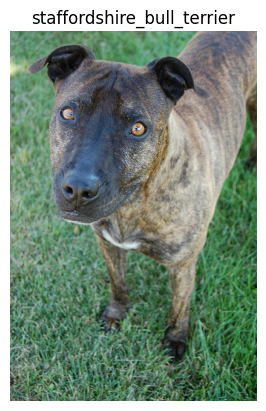

In [ ]:
img_path = first_key_samples[0]
img = PILImage.open(img_path)

plt.title(first_key)
plt.imshow(img)
plt.axis('off')
plt.show()

In [13]:
all_images_dict = {}
for c in class_list:
    all_images_dict[c] = list(data_dir.glob(f'{c}*.jpg'))

In [14]:
all_images_dict.keys()

dict_keys(['staffordshire_bull_terrier', 'scottish_terrier', 'pug', 'Siamese', 'shiba_inu', 'Bengal', 'Ragdoll', 'Maine_Coon', 'beagle', 'Persian', 'Abyssinian', 'american_bulldog'])

In [15]:
class_count = {k: len(v) for k, v in all_images_dict.items()}
class_count

{'staffordshire_bull_terrier': 191,
 'scottish_terrier': 199,
 'pug': 200,
 'Siamese': 200,
 'shiba_inu': 200,
 'Bengal': 200,
 'Ragdoll': 200,
 'Maine_Coon': 200,
 'beagle': 200,
 'Persian': 200,
 'Abyssinian': 200,
 'american_bulldog': 200}

In [16]:
all_images_dict

{'staffordshire_bull_terrier': [PosixPath('/content/drive/MyDrive/Magisterka/Datasets/The Oxford IIIT Pet Dataset/staffordshire_bull_terrier_128.jpg'),
  PosixPath('/content/drive/MyDrive/Magisterka/Datasets/The Oxford IIIT Pet Dataset/staffordshire_bull_terrier_32.jpg'),
  PosixPath('/content/drive/MyDrive/Magisterka/Datasets/The Oxford IIIT Pet Dataset/staffordshire_bull_terrier_170.jpg'),
  PosixPath('/content/drive/MyDrive/Magisterka/Datasets/The Oxford IIIT Pet Dataset/staffordshire_bull_terrier_55.jpg'),
  PosixPath('/content/drive/MyDrive/Magisterka/Datasets/The Oxford IIIT Pet Dataset/staffordshire_bull_terrier_24.jpg'),
  PosixPath('/content/drive/MyDrive/Magisterka/Datasets/The Oxford IIIT Pet Dataset/staffordshire_bull_terrier_184.jpg'),
  PosixPath('/content/drive/MyDrive/Magisterka/Datasets/The Oxford IIIT Pet Dataset/staffordshire_bull_terrier_97.jpg'),
  PosixPath('/content/drive/MyDrive/Magisterka/Datasets/The Oxford IIIT Pet Dataset/staffordshire_bull_terrier_20.jpg'),

In [17]:
class_count

{'staffordshire_bull_terrier': 191,
 'scottish_terrier': 199,
 'pug': 200,
 'Siamese': 200,
 'shiba_inu': 200,
 'Bengal': 200,
 'Ragdoll': 200,
 'Maine_Coon': 200,
 'beagle': 200,
 'Persian': 200,
 'Abyssinian': 200,
 'american_bulldog': 200}

In [18]:
class_count_4 = {k: v*4 for k, v in class_count.items()}
class_count_4

{'staffordshire_bull_terrier': 764,
 'scottish_terrier': 796,
 'pug': 800,
 'Siamese': 800,
 'shiba_inu': 800,
 'Bengal': 800,
 'Ragdoll': 800,
 'Maine_Coon': 800,
 'beagle': 800,
 'Persian': 800,
 'Abyssinian': 800,
 'american_bulldog': 800}

In [19]:
classes_to_fill = {}

for k in class_count.keys():
    classes_to_fill[k] = class_count_4[k] - class_count[k]

classes_to_fill

{'staffordshire_bull_terrier': 573,
 'scottish_terrier': 597,
 'pug': 600,
 'Siamese': 600,
 'shiba_inu': 600,
 'Bengal': 600,
 'Ragdoll': 600,
 'Maine_Coon': 600,
 'beagle': 600,
 'Persian': 600,
 'Abyssinian': 600,
 'american_bulldog': 600}

In [ ]:
print(f'The ratio of the smallest class to the largest: {min(class_count_4.values()) / max(class_count_4.values()):.2f}')

The ratio of the smallest class to the largest: 0.95


In [ ]:
print('Number of samples of maximum class to obtain a ratio of 3 to 7 between minimum and maximum class:', int(min(class_count_4.values())* 7 / 3))

Number of samples of maximum class to obtain a ratio of 3 to 7 between minimum and maximum class: 1782


In [20]:
desired_samples_per_class = np.linspace(min(class_count_4.values()), int(min(class_count_4.values())* 7 / 3), len(class_count_4), dtype='int')
desired_samples_per_class

array([ 764,  856,  949, 1041, 1134, 1226, 1319, 1411, 1504, 1596, 1689,
       1782])

In [21]:
for k in class_count.keys():
    classes_to_fill[k] = desired_samples_per_class[class_list.index(k)] - class_count[k]

classes_to_fill

{'staffordshire_bull_terrier': np.int64(573),
 'scottish_terrier': np.int64(657),
 'pug': np.int64(749),
 'Siamese': np.int64(841),
 'shiba_inu': np.int64(934),
 'Bengal': np.int64(1026),
 'Ragdoll': np.int64(1119),
 'Maine_Coon': np.int64(1211),
 'beagle': np.int64(1304),
 'Persian': np.int64(1396),
 'Abyssinian': np.int64(1489),
 'american_bulldog': np.int64(1582)}

In [22]:
def augment_image(image_path):
    image = tf.io.read_file(str(image_path))
    image = tf.image.decode_image(image, channels=3)
    image = tf.image.resize(image, [224, 224])

    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_brightness(image, max_delta=0.2)
    image = tf.image.random_contrast(image, lower=0.8, upper=1.2)
    image = tf.image.random_saturation(image, lower=0.8, upper=1.2)

    image = tf.clip_by_value(image, 0.0, 255.0) / 255.0

    if len(image.shape) == 4 and image.shape[0] == 1:
        image = tf.squeeze(image, axis=0)

    if image.shape != (224, 224, 3):
        raise ValueError(f"Image has unexpected shape: {image.shape}")

    return image.numpy()

In [23]:
X = []
y = []

for class_name, num_to_add in classes_to_fill.items():
    for _ in range(num_to_add):
        random_image_path = random.choice(all_images_dict[class_name])
        augmented_image = augment_image(random_image_path)
        X.append(augmented_image)
        y.append(class_dict[class_name])

In [24]:
for class_name, image_paths in all_images_dict.items():
    label = class_dict[class_name]
    for image_path in image_paths:
        try:
            image = load_img(image_path, target_size=(224, 224), color_mode='rgb')
            image_array = img_to_array(image) / 255.0
            X.append(image_array)
            y.append(label)
        except Exception as e:
            print(f"Image loading error {image_path}: {e}")

In [25]:
X = np.array(X, dtype=np.float32)
y = np.array(y, dtype=np.int32)

print(f"X shape: {X.shape}")
print(f"y shape: {y.shape}")

X shape: (15271, 224, 224, 3)
y shape: (15271,)


In [ ]:
print('Class indexes: {0[0]}, \nSamples per class: {0[1]}'.format(np.unique(y, return_counts=True)))

Class indexes: [ 0  1  2  3  4  5  6  7  8  9 10 11], 
Samples per class: [ 764  856  949 1041 1134 1226 1319 1411 1504 1596 1689 1782]


In [26]:
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

X_valid, X_test, y_valid, y_test = train_test_split(X_temp, y_temp, test_size=0.5, stratify=y_temp, random_state=42)

In [ ]:
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_valid shape: {X_valid.shape}, y_valid shape: {y_valid.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")

X_train shape: (10689, 224, 224, 3), y_train shape: (10689,)
X_valid shape: (2291, 224, 224, 3), y_valid shape: (2291,)
X_test shape: (2291, 224, 224, 3), y_test shape: (2291,)


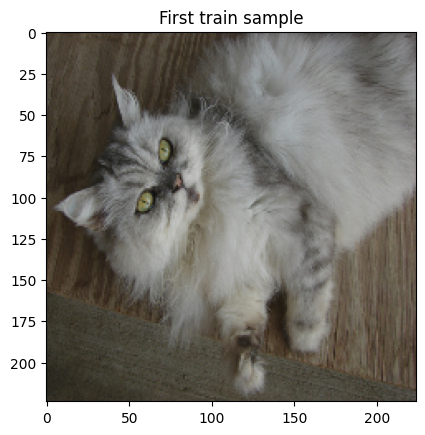

In [ ]:
plt.title('First train sample')
plt.imshow(X_train[0])
plt.show()

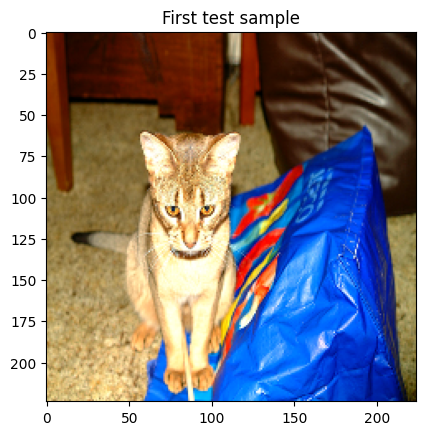

In [ ]:
plt.title('First test sample')
plt.imshow(X_test[0])
plt.show()

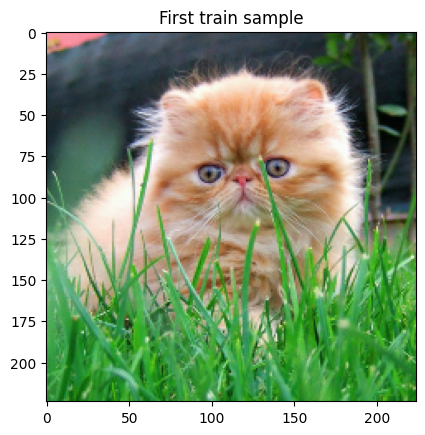

In [ ]:
plt.title('First train sample')
plt.imshow(X_valid[0])
plt.show()

In [ ]:
print('Unique classes (iterators): {0[0]}\nNumber of unique elements per class {0[1]}'.
      format(np.unique(y_train, return_counts=True)))

Unique classes (iterators): [ 0  1  2  3  4  5  6  7  8  9 10 11]
Number of unique elements per class [ 535  599  664  729  794  858  923  988 1053 1117 1182 1247]


In [ ]:
print(f'Number of classes: {len(np.unique(y_train))}')

Number of classes: 12


# Base architecture

## Model base

In [ ]:
model = Sequential([
    Input(shape=X_train.shape[1:]),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPool2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPool2D((2, 2)),

    Flatten(),
    Dense(128, activation='relu'),
    Dense(len(np.unique(y_train)), activation='softmax'),
])

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,908,940 (91.21 MB)

 Trainable params: 23,908,940 (91.21 MB)

 Non-trainable params: 0 (0.00 B)

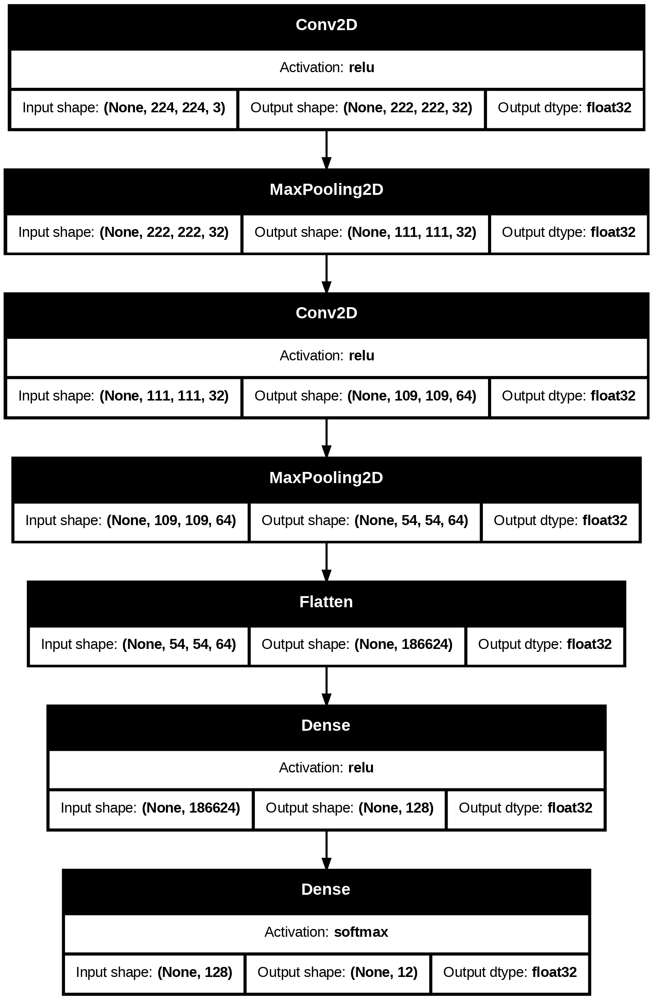

In [ ]:
try:
    plot_model(model, 'model1_base.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model1_base.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10,
                                                  restore_best_weights=True, verbose=1)

epochs = 100
batch_size = 32

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - accuracy: 0.2575 - loss: 2.7237 - val_accuracy: 0.7577 - val_loss: 0.8516
Epoch 2/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.8966 - loss: 0.3893 - val_accuracy: 0.9267 - val_loss: 0.3207
Epoch 3/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9913 - loss: 0.0411 - val_accuracy: 0.9350 - val_loss: 0.3265
Epoch 4/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9978 - loss: 0.0120 - val_accuracy: 0.9398 - val_loss: 0.3790
Epoch 5/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9996 - loss: 0.0036 - val_accuracy: 0.9402 - val_loss: 0.4066
Epoch 6/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 1.0000 - loss: 6.7965e-04 - val_accuracy: 0.9428 - val_loss: 0.4410
Epoch 7/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 1.0000 - loss: 1.5944e-04 - val_accuracy: 0.9419 - val_loss: 0.4615
Epoch 8/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 1.0000 - loss: 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model1_base - loss: {loss}, accuracy: {acc}')

model1_base - loss: 0.3498593866825104, accuracy: 0.9179397821426392


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[1.8235020637512207,
 0.32654130458831787,
 0.03455106541514397,
 0.013692246749997139,
 0.0021885689347982407,
 0.0005081153358332813,
 0.00015029152564238757,
 9.844849410001189e-05,
 7.10515450919047e-05,
 5.391140439314768e-05,
 4.1935571061912924e-05,
 3.318105518701486e-05]

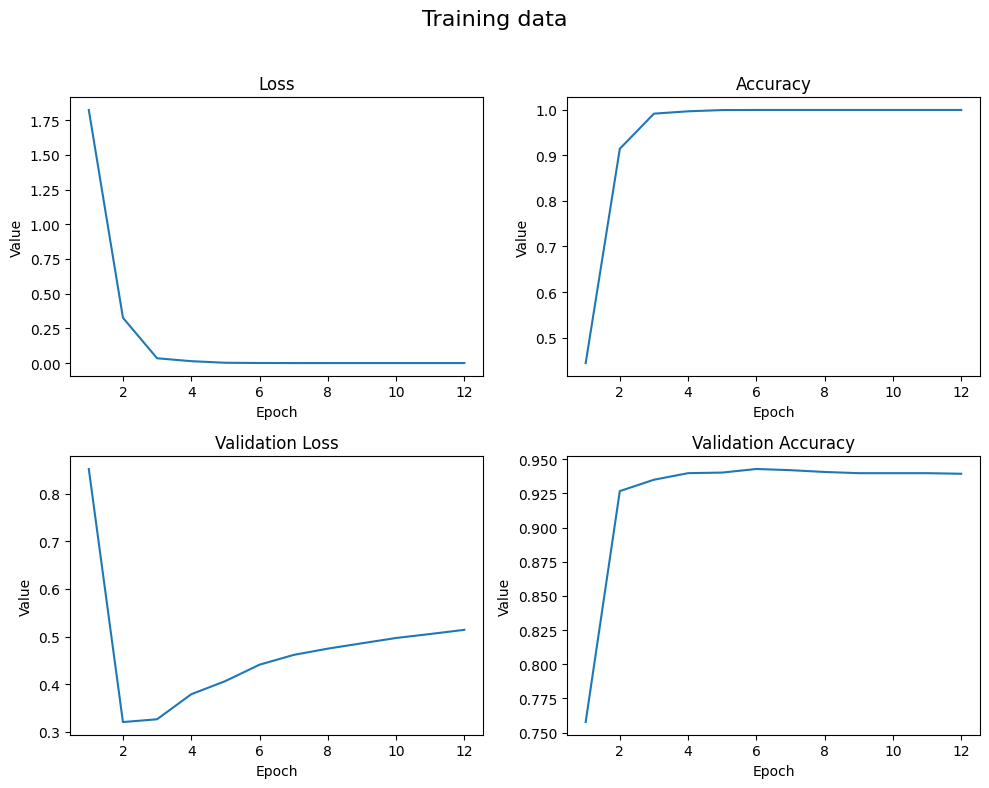

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

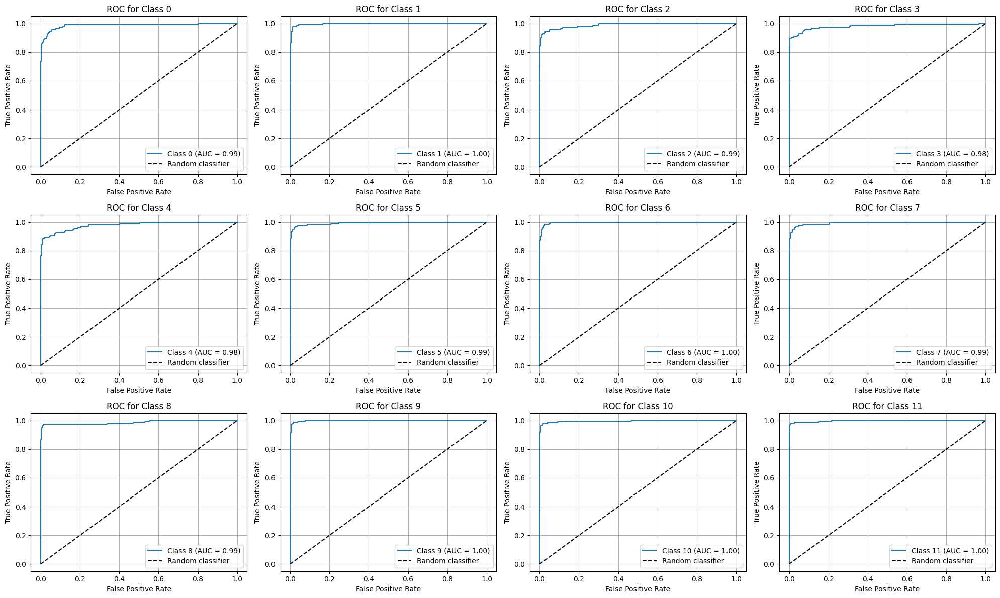

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

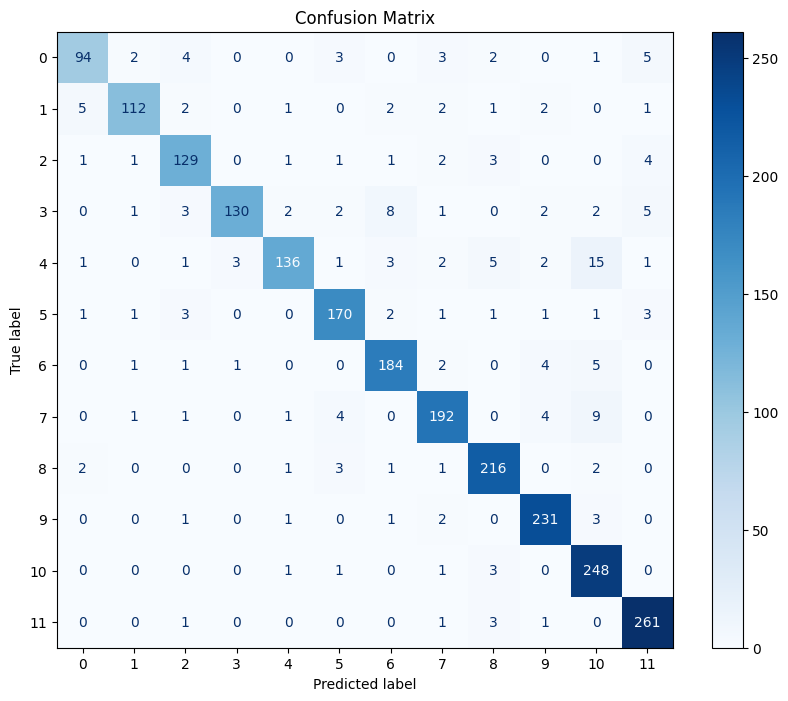

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.9179397642950676


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.90      0.82      0.86       114
           1       0.94      0.88      0.91       128
           2       0.88      0.90      0.89       143
           3       0.97      0.83      0.90       156
           4       0.94      0.80      0.87       170
           5       0.92      0.92      0.92       184
           6       0.91      0.93      0.92       198
           7       0.91      0.91      0.91       212
           8       0.92      0.96      0.94       226
           9       0.94      0.97      0.95       239
          10       0.87      0.98      0.92       254
          11       0.93      0.98      0.95       267

    accuracy                           0.92      2291
   macro avg       0.92      0.91      0.91      2291
weighted avg       0.92      0.92      0.92      2291



## Model l1 = 0.01

In [28]:
input_shape = X_train.shape[1:]
num_classes = len(np.unique(y_train))

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation="relu", kernel_regularizer=l1(0.01)),
    MaxPool2D((2, 2)),
    Conv2D(64, (3, 3), activation="relu", kernel_regularizer=l1(0.01)),
    MaxPool2D((2, 2)),
    Flatten(),
    Dense(128, activation="relu", kernel_regularizer=l1(0.01)),
    Dense(num_classes, activation="softmax"),
])

In [ ]:
model.compile(
    optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"]
)

In [ ]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)                    │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,908,940 (91.21 MB)

 Trainable params: 23,908,940 (91.21 MB)

 Non-trainable params: 0 (0.00 B)

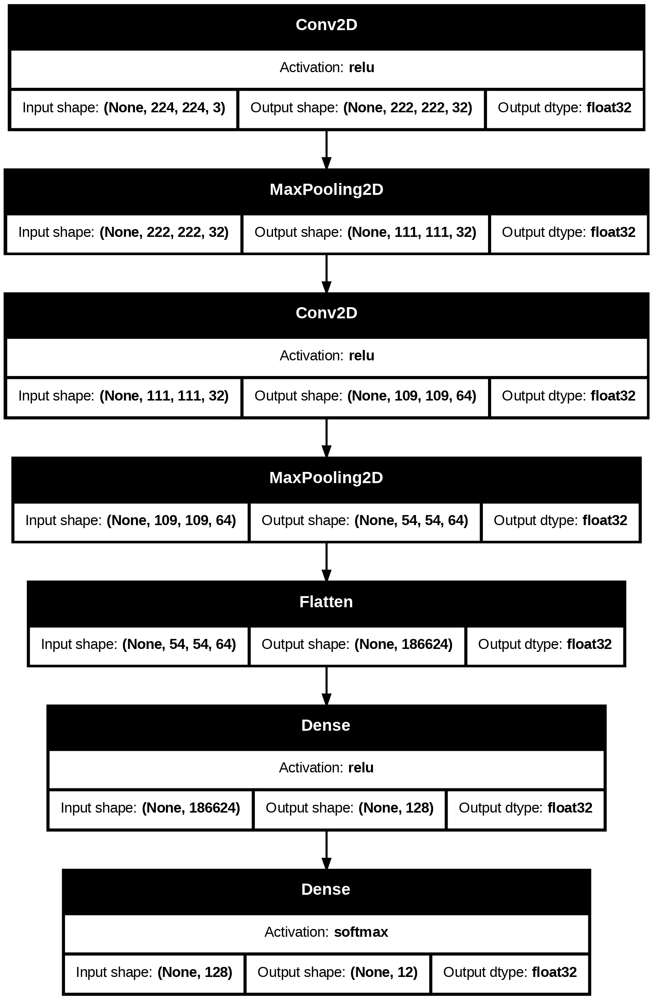

In [ ]:
try:
    plot_model(model, "model1_l1_001.png", show_dtype=True,
        show_shapes=True, show_layer_activations=True,)
    display(Image("model1_l1_001.png"))
except Exception as e:
    print(f"Error occurred: {e}")

In [33]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss", patience=10, restore_best_weights=True, verbose=1
)

epochs = 100
batch_size = 32

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - accuracy: 0.1098 - loss: 81.0075 - val_accuracy: 0.1170 - val_loss: 32.4436
Epoch 2/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1110 - loss: 31.4507 - val_accuracy: 0.1170 - val_loss: 32.6169
Epoch 3/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1129 - loss: 31.4132 - val_accuracy: 0.1170 - val_loss: 30.9067
Epoch 4/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1140 - loss: 31.3112 - val_accuracy: 0.1170 - val_loss: 31.1342
Epoch 5/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1065 - loss: 31.2976 - val_accuracy: 0.1170 - val_loss: 31.7484
Epoch 6/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1180 - loss: 31.3019 - val_accuracy: 0.1170 - val_loss: 31.7731
Epoch 7/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1213 - loss: 31.2850 - val_accuracy: 0.1170 - val_loss: 31.4616
Epoch 8/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1168 - 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f"model1_l1_001 - loss: {loss}, accuracy: {acc}")

model1_l1_001 - loss: 30.906461715698242, accuracy: 0.1165429949760437


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data["loss"]

[43.568565368652344,
 31.413240432739258,
 31.369810104370117,
 31.29771614074707,
 31.30126190185547,
 31.29682159423828,
 31.282451629638672,
 31.27675437927246,
 31.279653549194336,
 31.2763671875,
 31.271751403808594,
 31.26947021484375,
 31.2668514251709]

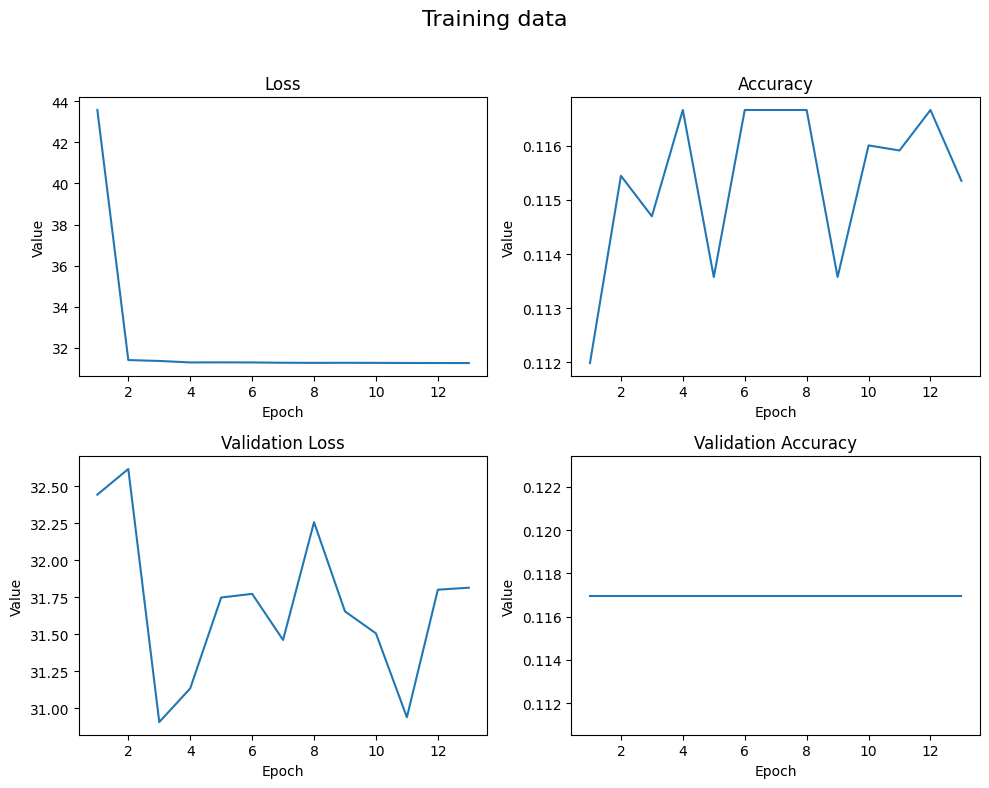

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

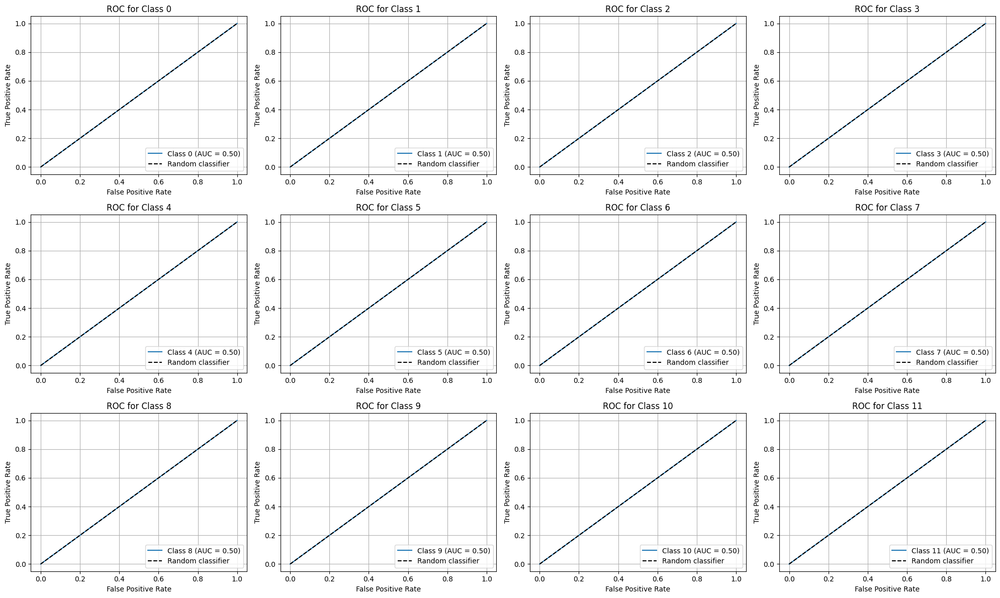

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
    ax.plot([0, 1], [0, 1], "k--", label="Random classifier")
    ax.set_title(f"ROC for Class {i}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right")
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

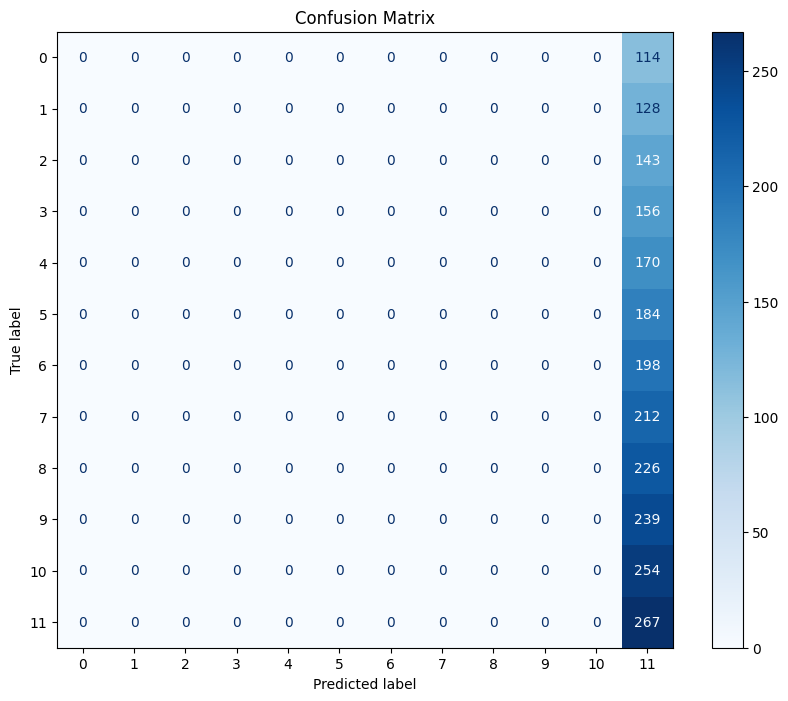

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap="Blues", colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.116542994325622


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       114
           1       0.00      0.00      0.00       128
           2       0.00      0.00      0.00       143
           3       0.00      0.00      0.00       156
           4       0.00      0.00      0.00       170
           5       0.00      0.00      0.00       184
           6       0.00      0.00      0.00       198
           7       0.00      0.00      0.00       212
           8       0.00      0.00      0.00       226
           9       0.00      0.00      0.00       239
          10       0.00      0.00      0.00       254
          11       0.12      1.00      0.21       267

    accuracy                           0.12      2291
   macro avg       0.01      0.08      0.02      2291
weighted avg       0.01      0.12      0.02      2291



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Model l1 = 0.001

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation="relu", kernel_regularizer=l1(0.001)),
    MaxPool2D((2, 2)),
    Conv2D(64, (3, 3), activation="relu", kernel_regularizer=l1(0.001)),
    MaxPool2D((2, 2)),
    Flatten(),
    Dense(128, activation="relu", kernel_regularizer=l1(0.001)),
    Dense(num_classes, activation="softmax"),
])

In [ ]:
model.compile(
    optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"]
)

In [ ]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)                    │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,908,940 (91.21 MB)

 Trainable params: 23,908,940 (91.21 MB)

 Non-trainable params: 0 (0.00 B)

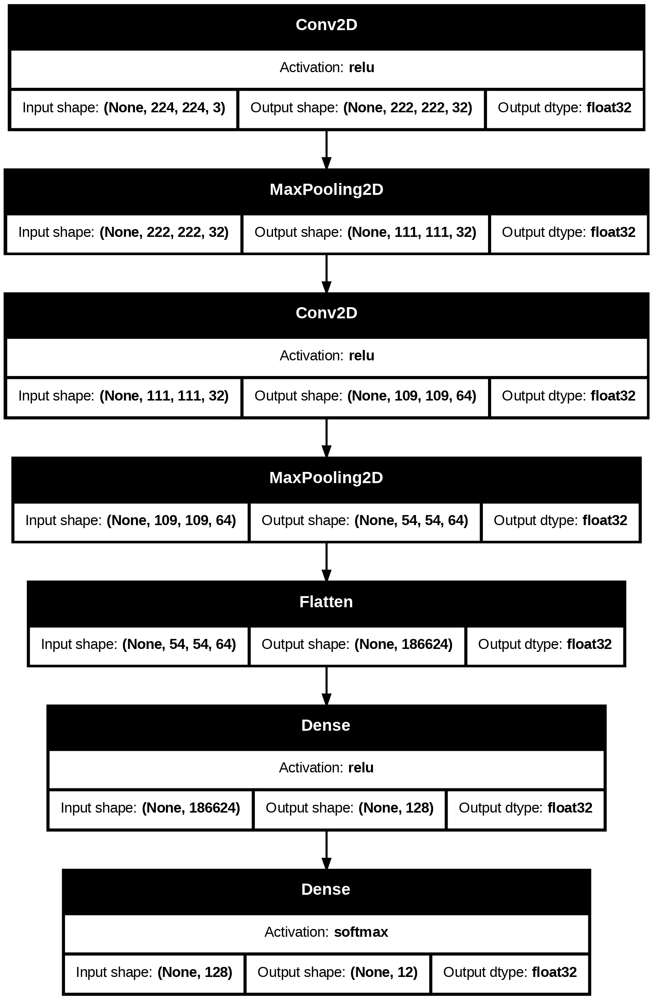

In [ ]:
try:
    plot_model(model, "model1_l1_0001.png", show_dtype=True,
        show_shapes=True, show_layer_activations=True,)
    display(Image("model1_l1_0001.png"))
except Exception as e:
    print(f"Error occurred: {e}")

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.1090 - loss: 11.3956 - val_accuracy: 0.1419 - val_loss: 5.6647
Epoch 2/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1453 - loss: 5.5558 - val_accuracy: 0.1737 - val_loss: 5.5720
Epoch 3/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1713 - loss: 5.4586 - val_accuracy: 0.1816 - val_loss: 5.3683
Epoch 4/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1830 - loss: 5.4006 - val_accuracy: 0.1707 - val_loss: 5.3468
Epoch 5/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1991 - loss: 5.3582 - val_accuracy: 0.1410 - val_loss: 5.5672
Epoch 6/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1183 - loss: 5.5372 - val_accuracy: 0.1296 - val_loss: 5.4515
Epoch 7/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1431 - loss: 5.3911 - val_accuracy: 0.1711 - val_loss: 5.3574
Epoch 8/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1755 - loss: 5.3416 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f"model1_l1_0001 - loss: {loss}, accuracy: {acc}")

model1_l1_0001 - loss: 5.074486255645752, accuracy: 0.27367961406707764


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data["loss"]

[7.023741722106934,
 5.532103538513184,
 5.439162731170654,
 5.38377046585083,
 5.34956693649292,
 5.446794509887695,
 5.376628398895264,
 5.333277225494385,
 5.3205084800720215,
 5.2922892570495605,
 5.275657653808594,
 5.267274856567383,
 5.234370708465576,
 5.278918266296387,
 5.218437194824219,
 5.207818984985352,
 5.238636493682861,
 5.216987609863281,
 5.197275161743164,
 5.186094284057617,
 5.18302583694458,
 5.1900177001953125,
 5.174888610839844,
 5.164789199829102,
 5.1693525314331055,
 5.152222156524658,
 5.161513328552246,
 5.167609691619873,
 5.152292728424072,
 5.13717794418335,
 5.151919364929199,
 5.128144264221191,
 5.136007308959961,
 5.14271879196167,
 5.127949237823486,
 5.138077259063721,
 5.124638080596924,
 5.130196571350098,
 5.11043643951416,
 5.1165666580200195,
 5.1019134521484375,
 5.104393005371094,
 5.113668441772461,
 5.112425804138184,
 5.10421085357666,
 5.116575717926025,
 5.129857063293457,
 5.091810703277588,
 5.094846725463867]

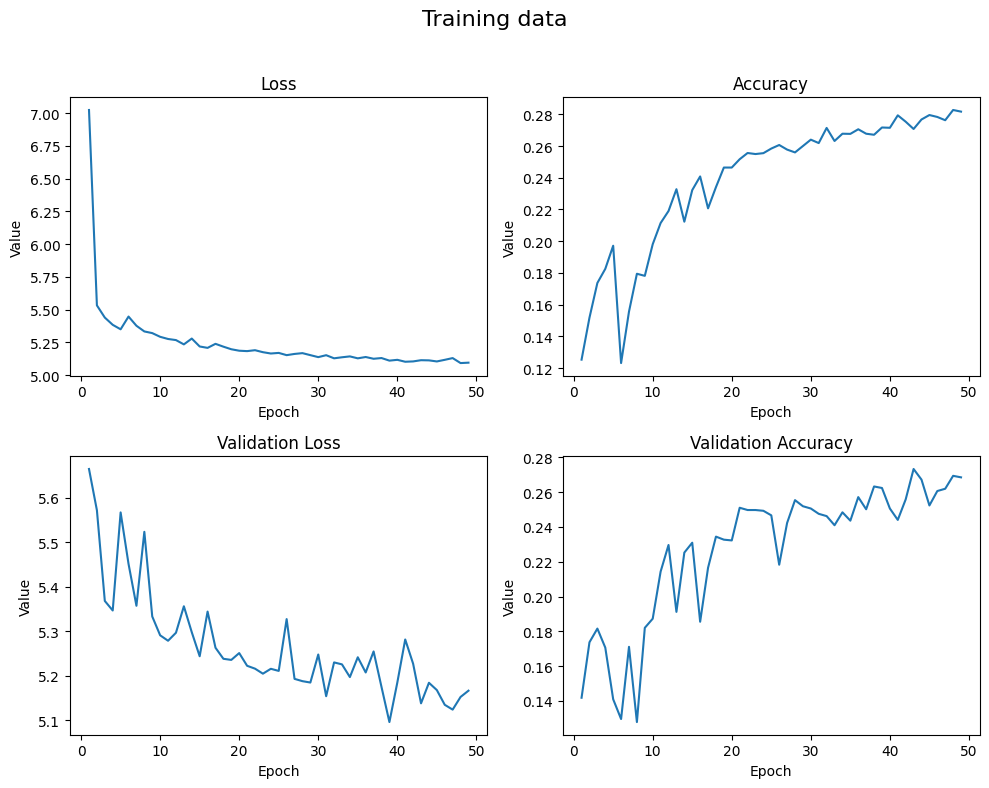

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

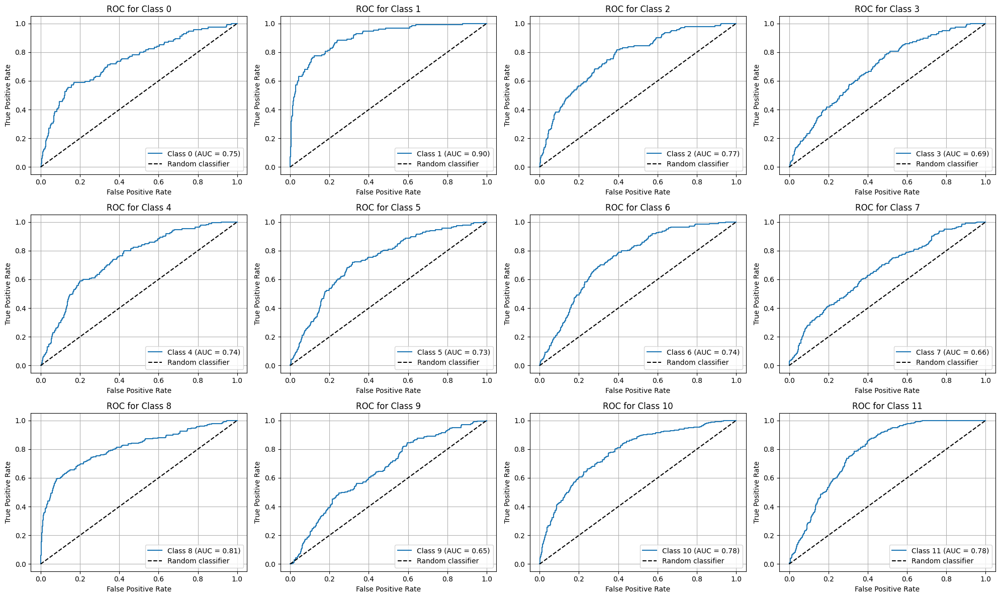

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
    ax.plot([0, 1], [0, 1], "k--", label="Random classifier")
    ax.set_title(f"ROC for Class {i}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right")
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

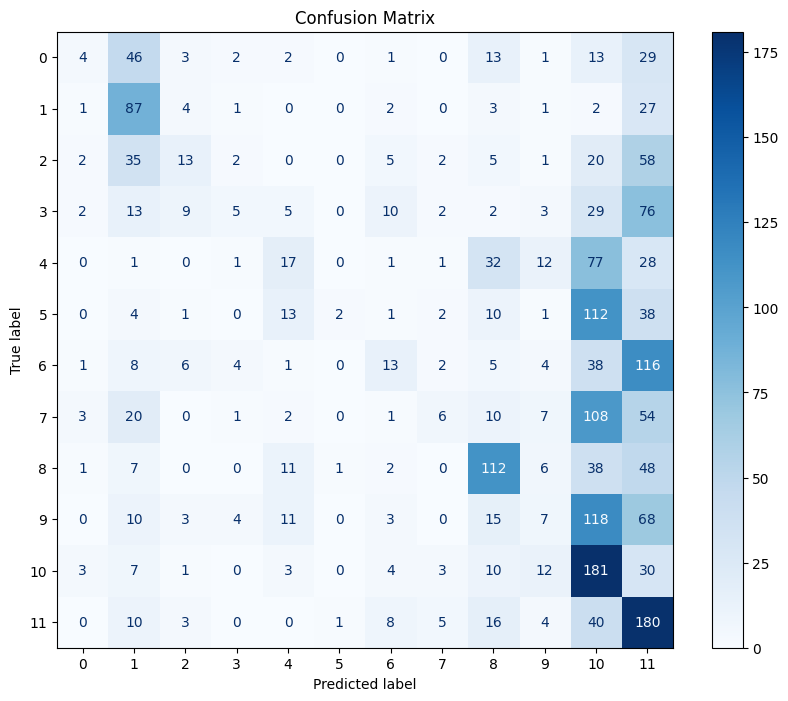

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap="Blues", colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.2736796158882584


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.24      0.04      0.06       114
           1       0.35      0.68      0.46       128
           2       0.30      0.09      0.14       143
           3       0.25      0.03      0.06       156
           4       0.26      0.10      0.14       170
           5       0.50      0.01      0.02       184
           6       0.25      0.07      0.10       198
           7       0.26      0.03      0.05       212
           8       0.48      0.50      0.49       226
           9       0.12      0.03      0.05       239
          10       0.23      0.71      0.35       254
          11       0.24      0.67      0.35       267

    accuracy                           0.27      2291
   macro avg       0.29      0.25      0.19      2291
weighted avg       0.29      0.27      0.20      2291



## Model l2 = 0.01

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation="relu", kernel_regularizer=l2(0.01)),
    MaxPool2D((2, 2)),
    Conv2D(64, (3, 3), activation="relu", kernel_regularizer=l2(0.01)),
    MaxPool2D((2, 2)),
    Flatten(),
    Dense(128, activation="relu", kernel_regularizer=l2(0.01)),
    Dense(num_classes, activation="softmax"),
])

In [ ]:
model.compile(
    optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"]
)

In [ ]:
model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)                    │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,908,940 (91.21 MB)

 Trainable params: 23,908,940 (91.21 MB)

 Non-trainable params: 0 (0.00 B)

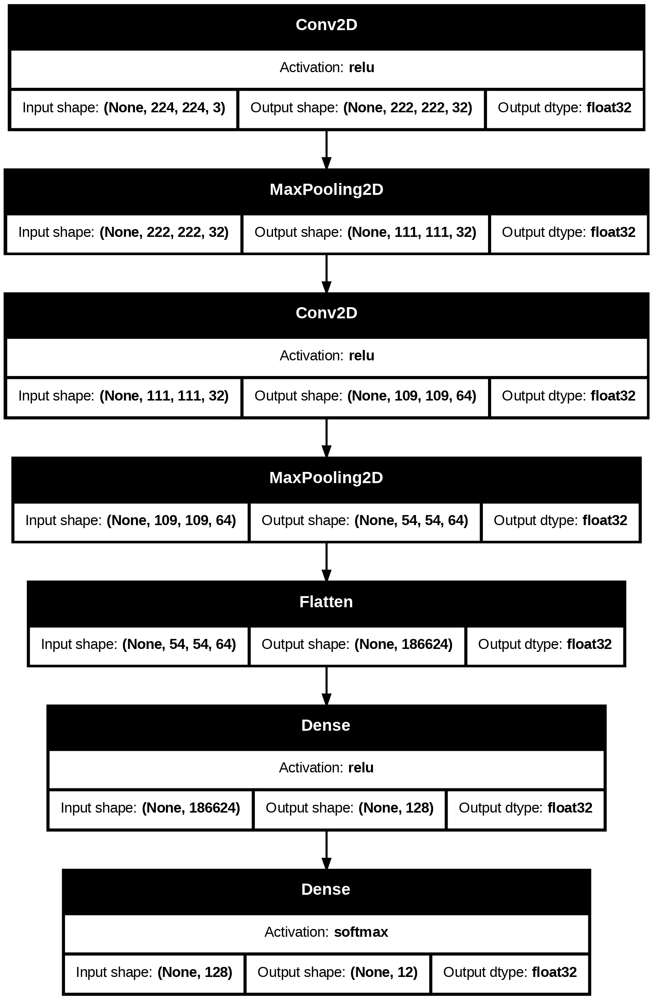

In [ ]:
try:
    plot_model(
        model,
        "model1_l2_001.png",
        show_dtype=True,
        show_shapes=True,
        show_layer_activations=True,
    )
    display(Image("model1_l2_001.png"))
except Exception as e:
    print(f"Error occurred: {e}")

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - accuracy: 0.1862 - loss: 3.7828 - val_accuracy: 0.3060 - val_loss: 2.6843
Epoch 2/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.4012 - loss: 2.6101 - val_accuracy: 0.4518 - val_loss: 2.5653
Epoch 3/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.5272 - loss: 2.3638 - val_accuracy: 0.5722 - val_loss: 2.4232
Epoch 4/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.6099 - loss: 2.2949 - val_accuracy: 0.6224 - val_loss: 2.3121
Epoch 5/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.7189 - loss: 2.0511 - val_accuracy: 0.7176 - val_loss: 2.0617
Epoch 6/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.7746 - loss: 1.8718 - val_accuracy: 0.7281 - val_loss: 2.0448
Epoch 7/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.8224 - loss: 1.7146 - val_accuracy: 0.7804 - val_loss: 1.9222
Epoch 8/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.8529 - loss: 1.6075 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f"model1_l2_001 - loss: {loss}, accuracy: {acc}")

model1_l2_001 - loss: 1.4110419750213623, accuracy: 0.8594500422477722


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data["loss"]

[3.043052911758423,
 2.561540365219116,
 2.3797457218170166,
 2.2614922523498535,
 2.0956926345825195,
 1.9345499277114868,
 1.8256468772888184,
 1.6914470195770264,
 1.6523979902267456,
 1.5815340280532837,
 1.658340573310852,
 1.4237275123596191,
 1.442865014076233,
 1.4201247692108154,
 1.31114661693573,
 1.3052226305007935,
 1.2664015293121338,
 1.2743868827819824,
 1.1970852613449097,
 1.3133379220962524,
 1.1477806568145752,
 1.1908177137374878,
 1.182591199874878,
 1.2183951139450073,
 1.130319595336914,
 1.1317553520202637,
 1.1105989217758179,
 1.1524158716201782,
 1.1338186264038086,
 1.1185142993927002,
 1.2375538349151611,
 1.0929620265960693,
 1.0779292583465576,
 1.2445963621139526,
 1.0254439115524292,
 1.1142841577529907,
 1.0567576885223389,
 1.0914716720581055,
 1.043813943862915,
 1.1877497434616089,
 0.9941219091415405,
 1.0363918542861938,
 1.0511226654052734,
 1.0108054876327515,
 0.9929229617118835,
 1.03883695602417,
 1.0005971193313599,
 1.045992136001587]

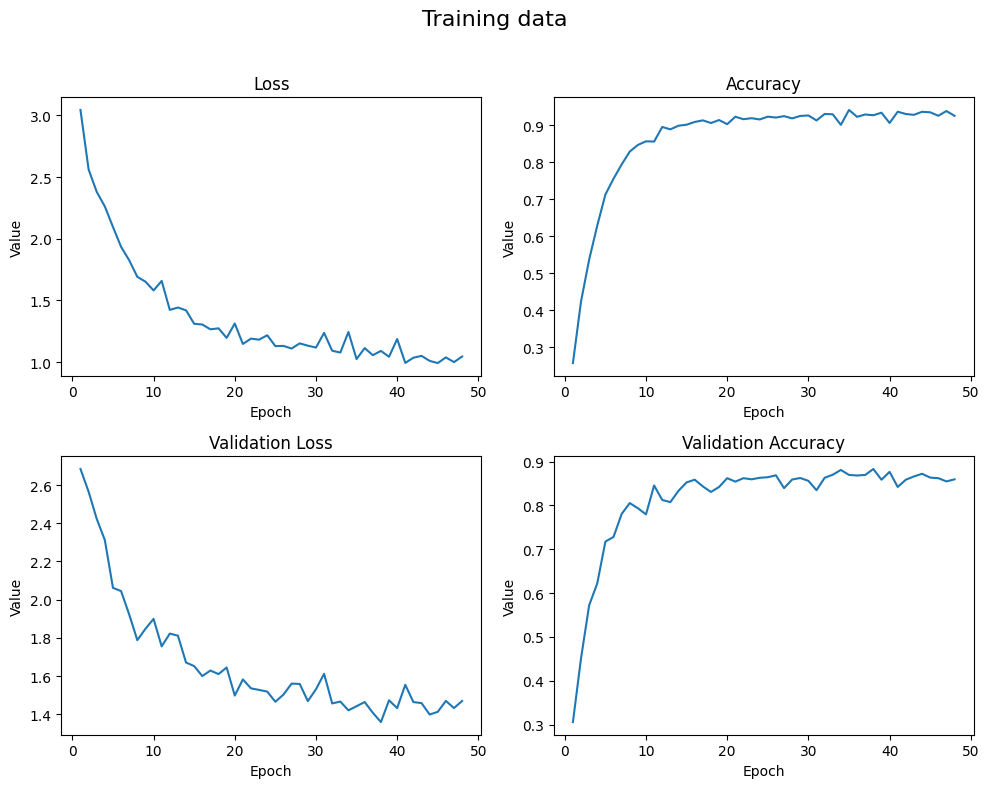

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

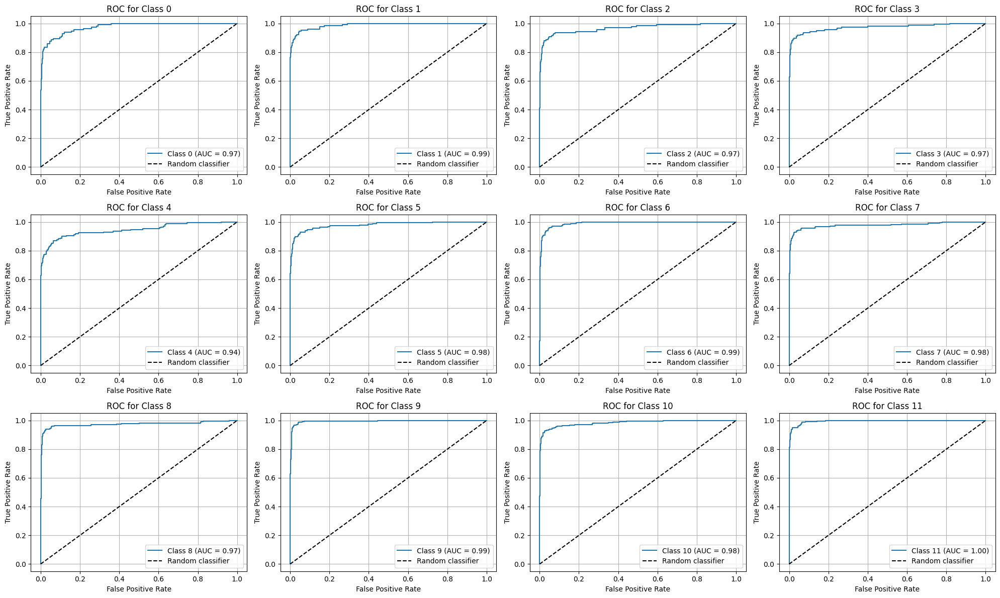

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
    ax.plot([0, 1], [0, 1], "k--", label="Random classifier")
    ax.set_title(f"ROC for Class {i}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right")
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

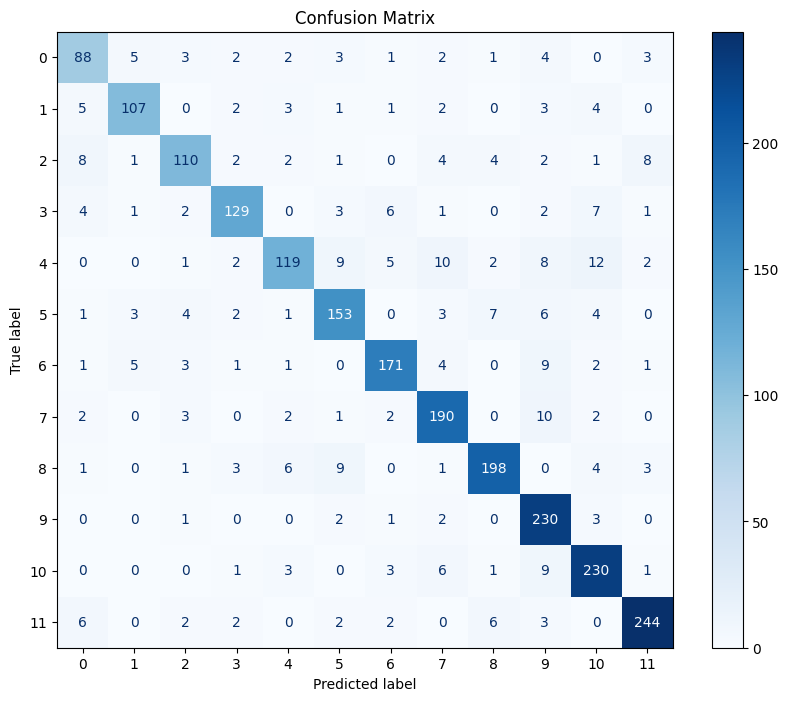

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap="Blues", colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.8594500218245308


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.76      0.77      0.77       114
           1       0.88      0.84      0.86       128
           2       0.85      0.77      0.81       143
           3       0.88      0.83      0.85       156
           4       0.86      0.70      0.77       170
           5       0.83      0.83      0.83       184
           6       0.89      0.86      0.88       198
           7       0.84      0.90      0.87       212
           8       0.90      0.88      0.89       226
           9       0.80      0.96      0.88       239
          10       0.86      0.91      0.88       254
          11       0.93      0.91      0.92       267

    accuracy                           0.86      2291
   macro avg       0.86      0.85      0.85      2291
weighted avg       0.86      0.86      0.86      2291



## Model l2 = 0.001

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation="relu", kernel_regularizer=l2(0.001)),
    MaxPool2D((2, 2)),
    Conv2D(64, (3, 3), activation="relu", kernel_regularizer=l2(0.001)),
    MaxPool2D((2, 2)),
    Flatten(),
    Dense(128, activation="relu", kernel_regularizer=l2(0.001)),
    Dense(num_classes, activation="softmax"),
])

In [ ]:
model.compile(
    optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"]
)

In [ ]:
model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_8 (Conv2D)                    │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,908,940 (91.21 MB)

 Trainable params: 23,908,940 (91.21 MB)

 Non-trainable params: 0 (0.00 B)

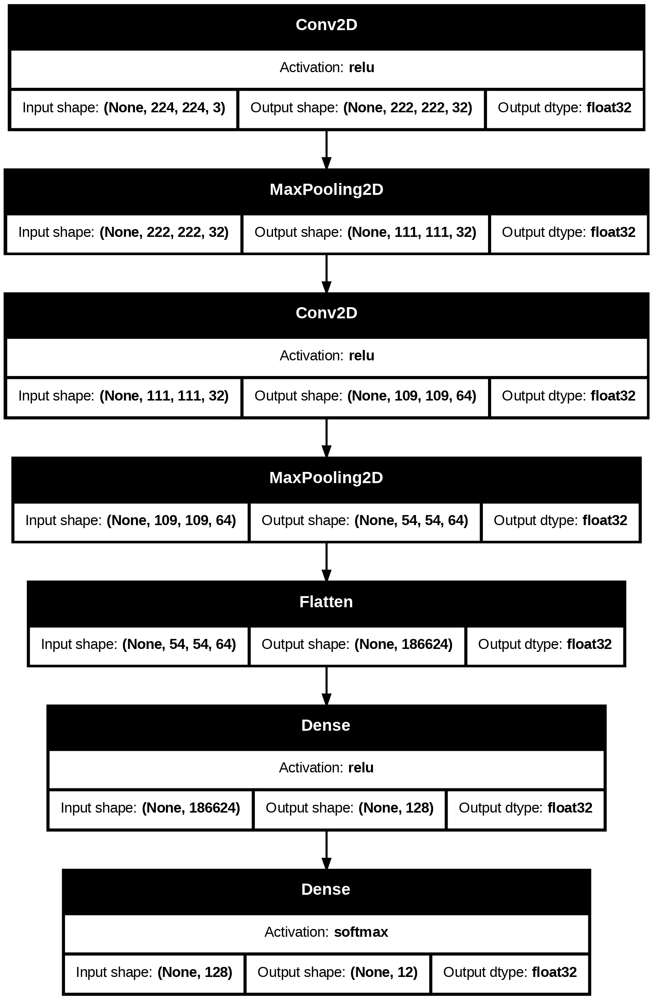

In [ ]:
try:
    plot_model(
        model,
        "model1_l2_0001.png",
        show_dtype=True,
        show_shapes=True,
        show_layer_activations=True,
    )
    display(Image("model1_l2_0001.png"))
except Exception as e:
    print(f"Error occurred: {e}")

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - accuracy: 0.2458 - loss: 3.0968 - val_accuracy: 0.6176 - val_loss: 1.8789
Epoch 2/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.7479 - loss: 1.5405 - val_accuracy: 0.8320 - val_loss: 1.2607
Epoch 3/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9083 - loss: 1.0149 - val_accuracy: 0.8651 - val_loss: 1.2406
Epoch 4/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9411 - loss: 0.8976 - val_accuracy: 0.8891 - val_loss: 1.1480
Epoch 5/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9450 - loss: 0.8750 - val_accuracy: 0.8835 - val_loss: 1.1138
Epoch 6/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9661 - loss: 0.7359 - val_accuracy: 0.9014 - val_loss: 1.0177
Epoch 7/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9676 - loss: 0.7273 - val_accuracy: 0.8952 - val_loss: 1.1216
Epoch 8/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9637 - loss: 0.7458 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f"model1_l2_0001 - loss: {loss}, accuracy: {acc}")

model1_l2_0001 - loss: 0.8546677231788635, accuracy: 0.9144478440284729


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data["loss"]

[2.3883087635040283,
 1.44312584400177,
 1.0290528535842896,
 0.9268648028373718,
 0.8647186160087585,
 0.7744492292404175,
 0.7523632645606995,
 0.7387795448303223,
 0.6809291839599609,
 0.6191161870956421,
 0.6635958552360535,
 0.6415623426437378,
 0.5793134570121765,
 0.5911925435066223,
 0.6349723935127258,
 0.529516339302063,
 0.5241754651069641,
 0.5459462404251099,
 0.5464652180671692,
 0.5164543390274048,
 0.5906903743743896,
 0.5848165154457092,
 0.39791473746299744,
 0.40959373116493225,
 0.5301642417907715,
 0.4824278652667999,
 0.4466402530670166,
 0.44813159108161926,
 0.4264700710773468,
 0.5233518481254578,
 0.4008999168872833,
 0.35922208428382874,
 0.4408201575279236]

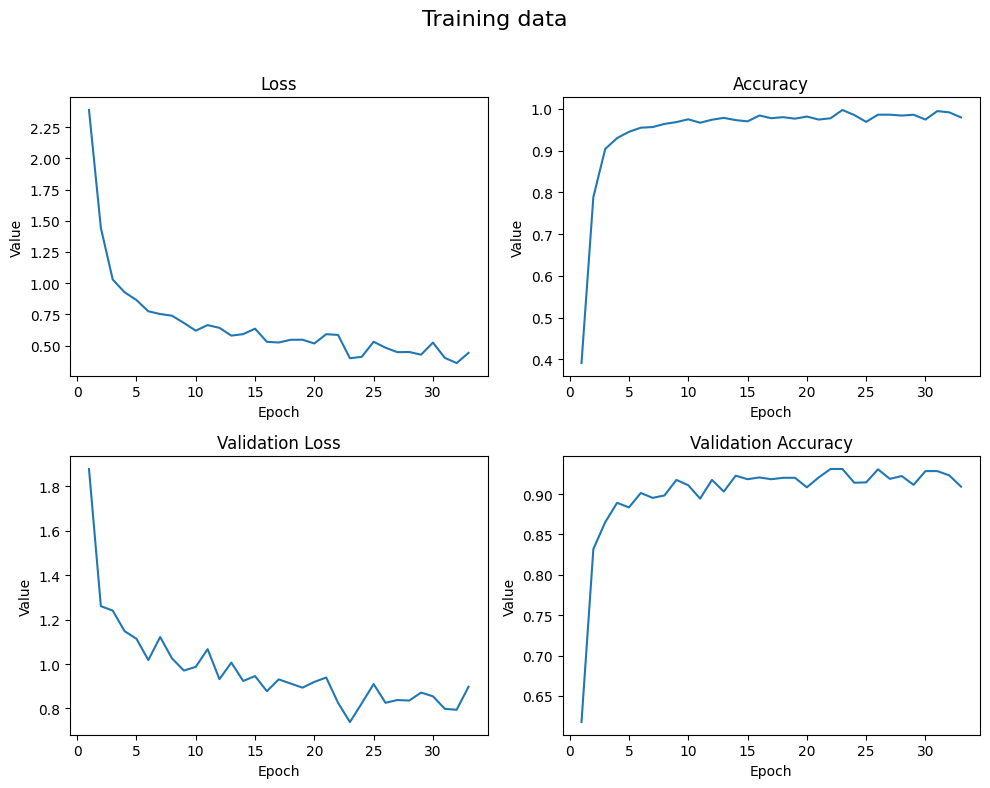

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

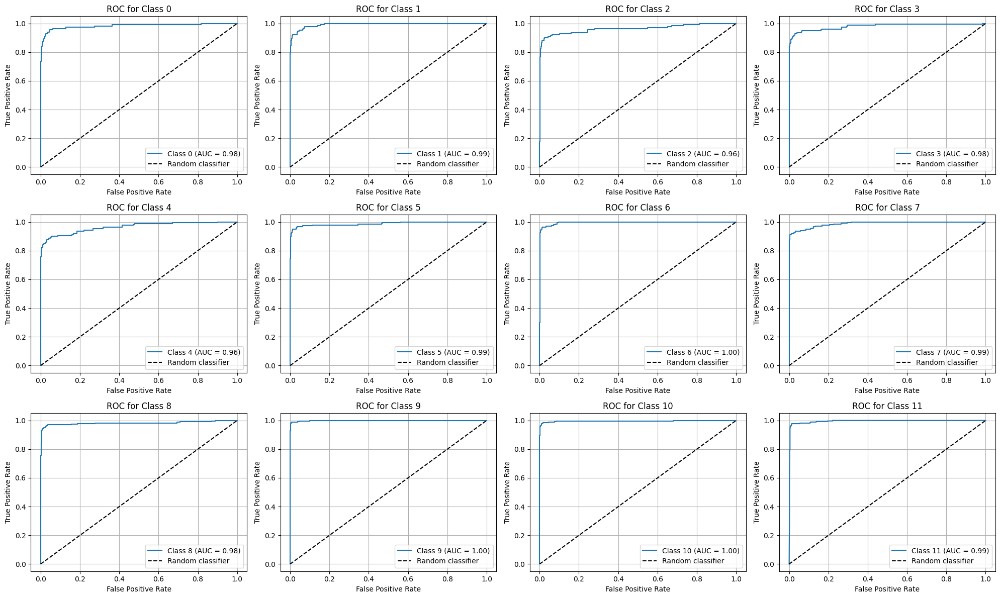

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
    ax.plot([0, 1], [0, 1], "k--", label="Random classifier")
    ax.set_title(f"ROC for Class {i}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right")
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

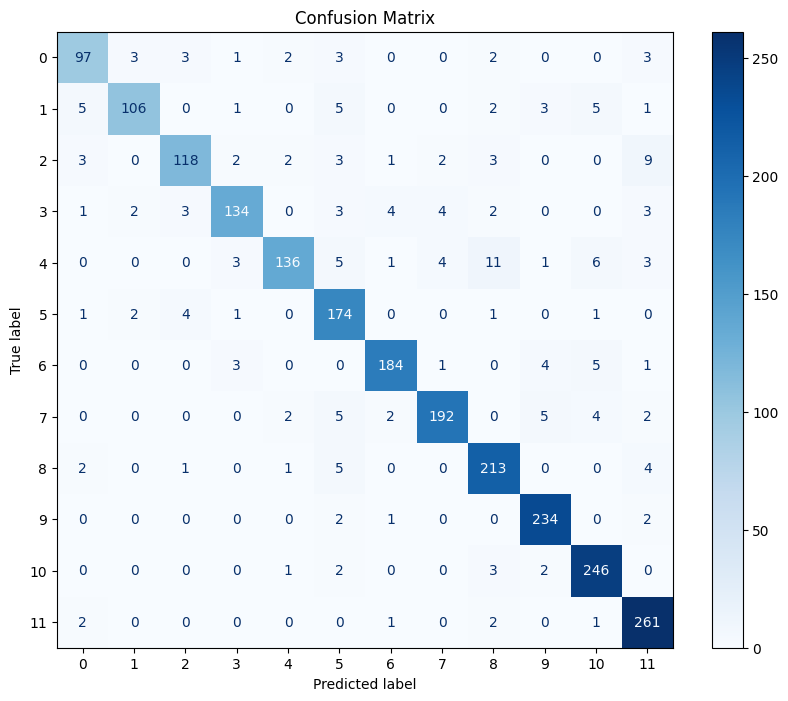

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap="Blues", colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.9144478393714535


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.85      0.86       114
           1       0.94      0.83      0.88       128
           2       0.91      0.83      0.87       143
           3       0.92      0.86      0.89       156
           4       0.94      0.80      0.87       170
           5       0.84      0.95      0.89       184
           6       0.95      0.93      0.94       198
           7       0.95      0.91      0.93       212
           8       0.89      0.94      0.92       226
           9       0.94      0.98      0.96       239
          10       0.92      0.97      0.94       254
          11       0.90      0.98      0.94       267

    accuracy                           0.91      2291
   macro avg       0.92      0.90      0.91      2291
weighted avg       0.92      0.91      0.91      2291



## Model dropout = 0.2

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation="relu"),
    MaxPool2D((2, 2)),
    Dropout(0.2),
    Conv2D(64, (3, 3), activation="relu"),
    MaxPool2D((2, 2)),
    Dropout(0.2),
    Flatten(),
    Dense(128, activation="relu"),
    Dropout(0.2),
    Dense(num_classes, activation="softmax"),
])

In [ ]:
model.compile(
    optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"]
)

In [ ]:
model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_10 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_5 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,908,940 (91.21 MB)

 Trainable params: 23,908,940 (91.21 MB)

 Non-trainable params: 0 (0.00 B)

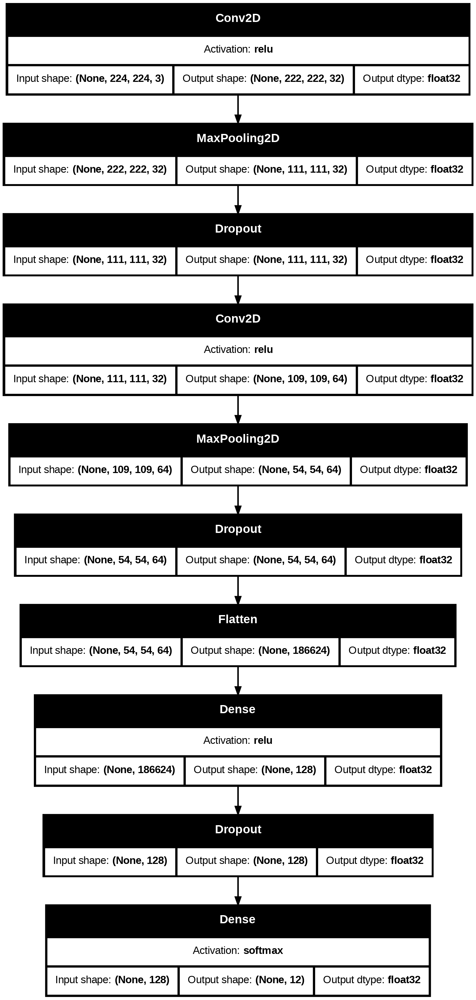

In [ ]:
try:
    plot_model(
        model,
        "model1_dropout_02.png",
        show_dtype=True,
        show_shapes=True,
        show_layer_activations=True,
    )
    display(Image("model1_dropout_02.png"))
except Exception as e:
    print(f"Error occurred: {e}")

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - accuracy: 0.2173 - loss: 3.2914 - val_accuracy: 0.6844 - val_loss: 1.0799
Epoch 2/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.7896 - loss: 0.7432 - val_accuracy: 0.9009 - val_loss: 0.4177
Epoch 3/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9557 - loss: 0.1696 - val_accuracy: 0.9367 - val_loss: 0.3002
Epoch 4/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9831 - loss: 0.0695 - val_accuracy: 0.9406 - val_loss: 0.3528
Epoch 5/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9879 - loss: 0.0495 - val_accuracy: 0.9358 - val_loss: 0.3364
Epoch 6/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9901 - loss: 0.0387 - val_accuracy: 0.9363 - val_loss: 0.3747
Epoch 7/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9886 - loss: 0.0403 - val_accuracy: 0.9376 - val_loss: 0.3737
Epoch 8/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9904 - loss: 0.0379 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f"model1_dropout_02 - loss: {loss}, accuracy: {acc}")

model1_dropout_02 - loss: 0.3405783176422119, accuracy: 0.9305980205535889


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data["loss"]

[2.1285367012023926,
 0.6438203454017639,
 0.1752110868692398,
 0.07315783947706223,
 0.06728709489107132,
 0.042365506291389465,
 0.03957774117588997,
 0.03863755613565445,
 0.04332572594285011,
 0.02557072974741459,
 0.024826636537909508,
 0.02191704511642456,
 0.020611513406038284]

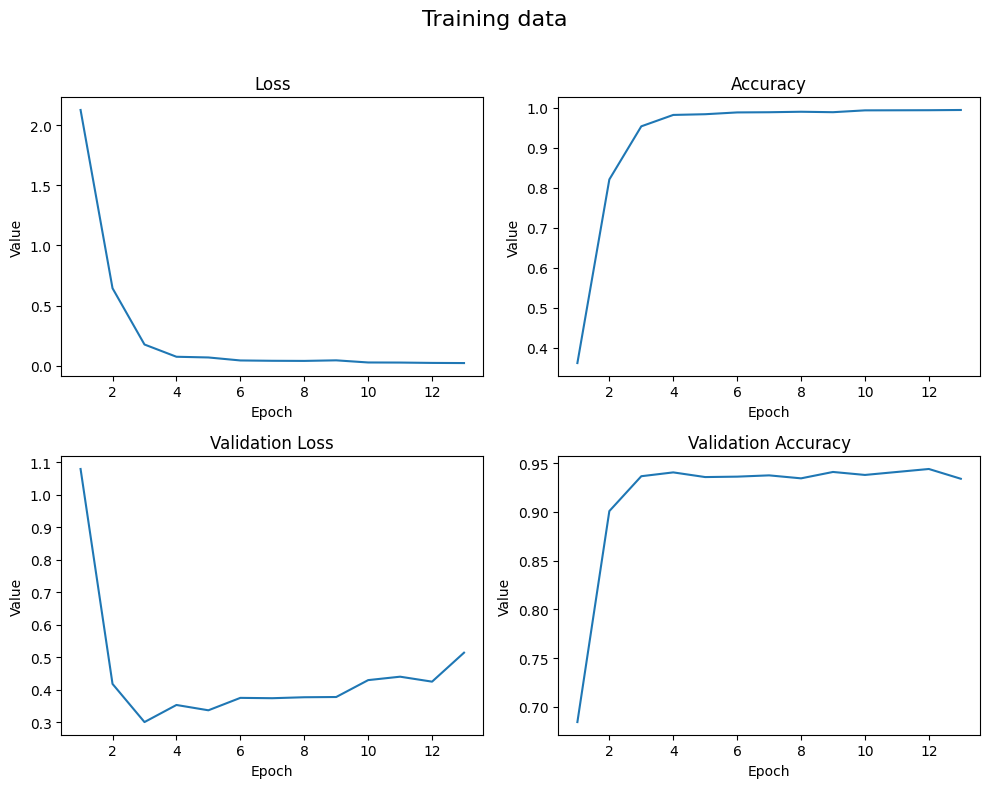

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

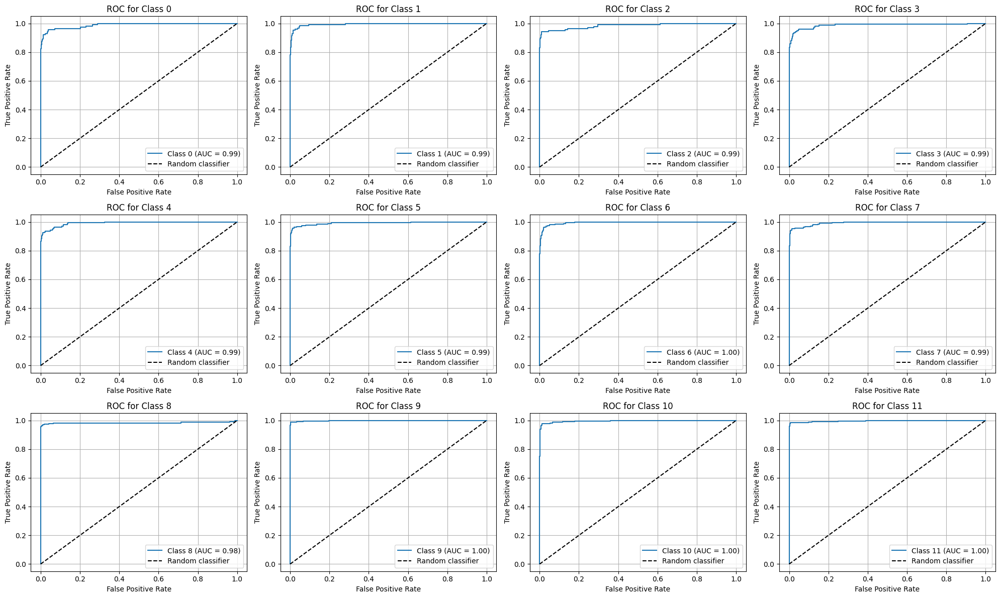

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
    ax.plot([0, 1], [0, 1], "k--", label="Random classifier")
    ax.set_title(f"ROC for Class {i}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right")
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

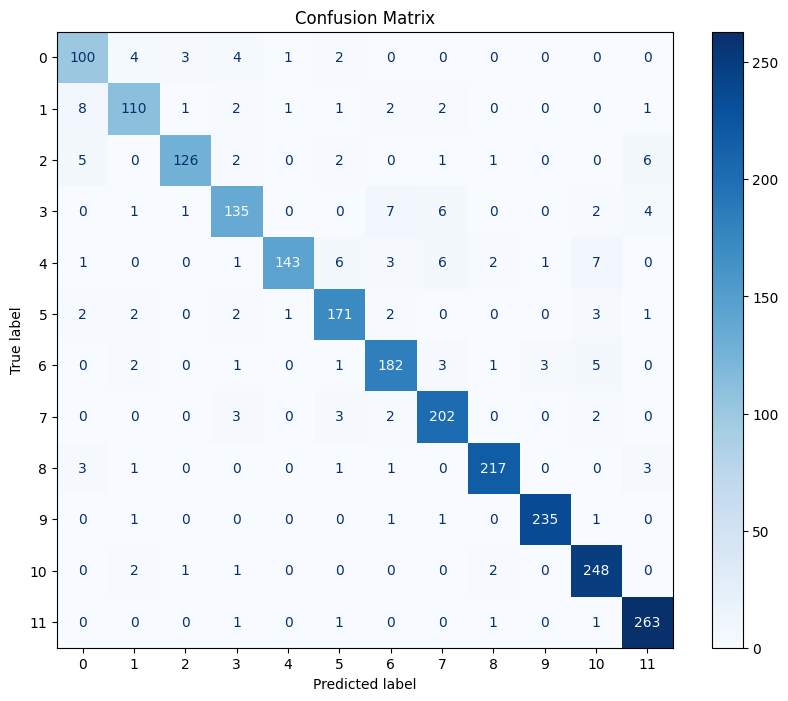

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap="Blues", colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.930597992143169


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.84      0.88      0.86       114
           1       0.89      0.86      0.88       128
           2       0.95      0.88      0.92       143
           3       0.89      0.87      0.88       156
           4       0.98      0.84      0.91       170
           5       0.91      0.93      0.92       184
           6       0.91      0.92      0.91       198
           7       0.91      0.95      0.93       212
           8       0.97      0.96      0.96       226
           9       0.98      0.98      0.98       239
          10       0.92      0.98      0.95       254
          11       0.95      0.99      0.97       267

    accuracy                           0.93      2291
   macro avg       0.93      0.92      0.92      2291
weighted avg       0.93      0.93      0.93      2291



## Model dropout = 0.3

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation="relu"),
    MaxPool2D((2, 2)),
    Dropout(0.3),
    Conv2D(64, (3, 3), activation="relu"),
    MaxPool2D((2, 2)),
    Dropout(0.3),
    Flatten(),
    Dense(128, activation="relu"),
    Dropout(0.3),
    Dense(num_classes, activation="softmax"),
])

In [ ]:
model.compile(
    optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"]
)

In [ ]:
model.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_6 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_13 (Dense)                     │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,908,940 (91.21 MB)

 Trainable params: 23,908,940 (91.21 MB)

 Non-trainable params: 0 (0.00 B)

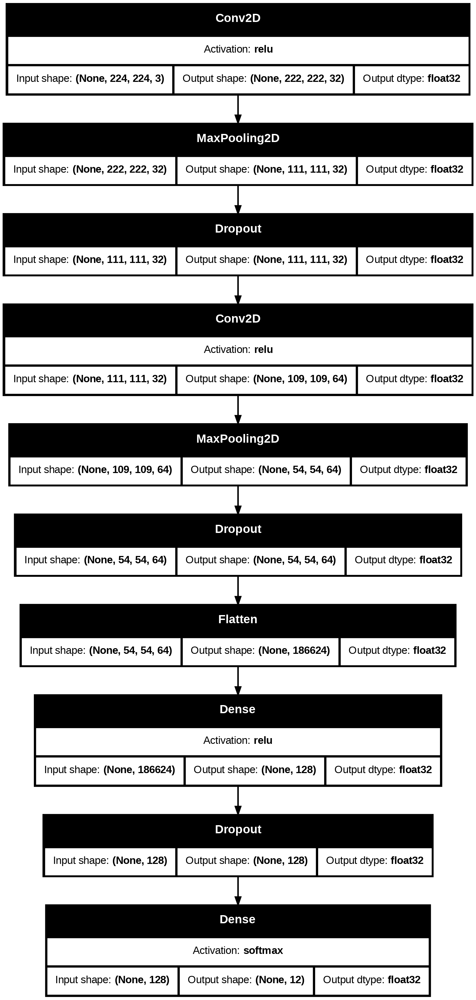

In [ ]:
try:
    plot_model(
        model,
        "model1_dropout_03.png",
        show_dtype=True,
        show_shapes=True,
        show_layer_activations=True,
    )
    display(Image("model1_dropout_03.png"))
except Exception as e:
    print(f"Error occurred: {e}")

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - accuracy: 0.1247 - loss: 3.1733 - val_accuracy: 0.3418 - val_loss: 2.0927
Epoch 2/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.3120 - loss: 1.9839 - val_accuracy: 0.6102 - val_loss: 1.4025
Epoch 3/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.5130 - loss: 1.3836 - val_accuracy: 0.7630 - val_loss: 0.9123
Epoch 4/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.6461 - loss: 0.9770 - val_accuracy: 0.8416 - val_loss: 0.6463
Epoch 5/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.7189 - loss: 0.7511 - val_accuracy: 0.8677 - val_loss: 0.5228
Epoch 6/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.7774 - loss: 0.6213 - val_accuracy: 0.8922 - val_loss: 0.4391
Epoch 7/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.7958 - loss: 0.5487 - val_accuracy: 0.9118 - val_loss: 0.3732
Epoch 8/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.8246 - loss: 0.4739 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f"model1_dropout_03 - loss: {loss}, accuracy: {acc}")

model1_dropout_03 - loss: 0.3599916994571686, accuracy: 0.9253600835800171


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data["loss"]

[2.5051584243774414,
 1.861572027206421,
 1.298964500427246,
 0.9389939308166504,
 0.7480824589729309,
 0.6192651391029358,
 0.5383927226066589,
 0.47661447525024414,
 0.4489867687225342,
 0.4142233729362488,
 0.3770713210105896,
 0.4249187111854553,
 0.33770591020584106,
 0.3254778981208801,
 0.31221306324005127,
 0.2935420274734497,
 0.2952522039413452,
 0.2705466151237488,
 0.27603548765182495,
 0.2484171837568283,
 0.25171488523483276,
 0.23282931745052338]

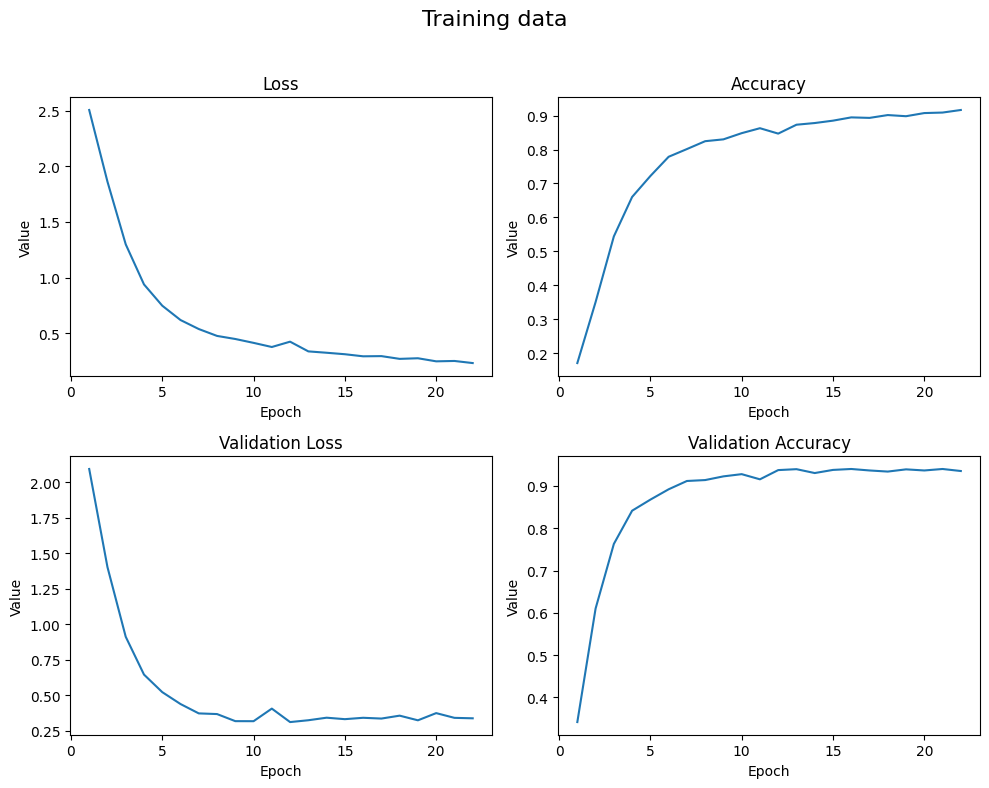

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

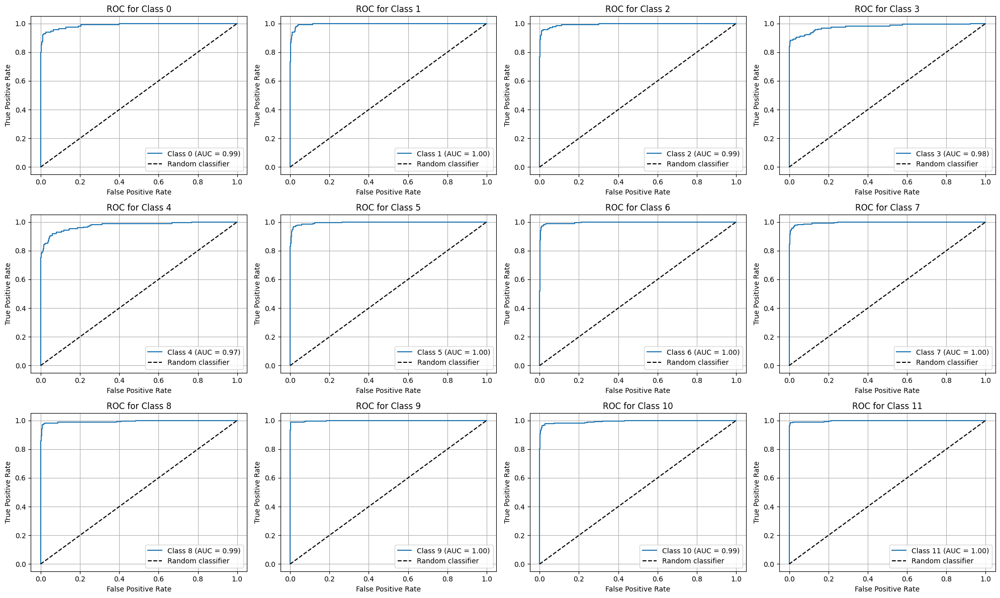

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
    ax.plot([0, 1], [0, 1], "k--", label="Random classifier")
    ax.set_title(f"ROC for Class {i}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right")
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

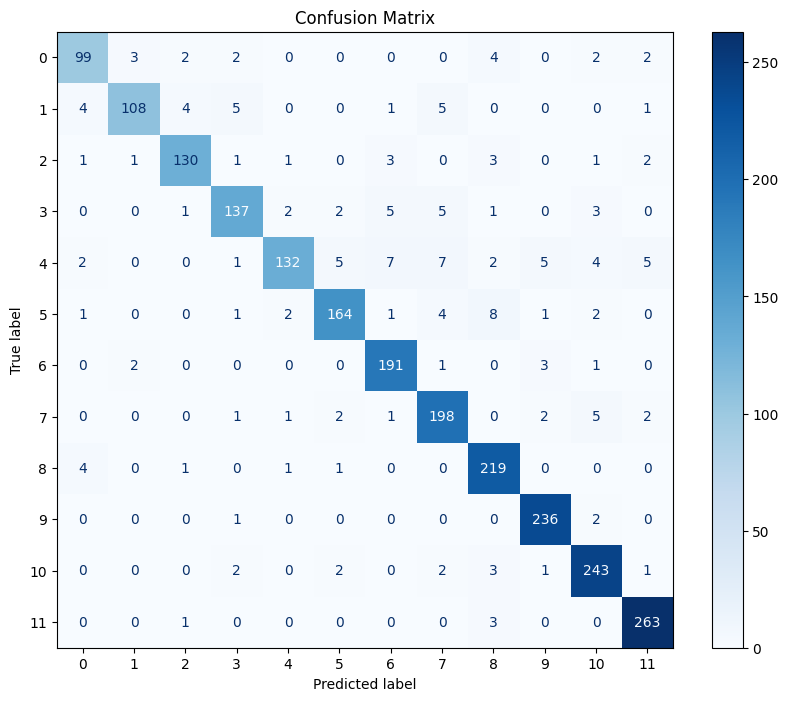

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap="Blues", colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.9253601047577477


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.89      0.87      0.88       114
           1       0.95      0.84      0.89       128
           2       0.94      0.91      0.92       143
           3       0.91      0.88      0.89       156
           4       0.95      0.78      0.85       170
           5       0.93      0.89      0.91       184
           6       0.91      0.96      0.94       198
           7       0.89      0.93      0.91       212
           8       0.90      0.97      0.93       226
           9       0.95      0.99      0.97       239
          10       0.92      0.96      0.94       254
          11       0.95      0.99      0.97       267

    accuracy                           0.93      2291
   macro avg       0.92      0.91      0.92      2291
weighted avg       0.93      0.93      0.92      2291



## Model dropout = 0.4

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation="relu"),
    MaxPool2D((2, 2)),
    Dropout(0.4),
    Conv2D(64, (3, 3), activation="relu"),
    MaxPool2D((2, 2)),
    Dropout(0.4),
    Flatten(),
    Dense(128, activation="relu"),
    Dropout(0.4),
    Dense(num_classes, activation="softmax"),
])

In [ ]:
model.compile(
    optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"]
)

In [ ]:
model.summary()

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_14 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_14 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_15 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_15 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_7 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_14 (Dense)                     │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_15 (Dense)                     │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,908,940 (91.21 MB)

 Trainable params: 23,908,940 (91.21 MB)

 Non-trainable params: 0 (0.00 B)

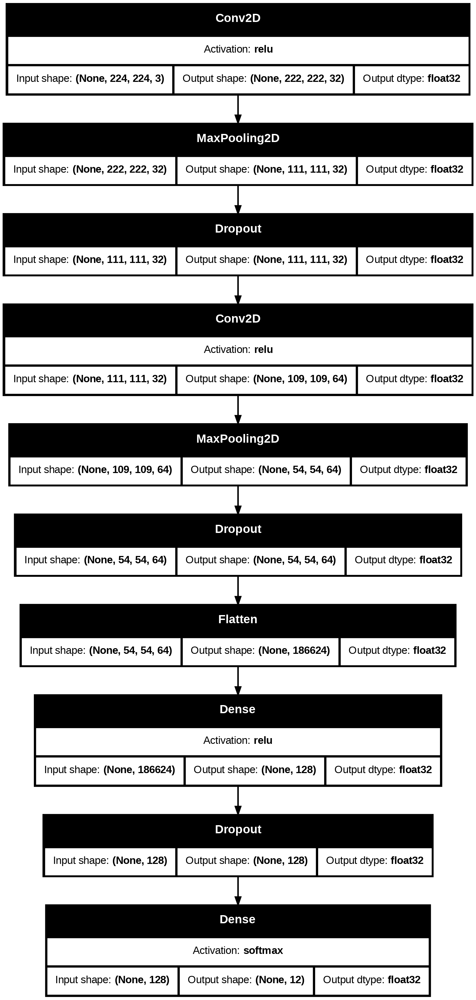

In [ ]:
try:
    plot_model(
        model,
        "model1_dropout_04.png",
        show_dtype=True,
        show_shapes=True,
        show_layer_activations=True,
    )
    display(Image("model1_dropout_04.png"))
except Exception as e:
    print(f"Error occurred: {e}")

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - accuracy: 0.1181 - loss: 3.7148 - val_accuracy: 0.2017 - val_loss: 2.3732
Epoch 2/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.2128 - loss: 2.2742 - val_accuracy: 0.3937 - val_loss: 1.9081
Epoch 3/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.3263 - loss: 1.9349 - val_accuracy: 0.5522 - val_loss: 1.5384
Epoch 4/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.4271 - loss: 1.5799 - val_accuracy: 0.6739 - val_loss: 1.1620
Epoch 5/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.5141 - loss: 1.3407 - val_accuracy: 0.7691 - val_loss: 0.8429
Epoch 6/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.5835 - loss: 1.1001 - val_accuracy: 0.8084 - val_loss: 0.7499
Epoch 7/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.6236 - loss: 0.9988 - val_accuracy: 0.8197 - val_loss: 0.7077
Epoch 8/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.6504 - loss: 0.9218 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f"model1_dropout_04 - loss: {loss}, accuracy: {acc}")

model1_dropout_04 - loss: 0.3925606608390808, accuracy: 0.9240506291389465


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data["loss"]

[2.7043073177337646,
 2.209303140640259,
 1.859115719795227,
 1.5194416046142578,
 1.293798804283142,
 1.1005362272262573,
 0.9941903352737427,
 0.9188525080680847,
 0.8377959728240967,
 0.8103364706039429,
 0.7644816040992737,
 0.7327424883842468,
 0.6804413199424744,
 0.675488293170929,
 0.6548265218734741,
 0.637184202671051,
 0.6125514507293701,
 0.6048851013183594,
 0.5914678573608398,
 0.6636664271354675,
 0.5616365075111389,
 0.5483407378196716,
 0.5274927616119385,
 0.5293538570404053,
 0.5087664723396301,
 0.5109068155288696,
 0.4944896399974823,
 0.50206059217453,
 0.48297008872032166,
 0.47201287746429443,
 0.4641231894493103,
 0.45433562994003296,
 0.4424820840358734,
 0.451039582490921,
 0.4375159442424774]

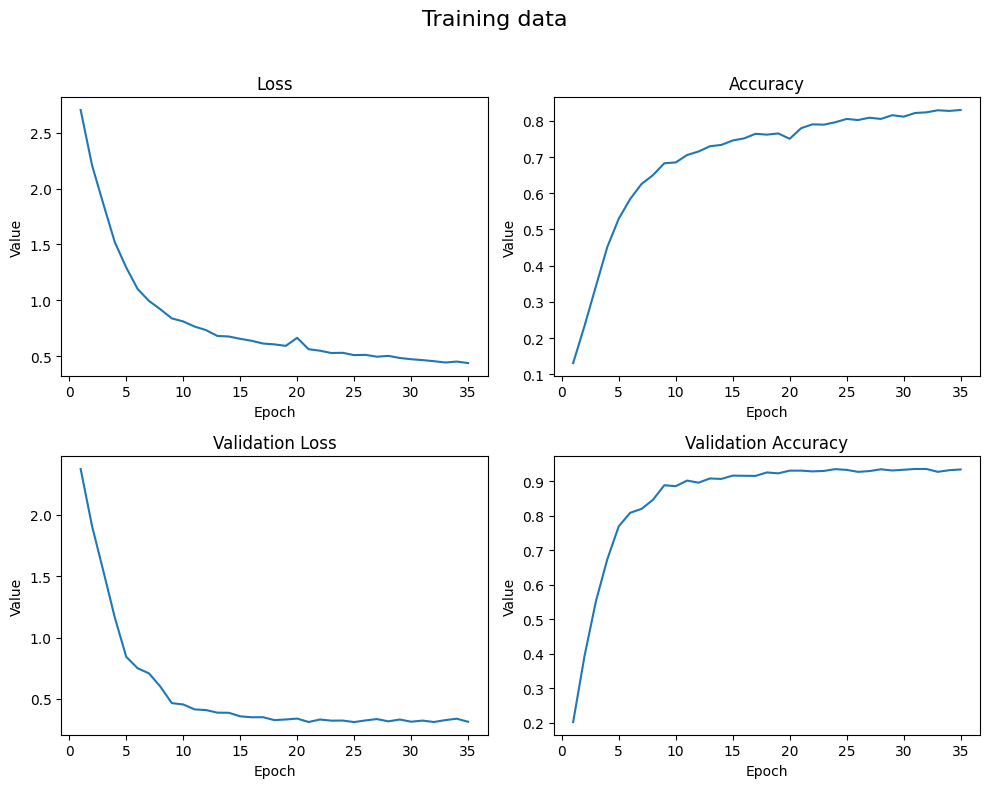

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

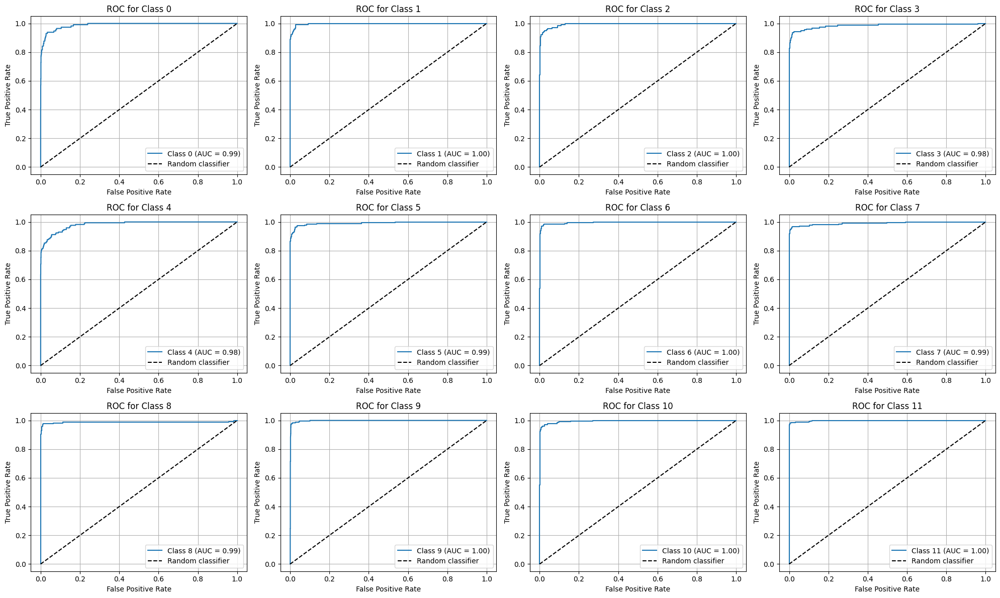

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
    ax.plot([0, 1], [0, 1], "k--", label="Random classifier")
    ax.set_title(f"ROC for Class {i}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right")
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

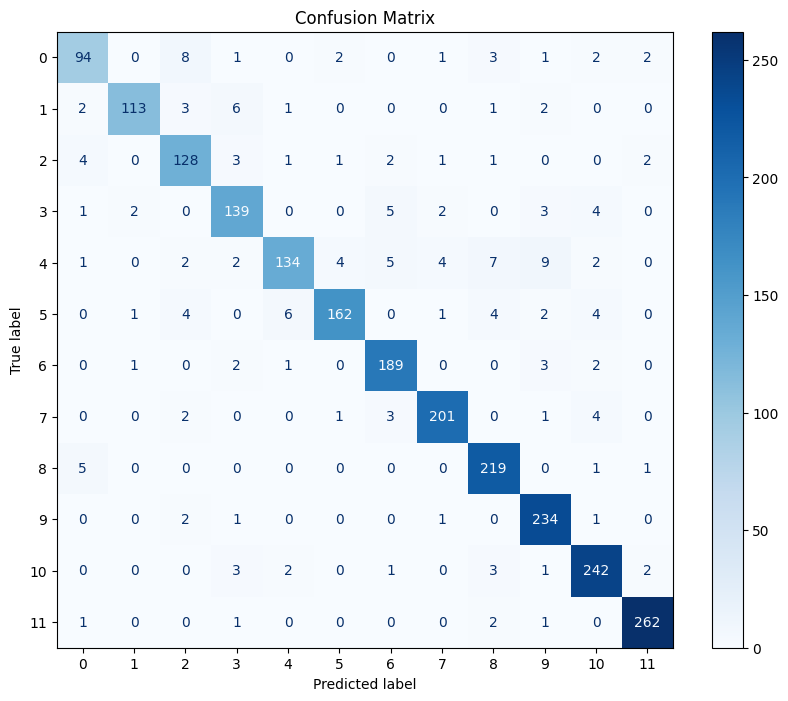

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap="Blues", colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.9240506329113924


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.82      0.85       114
           1       0.97      0.88      0.92       128
           2       0.86      0.90      0.88       143
           3       0.88      0.89      0.89       156
           4       0.92      0.79      0.85       170
           5       0.95      0.88      0.92       184
           6       0.92      0.95      0.94       198
           7       0.95      0.95      0.95       212
           8       0.91      0.97      0.94       226
           9       0.91      0.98      0.94       239
          10       0.92      0.95      0.94       254
          11       0.97      0.98      0.98       267

    accuracy                           0.92      2291
   macro avg       0.92      0.91      0.92      2291
weighted avg       0.92      0.92      0.92      2291



## Model batch normalization

In [29]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation="relu"),
    BatchNormalization(),
    MaxPool2D((2, 2)),
    Conv2D(64, (3, 3), activation="relu"),
    BatchNormalization(),
    MaxPool2D((2, 2)),
    Flatten(),
    Dense(128, activation="relu"),
    BatchNormalization(),
    Dense(num_classes, activation="softmax"),
])

In [30]:
model.compile(
    optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"]
)

In [31]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 222, 222, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 109, 109, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,909,836 (91.21 MB)

 Trainable params: 23,909,388 (91.21 MB)

 Non-trainable params: 448 (1.75 KB)

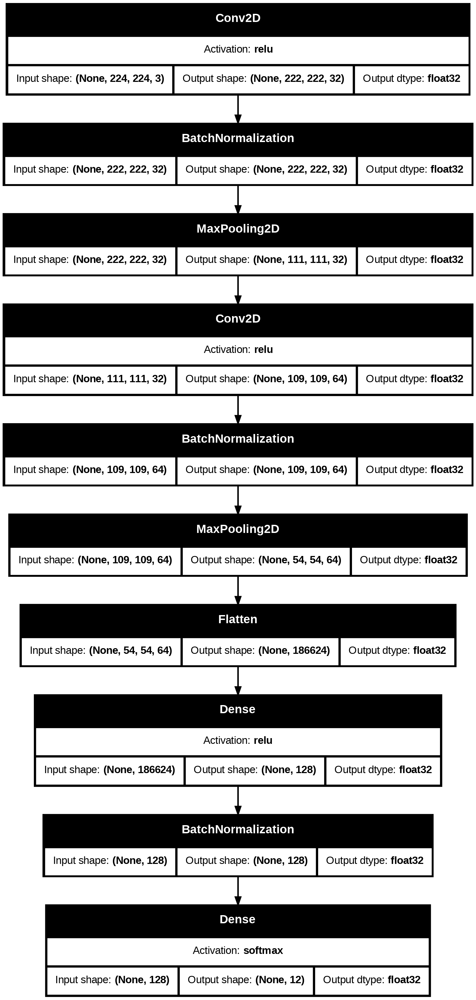

In [ ]:
try:
    plot_model(
        model,
        "model1_batchnorm.png",
        show_dtype=True,
        show_shapes=True,
        show_layer_activations=True,
    )
    display(Image("model1_batchnorm.png"))
except Exception as e:
    print(f"Error occurred: {e}")

In [34]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - accuracy: 0.3611 - loss: 2.1025 - val_accuracy: 0.1131 - val_loss: 3.4671
Epoch 2/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.9175 - loss: 0.3401 - val_accuracy: 0.9053 - val_loss: 0.3598
Epoch 3/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - accuracy: 0.9962 - loss: 0.0420 - val_accuracy: 0.9350 - val_loss: 0.2427
Epoch 4/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - accuracy: 0.9996 - loss: 0.0090 - val_accuracy: 0.9406 - val_loss: 0.2298
Epoch 5/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 1.0000 - loss: 0.0033 - val_accuracy: 0.9406 - val_loss: 0.2177
Epoch 6/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 1.0000 - loss: 0.0016 - val_accuracy: 0.9433 - val_loss: 0.2227
Epoch 7/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - accuracy: 1.0000 - loss: 0.0012 - val_accuracy: 0.9415 - val_loss: 0.2243
Epoch 8/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 1.0000 - loss: 8.3129e-

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f"model1_batchnorm - loss: {loss}, accuracy: {acc}")

model_dropout - loss: 0.18065857887268066, accuracy: 0.9450021982192993


In [36]:
training_data = history.history

In [37]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [38]:
training_data["loss"]

[1.525972843170166,
 0.2822200357913971,
 0.03241986036300659,
 0.008305304683744907,
 0.003107371274381876,
 0.0017659974982962012,
 0.0013703327858820558,
 0.000985205639153719,
 0.0008534311782568693,
 0.0007027274114079773,
 0.0005748973926529288,
 0.0005839228397235274,
 0.00044108834117650986,
 0.0004858371103182435,
 0.0004157421353738755]

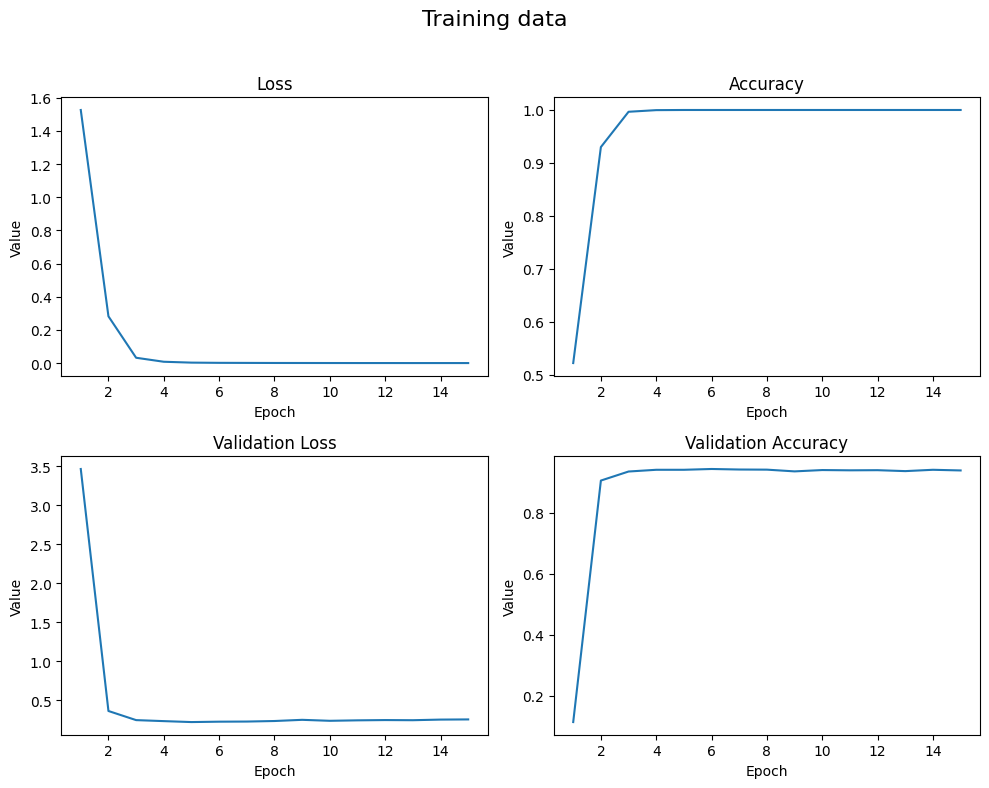

In [39]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [40]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

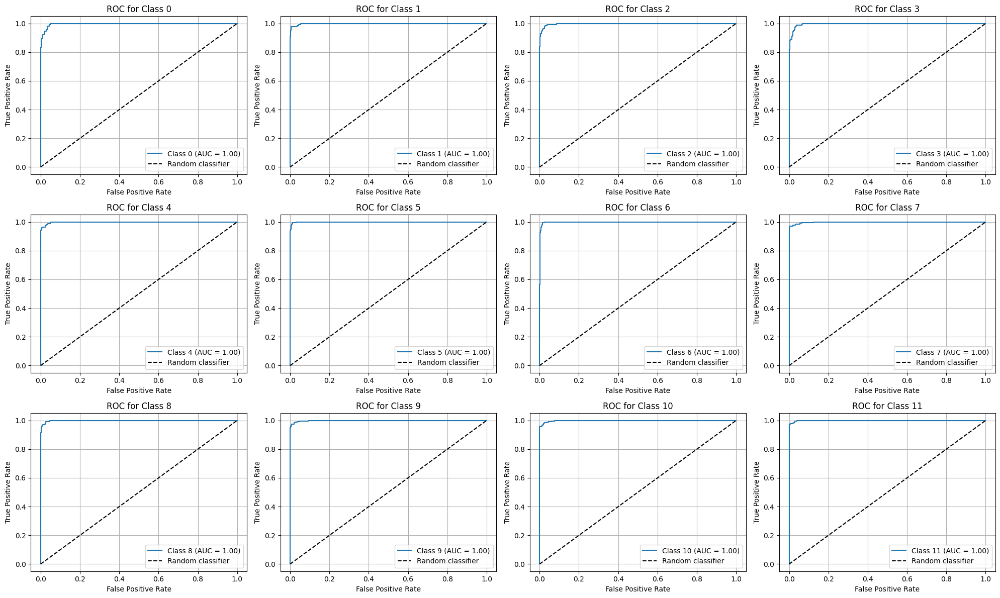

In [41]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
    ax.plot([0, 1], [0, 1], "k--", label="Random classifier")
    ax.set_title(f"ROC for Class {i}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right")
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

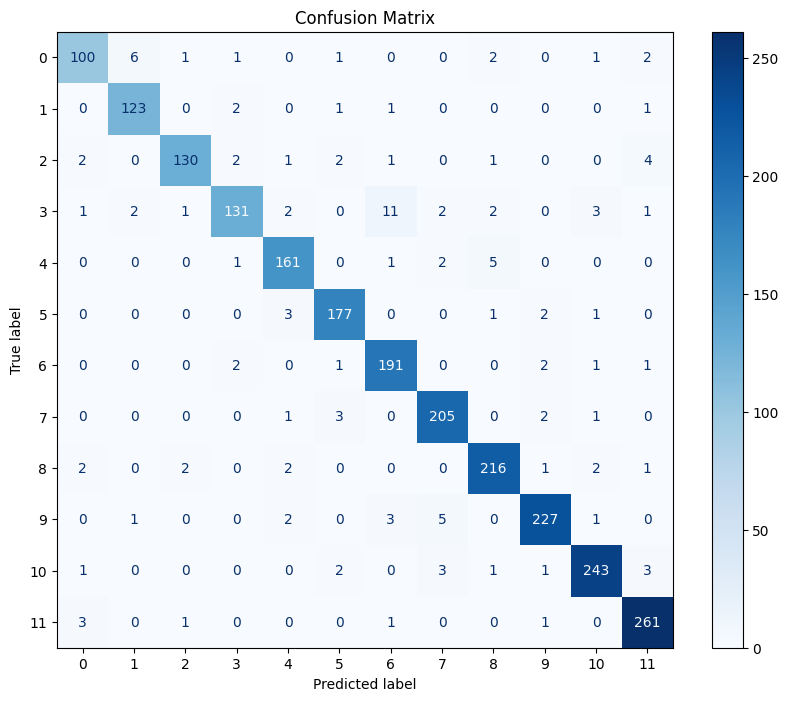

In [42]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [43]:
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.9450021824530772


In [44]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.92      0.88      0.90       114
           1       0.93      0.96      0.95       128
           2       0.96      0.91      0.94       143
           3       0.94      0.84      0.89       156
           4       0.94      0.95      0.94       170
           5       0.95      0.96      0.95       184
           6       0.91      0.96      0.94       198
           7       0.94      0.97      0.96       212
           8       0.95      0.96      0.95       226
           9       0.96      0.95      0.96       239
          10       0.96      0.96      0.96       254
          11       0.95      0.98      0.96       267

    accuracy                           0.95      2291
   macro avg       0.94      0.94      0.94      2291
weighted avg       0.95      0.95      0.94      2291



## Model elasticnet (l1 = 0.01; l2 = 0.01)

In [ ]:
input_shape = X_train.shape[1:]
num_classes = len(np.unique(y_train))

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l1_l2(l1=0.01, l2=0.01)),
    MaxPool2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l1_l2(l1=0.01, l2=0.01)),
    MaxPool2D((2, 2)),

    Flatten(),
    Dense(128, activation='relu', kernel_regularizer=l1_l2(l1=0.01, l2=0.01)),
    Dense(num_classes, activation='softmax'),
])

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_18 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_18 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_19 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_19 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_9 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_18 (Dense)                     │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_19 (Dense)                     │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,908,940 (91.21 MB)

 Trainable params: 23,908,940 (91.21 MB)

 Non-trainable params: 0 (0.00 B)

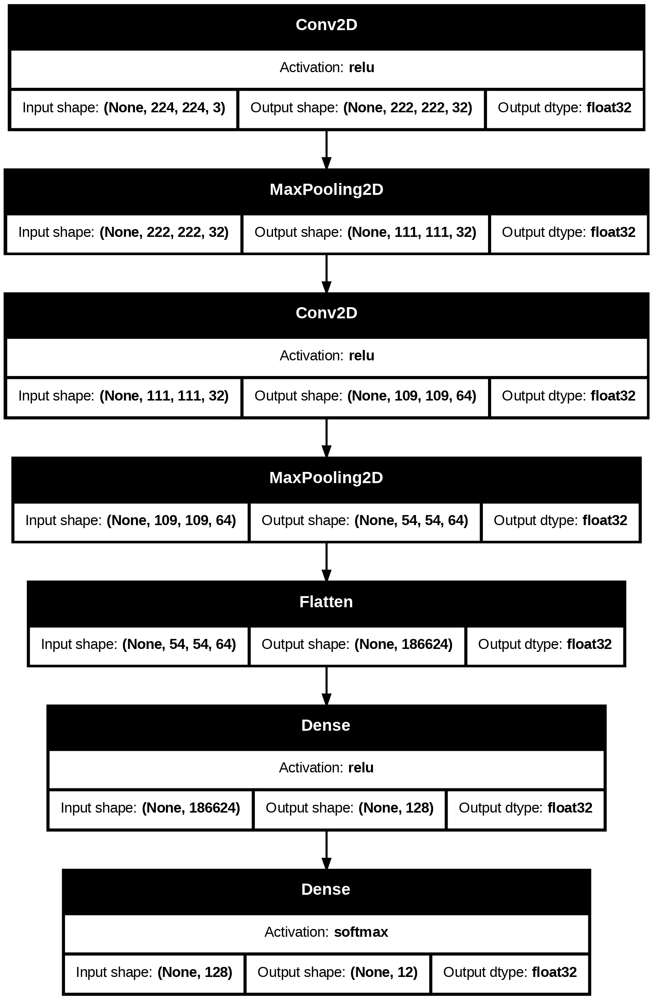

In [ ]:
try:
    plot_model(model, 'model1_l1_l2.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model1_l1_l2.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10,
                                                  restore_best_weights=True, verbose=1)

epochs = 100
batch_size = 32

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - accuracy: 0.1121 - loss: 81.0517 - val_accuracy: 0.1170 - val_loss: 31.7986
Epoch 2/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1113 - loss: 30.5964 - val_accuracy: 0.1170 - val_loss: 31.0453
Epoch 3/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1186 - loss: 29.9659 - val_accuracy: 0.1170 - val_loss: 29.7389
Epoch 4/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1167 - loss: 29.9229 - val_accuracy: 0.1170 - val_loss: 29.9021
Epoch 5/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1100 - loss: 30.0454 - val_accuracy: 0.1170 - val_loss: 30.4708
Epoch 6/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1156 - loss: 30.0734 - val_accuracy: 0.1170 - val_loss: 30.7681
Epoch 7/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1161 - loss: 30.4778 - val_accuracy: 0.1170 - val_loss: 31.2003
Epoch 8/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1166 - 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model1_l1_l2 - loss: {loss}, accuracy: {acc}')

model1_l1_l2 - loss: 29.738637924194336, accuracy: 0.1165429949760437


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[43.338314056396484,
 30.37850570678711,
 29.85584831237793,
 29.972408294677734,
 30.030202865600586,
 30.12964630126953,
 30.61928939819336,
 30.937114715576172,
 30.99220848083496,
 31.01494789123535,
 31.0397891998291,
 31.054208755493164,
 31.057315826416016]

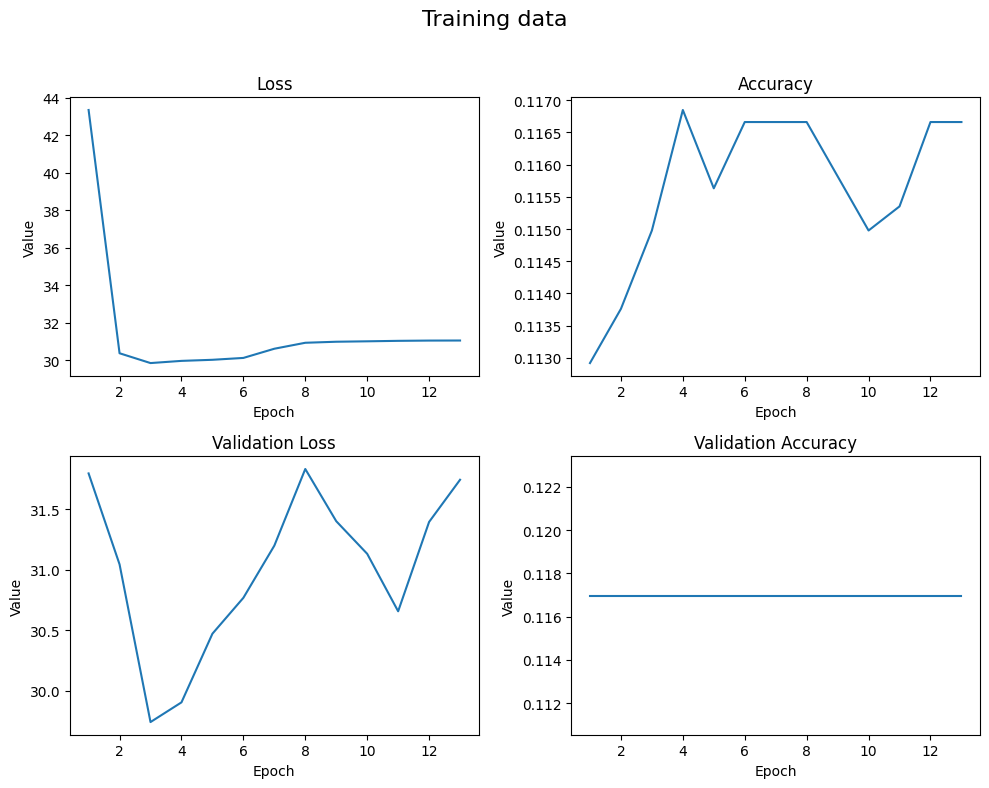

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

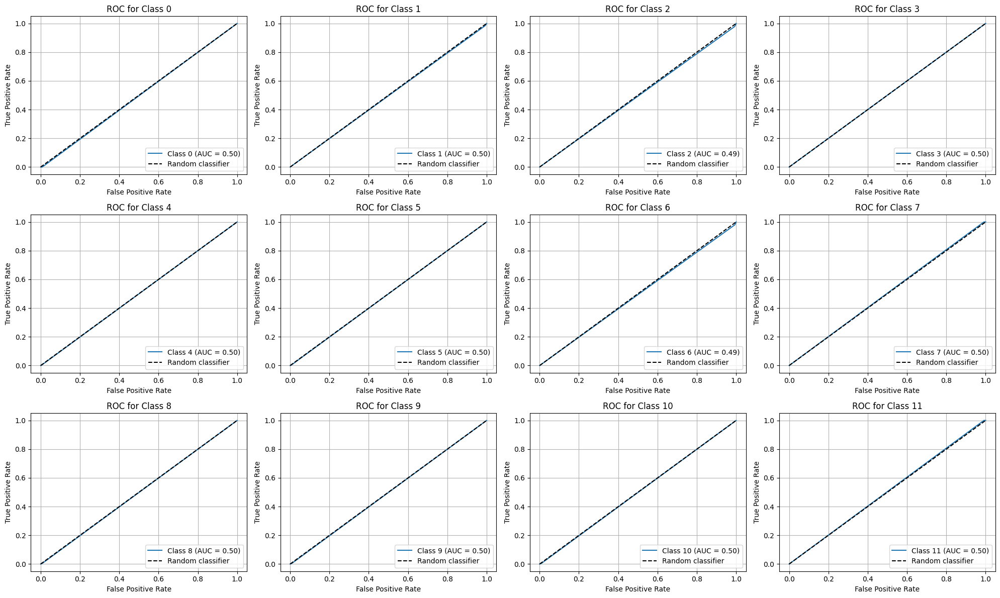

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

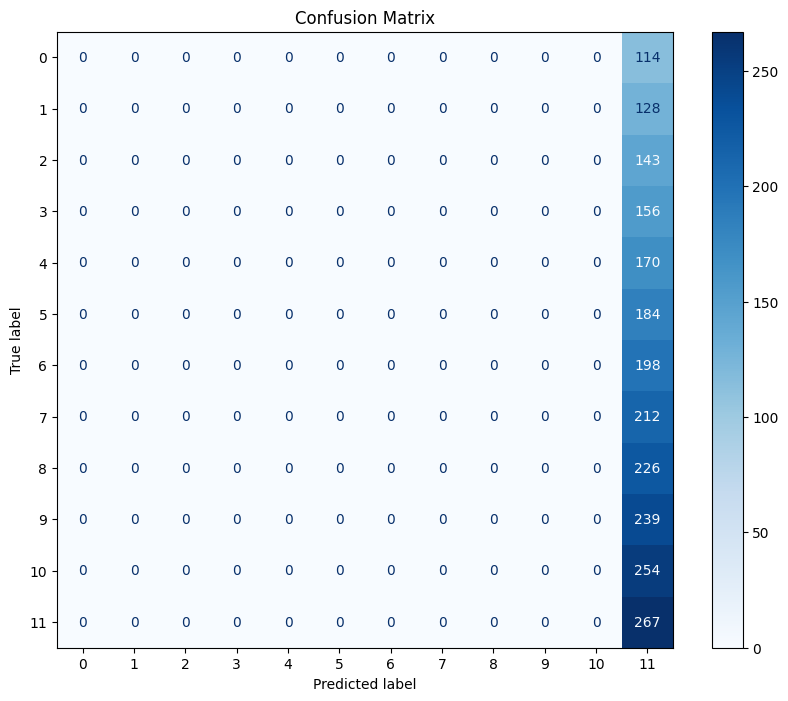

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.116542994325622


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       114
           1       0.00      0.00      0.00       128
           2       0.00      0.00      0.00       143
           3       0.00      0.00      0.00       156
           4       0.00      0.00      0.00       170
           5       0.00      0.00      0.00       184
           6       0.00      0.00      0.00       198
           7       0.00      0.00      0.00       212
           8       0.00      0.00      0.00       226
           9       0.00      0.00      0.00       239
          10       0.00      0.00      0.00       254
          11       0.12      1.00      0.21       267

    accuracy                           0.12      2291
   macro avg       0.01      0.08      0.02      2291
weighted avg       0.01      0.12      0.02      2291



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Model batchnormalization; dropout = 0.03;

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPool2D((2, 2)),
    Dropout(0.3),
    Conv2D(64, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPool2D((2, 2)),
    Dropout(0.3),

    Flatten(),
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(len(np.unique(y_train)), activation='softmax'),
])

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_20 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 222, 222, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_20 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_21 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 109, 109, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_21 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_10 (Dropout)                 │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_10 (Flatten)                 │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_20 (Dense)                     │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_21 (Dense)                     │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,909,836 (91.21 MB)

 Trainable params: 23,909,388 (91.21 MB)

 Non-trainable params: 448 (1.75 KB)

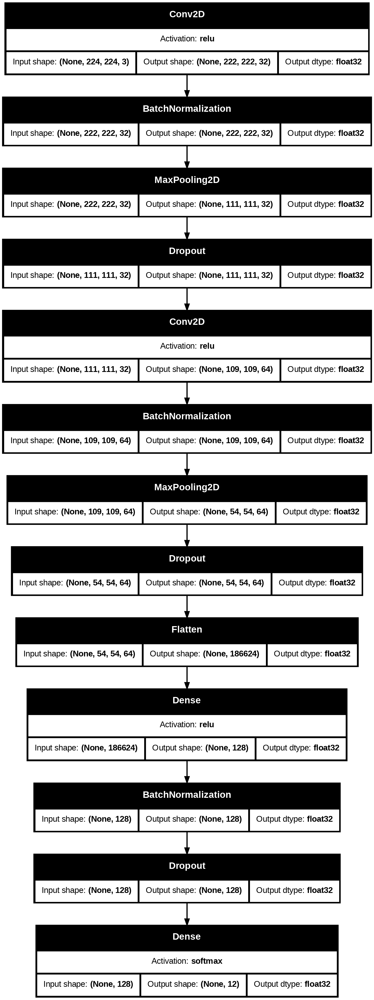

In [ ]:
try:
    plot_model(model, 'model1_dropout_batchnorm.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model1_dropout_batchnorm.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - accuracy: 0.2359 - loss: 2.5536 - val_accuracy: 0.1357 - val_loss: 5.6757
Epoch 2/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - accuracy: 0.5977 - loss: 1.2601 - val_accuracy: 0.3955 - val_loss: 2.0875
Epoch 3/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - accuracy: 0.8517 - loss: 0.5334 - val_accuracy: 0.8813 - val_loss: 0.5284
Epoch 4/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - accuracy: 0.9676 - loss: 0.1531 - val_accuracy: 0.8538 - val_loss: 1.6729
Epoch 5/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.9904 - loss: 0.0631 - val_accuracy: 0.9249 - val_loss: 0.5465
Epoch 6/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.9937 - loss: 0.0368 - val_accuracy: 0.8743 - val_loss: 1.1940
Epoch 7/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.9894 - loss: 0.0444 - val_accuracy: 0.8983 - val_loss: 1.5842
Epoch 8/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.9970 - loss: 0.0232 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model1_dropout_batchnorm - loss: {loss}, accuracy: {acc}')

model1_dropout_batchnorm - loss: 0.34071728587150574, accuracy: 0.9375818371772766


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[2.1618235111236572,
 1.10405695438385,
 0.43433240056037903,
 0.14085744321346283,
 0.05757210776209831,
 0.03596663102507591,
 0.040480662137269974,
 0.024461224675178528,
 0.027527151629328728,
 0.029227860271930695,
 0.04720521345734596,
 0.07291880995035172,
 0.04415116086602211,
 0.02483583800494671,
 0.020648716017603874,
 0.020322686061263084,
 0.012768616899847984,
 0.028005125001072884,
 0.032385025173425674,
 0.043910834938287735,
 0.023134004324674606,
 0.017299773171544075,
 0.01431508269160986,
 0.01417910773307085,
 0.01624760963022709,
 0.012600242160260677,
 0.012720758095383644,
 0.010917589999735355,
 0.01420598104596138,
 0.011048396117985249,
 0.01623600162565708,
 0.015971537679433823,
 0.018202316015958786]

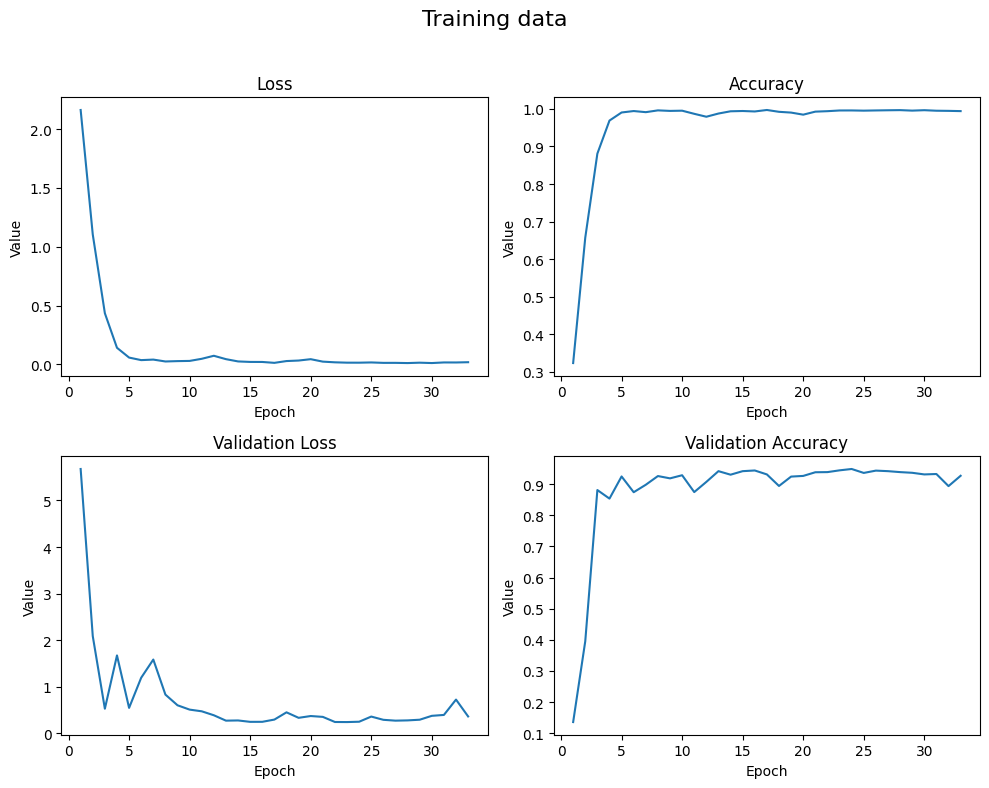

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

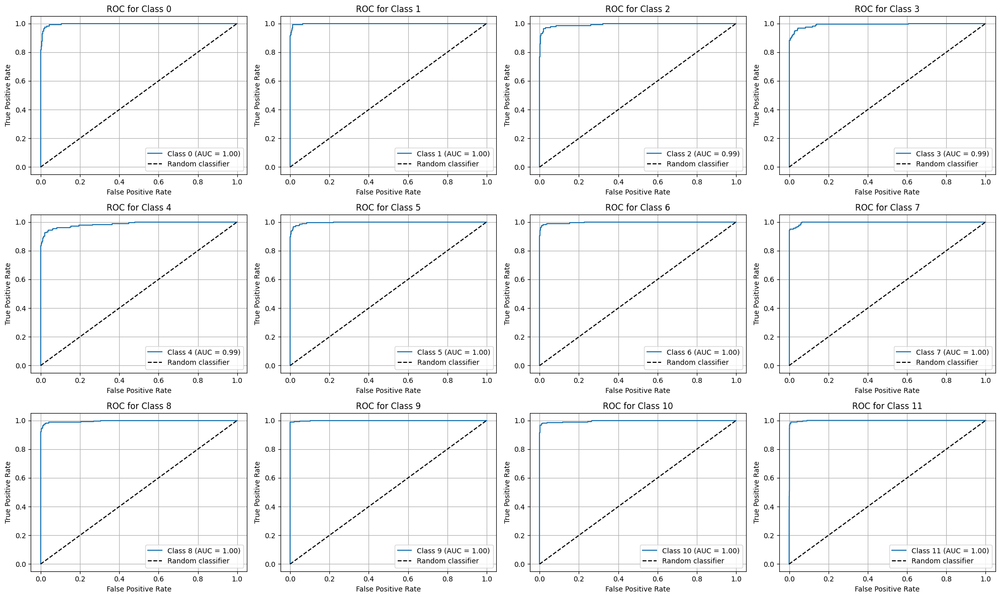

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

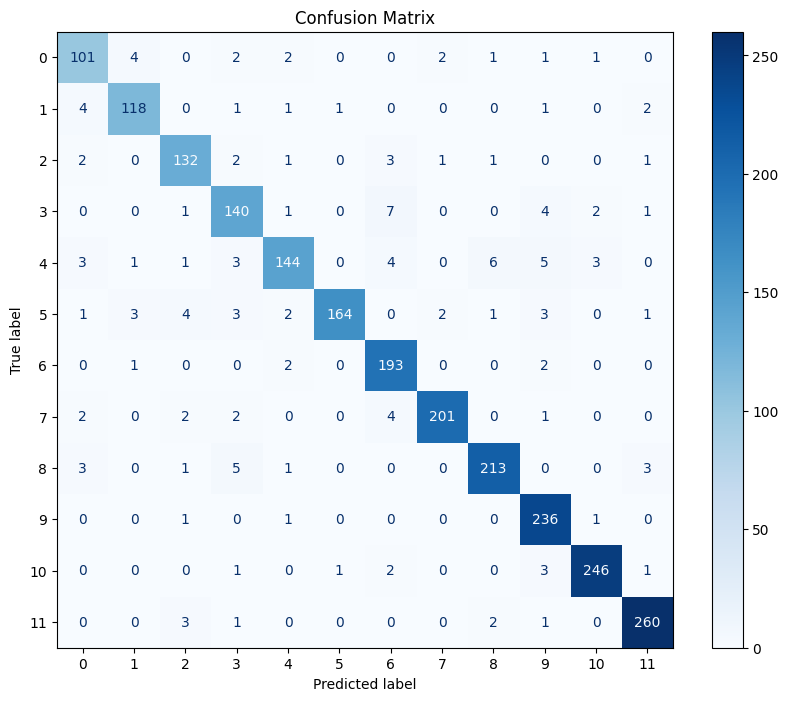

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.9375818419903972


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.89      0.88       114
           1       0.93      0.92      0.93       128
           2       0.91      0.92      0.92       143
           3       0.88      0.90      0.89       156
           4       0.93      0.85      0.89       170
           5       0.99      0.89      0.94       184
           6       0.91      0.97      0.94       198
           7       0.98      0.95      0.96       212
           8       0.95      0.94      0.95       226
           9       0.92      0.99      0.95       239
          10       0.97      0.97      0.97       254
          11       0.97      0.97      0.97       267

    accuracy                           0.94      2291
   macro avg       0.93      0.93      0.93      2291
weighted avg       0.94      0.94      0.94      2291



# Extended architecture

## Model base

In [ ]:
inputs = Input(shape=X_train.shape[1:])
x = Conv2D(32, (3, 3), activation='relu')(inputs)
x = MaxPool2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu')(x)
x = MaxPool2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu')(x)
x = MaxPool2D((2, 2))(x)

x = Flatten()(x)
x = Dense(128, activation='relu')(x)
outputs = Dense(len(np.unique(y_train)), activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_12 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_25 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_25 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_26 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_26 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_27 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_27 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_12 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_24 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_25 (Dense)                     │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,170,508 (42.61 MB)

 Trainable params: 11,170,508 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

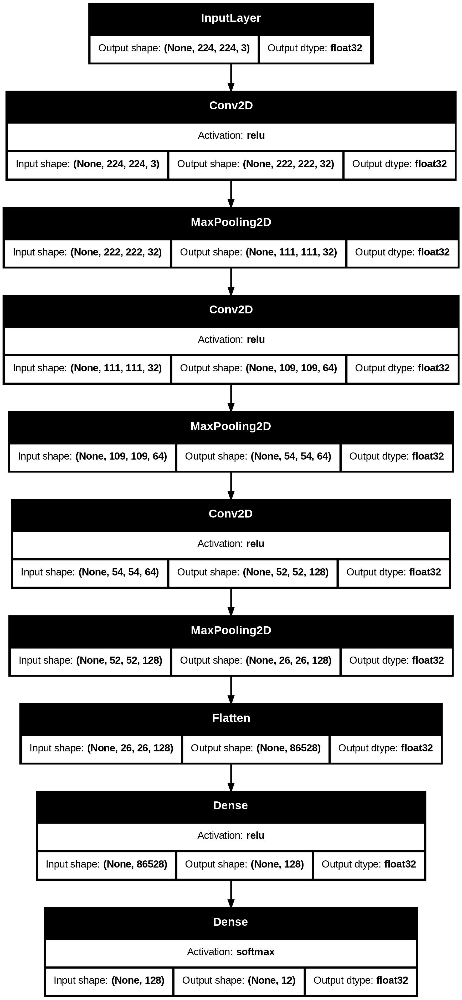

In [ ]:
try:
    plot_model(model, 'model2_base.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_base.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10,
                                                  restore_best_weights=True, verbose=1)

epochs = 100
batch_size = 32

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - accuracy: 0.2765 - loss: 2.1517 - val_accuracy: 0.7145 - val_loss: 0.9542
Epoch 2/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.8560 - loss: 0.5066 - val_accuracy: 0.8957 - val_loss: 0.3947
Epoch 3/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.9533 - loss: 0.1531 - val_accuracy: 0.9245 - val_loss: 0.3756
Epoch 4/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.9948 - loss: 0.0207 - val_accuracy: 0.9289 - val_loss: 0.3984
Epoch 5/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9958 - loss: 0.0212 - val_accuracy: 0.9354 - val_loss: 0.4076
Epoch 6/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.9973 - loss: 0.0111 - val_accuracy: 0.9101 - val_loss: 0.6200
Epoch 7/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.9466 - loss: 0.1978 - val_accuracy: 0.9241 - val_loss: 0.5031
Epoch 8/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9961 - loss: 0.0188 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0)
print(f'model2_base - loss: {loss}, accuracy: {acc}')

model2_base - loss: 0.35175827145576477, accuracy: 0.9271060824394226


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[1.7019562721252441,
 0.4219069182872772,
 0.10341019183397293,
 0.026751844212412834,
 0.0174995269626379,
 0.02015048637986183,
 0.11234800517559052,
 0.01442661602050066,
 0.006504186429083347,
 0.0031001262832432985,
 0.00017159081471618265,
 5.382231393014081e-05,
 3.241877493564971e-05]

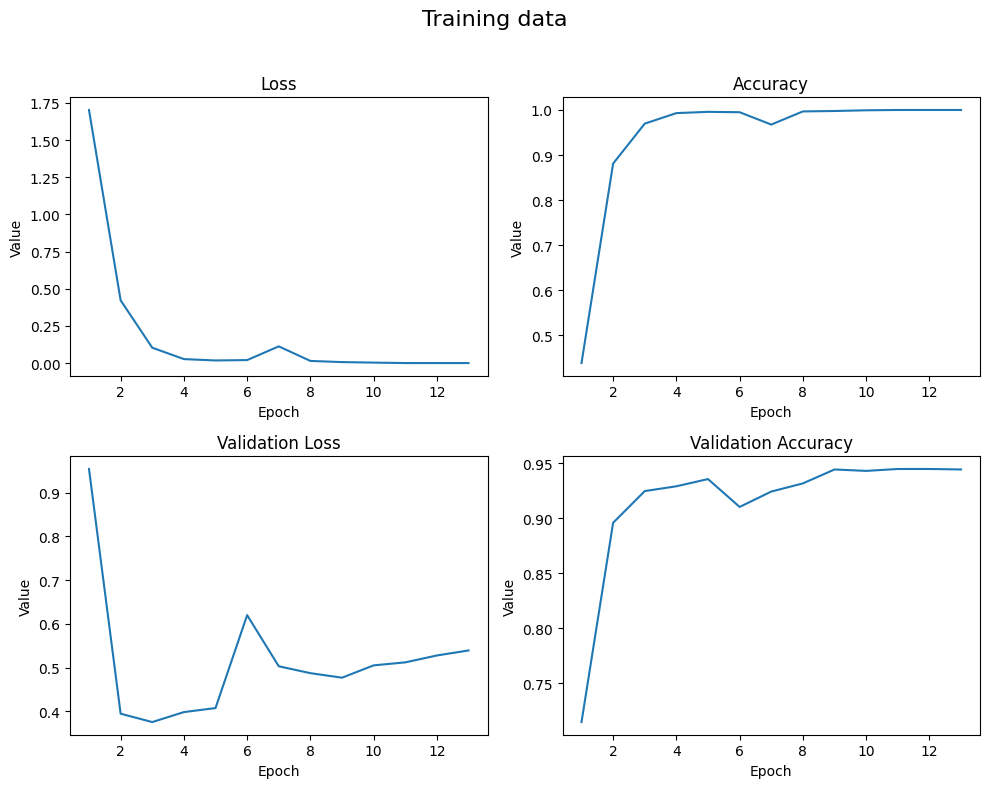

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0)
y_pred = np.argmax(y_pred_proba, axis=1)

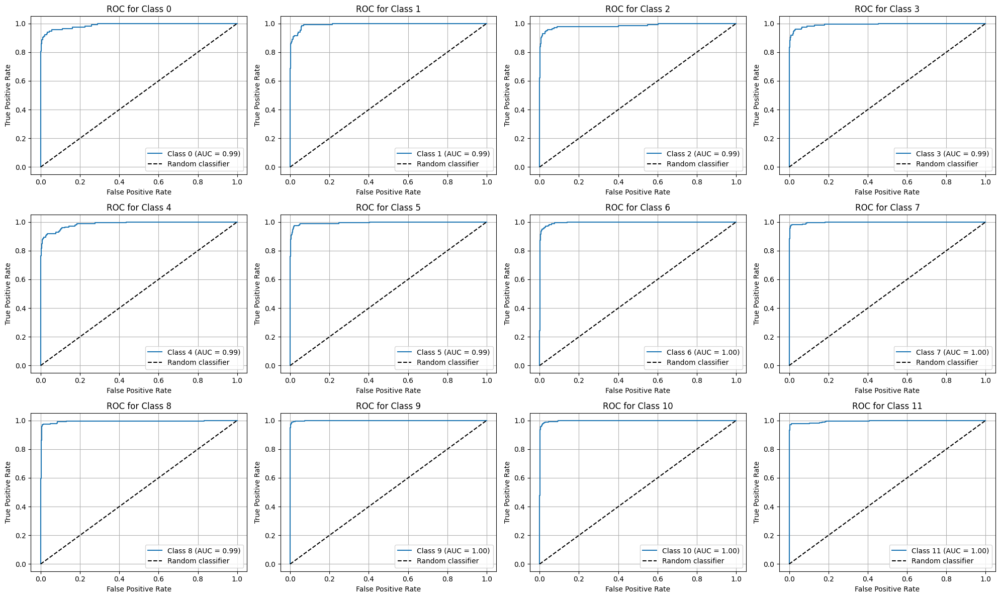

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

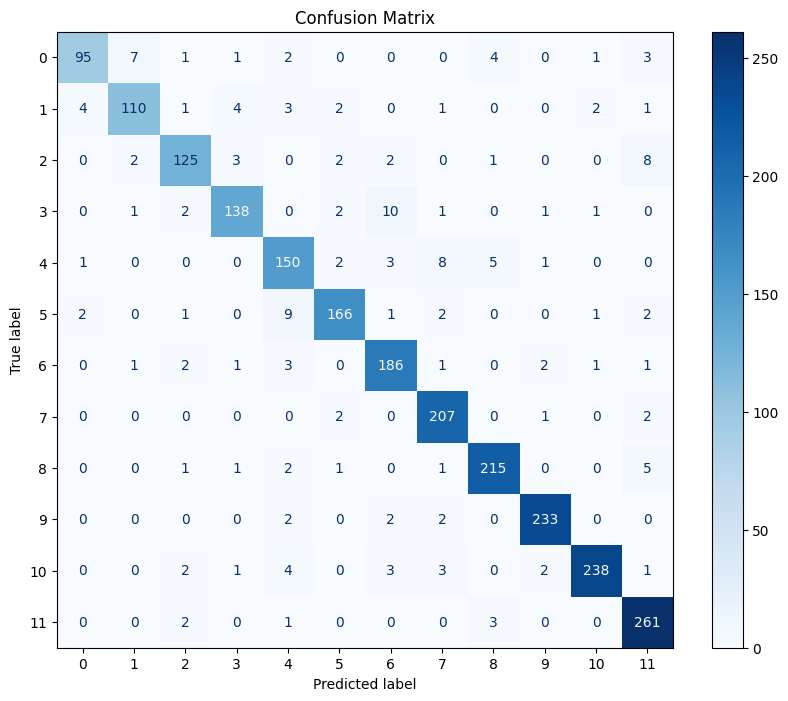

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.9271060672195548


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.93      0.83      0.88       114
           1       0.91      0.86      0.88       128
           2       0.91      0.87      0.89       143
           3       0.93      0.88      0.90       156
           4       0.85      0.88      0.87       170
           5       0.94      0.90      0.92       184
           6       0.90      0.94      0.92       198
           7       0.92      0.98      0.95       212
           8       0.94      0.95      0.95       226
           9       0.97      0.97      0.97       239
          10       0.98      0.94      0.96       254
          11       0.92      0.98      0.95       267

    accuracy                           0.93      2291
   macro avg       0.92      0.92      0.92      2291
weighted avg       0.93      0.93      0.93      2291



## Model l1 = 0.01

In [ ]:
input_shape = X_train.shape[1:]
num_classes = len(np.unique(y_train))

In [ ]:
inputs = Input(shape=input_shape)
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(inputs)
x = MaxPool2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = MaxPool2D((2, 2))(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l1(0.01))(x)
outputs = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_13 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_28 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_28 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_29 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_29 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_30 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_30 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_13 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_26 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_27 (Dense)                     │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,170,508 (42.61 MB)

 Trainable params: 11,170,508 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

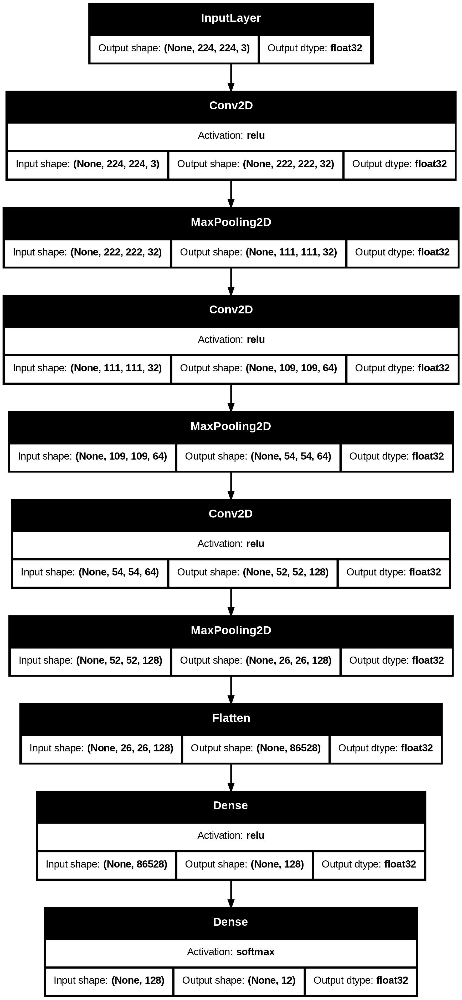

In [ ]:
try:
    plot_model(model, 'model2_l1_001.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_l1_001.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10,
                                                  restore_best_weights=True, verbose=1)

epochs = 100
batch_size = 32

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - accuracy: 0.1121 - loss: 58.7999 - val_accuracy: 0.1170 - val_loss: 16.5591
Epoch 2/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1177 - loss: 16.3776 - val_accuracy: 0.1170 - val_loss: 16.5242
Epoch 3/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1189 - loss: 16.3435 - val_accuracy: 0.1170 - val_loss: 15.9478
Epoch 4/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1156 - loss: 16.3028 - val_accuracy: 0.1170 - val_loss: 16.1854
Epoch 5/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1167 - loss: 16.3014 - val_accuracy: 0.1170 - val_loss: 16.5855
Epoch 6/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1206 - loss: 16.3162 - val_accuracy: 0.1170 - val_loss: 16.5372
Epoch 7/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1158 - loss: 16.3192 - val_accuracy: 0.1170 - val_loss: 16.2475
Epoch 8/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1116 - 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_l1_001 - loss: {loss}, accuracy: {acc}')

model2_l1_001 - loss: 15.947535514831543, accuracy: 0.1165429949760437


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[26.8503360748291,
 16.349891662597656,
 16.33197593688965,
 16.300613403320312,
 16.31239891052246,
 16.315357208251953,
 16.316570281982422,
 16.29458236694336,
 16.2893009185791,
 16.280797958374023,
 16.283580780029297,
 16.27227783203125,
 16.27576446533203]

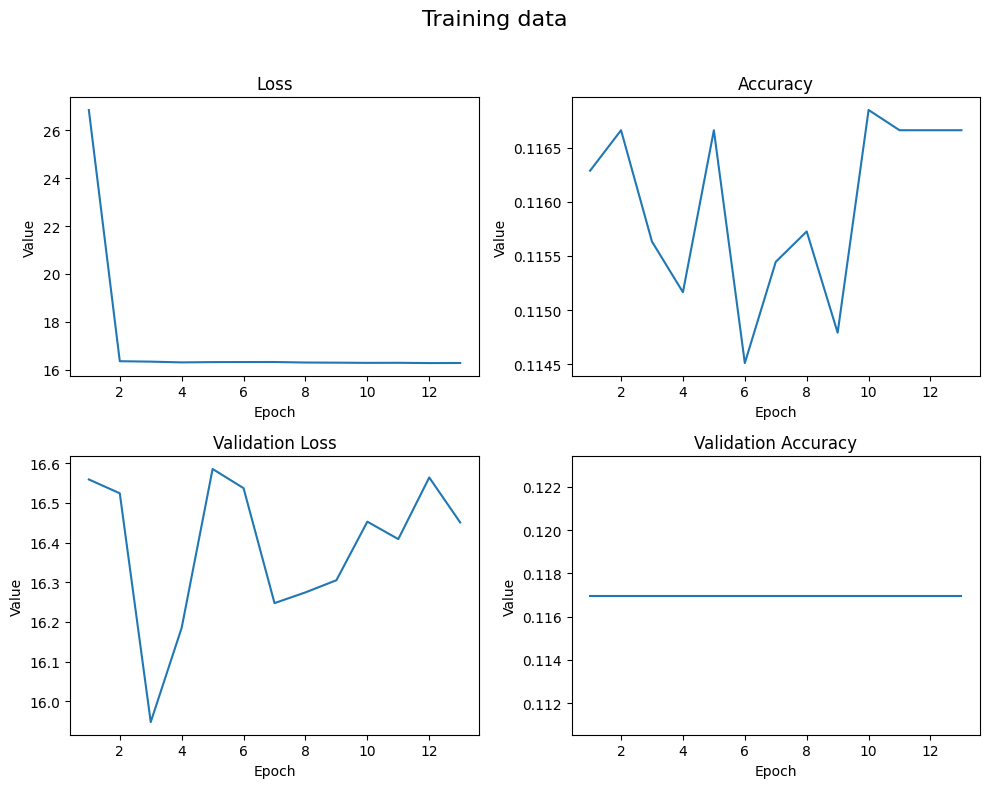

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

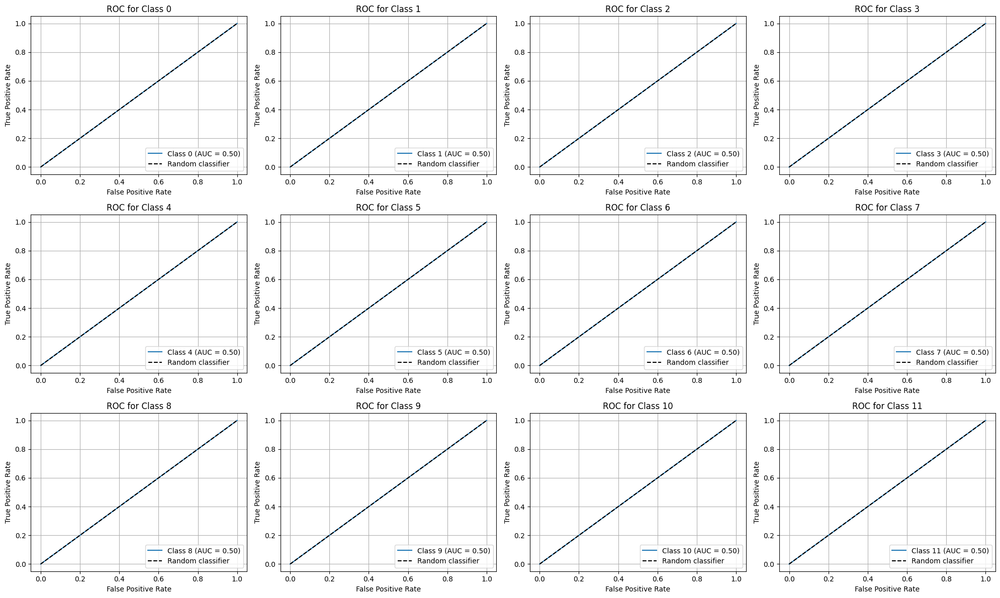

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

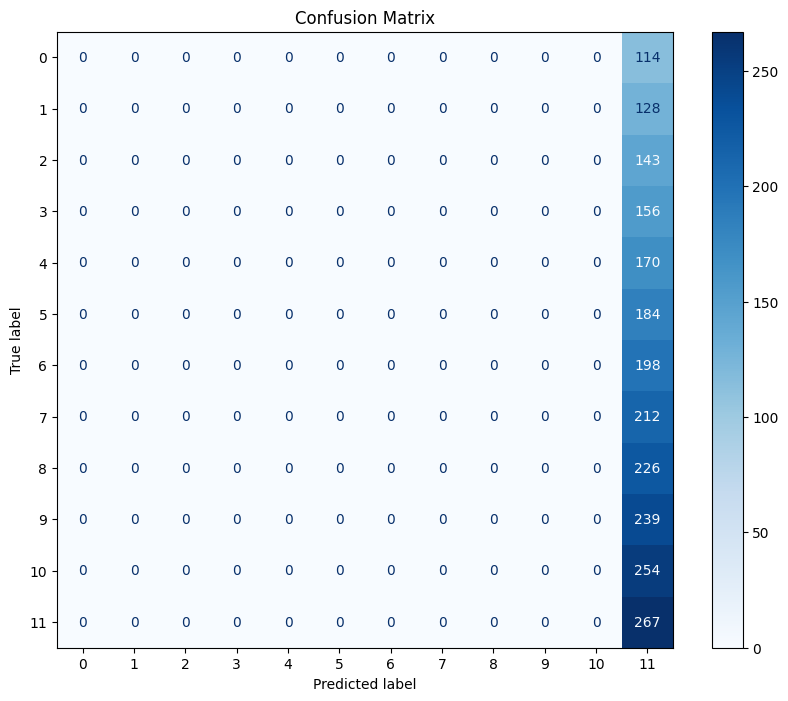

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.116542994325622


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       114
           1       0.00      0.00      0.00       128
           2       0.00      0.00      0.00       143
           3       0.00      0.00      0.00       156
           4       0.00      0.00      0.00       170
           5       0.00      0.00      0.00       184
           6       0.00      0.00      0.00       198
           7       0.00      0.00      0.00       212
           8       0.00      0.00      0.00       226
           9       0.00      0.00      0.00       239
          10       0.00      0.00      0.00       254
          11       0.12      1.00      0.21       267

    accuracy                           0.12      2291
   macro avg       0.01      0.08      0.02      2291
weighted avg       0.01      0.12      0.02      2291



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Model l1 = 0.001

In [ ]:
inputs = Input(shape=input_shape)
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l1(0.001))(inputs)
x = MaxPool2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l1(0.001))(x)
x = MaxPool2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l1(0.001))(x)
x = MaxPool2D((2, 2))(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l1(0.001))(x)
outputs = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_14 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_31 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_31 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_32 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_32 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_33 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_33 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_14 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_28 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_29 (Dense)                     │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,170,508 (42.61 MB)

 Trainable params: 11,170,508 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

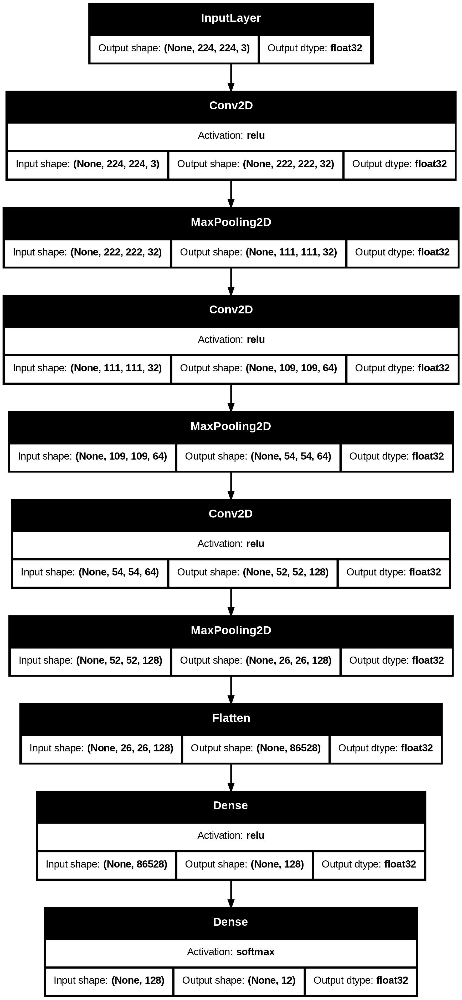

In [ ]:
try:
    plot_model(model, 'model2_l1_0001.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_l1_0001.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - accuracy: 0.1111 - loss: 9.7101 - val_accuracy: 0.1602 - val_loss: 4.1198
Epoch 2/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1746 - loss: 4.0166 - val_accuracy: 0.1951 - val_loss: 3.9200
Epoch 3/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.2053 - loss: 3.8677 - val_accuracy: 0.1929 - val_loss: 3.8950
Epoch 4/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.2270 - loss: 3.8408 - val_accuracy: 0.2427 - val_loss: 3.8111
Epoch 5/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.2703 - loss: 3.7912 - val_accuracy: 0.2584 - val_loss: 3.8061
Epoch 6/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.2921 - loss: 3.7043 - val_accuracy: 0.2737 - val_loss: 3.7830
Epoch 7/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.3045 - loss: 3.7013 - val_accuracy: 0.2876 - val_loss: 3.7067
Epoch 8/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.3166 - loss: 3.6580 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_l1_0001 - loss: {loss}, accuracy: {acc}')

model2_l1_0001 - loss: 3.0954582691192627, accuracy: 0.7542557716369629


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[5.6921305656433105,
 3.952061653137207,
 3.853496789932251,
 3.817591667175293,
 3.7679193019866943,
 3.6810200214385986,
 3.661489486694336,
 3.636915445327759,
 3.602545976638794,
 3.5844743251800537,
 3.559593915939331,
 3.559601306915283,
 3.5430736541748047,
 3.6826891899108887,
 3.5115458965301514,
 3.499718189239502,
 3.478673219680786,
 3.4695303440093994,
 3.522211790084839,
 3.4346506595611572,
 3.4436891078948975,
 3.427290916442871,
 3.409451723098755,
 3.3941924571990967,
 3.39497971534729,
 3.3898794651031494,
 3.37089467048645,
 3.3519721031188965,
 3.334735631942749,
 3.3408024311065674,
 3.3099422454833984,
 3.3084728717803955,
 3.2966842651367188,
 3.2785298824310303,
 3.341881036758423,
 3.250645637512207,
 3.2384912967681885,
 3.2495779991149902,
 3.1759748458862305,
 3.1848442554473877,
 3.1671009063720703,
 3.125458002090454,
 3.1095123291015625,
 3.0902161598205566,
 3.032458782196045,
 3.0262064933776855,
 3.010331869125366,
 3.005042791366577,
 2.9604091644287

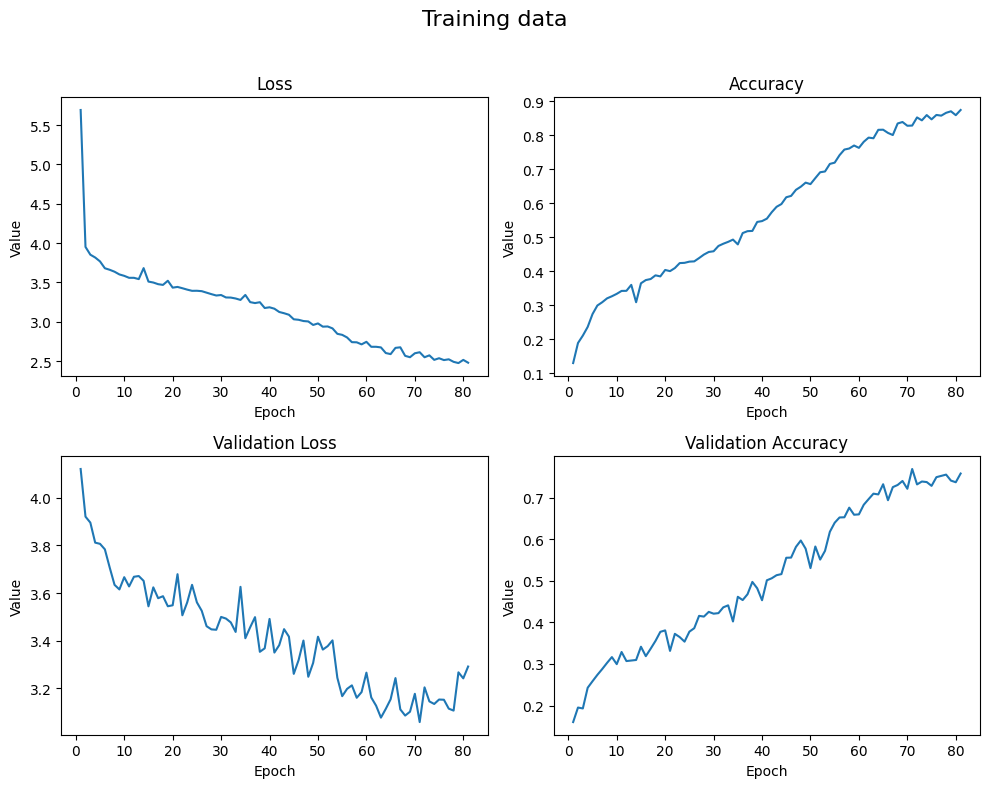

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

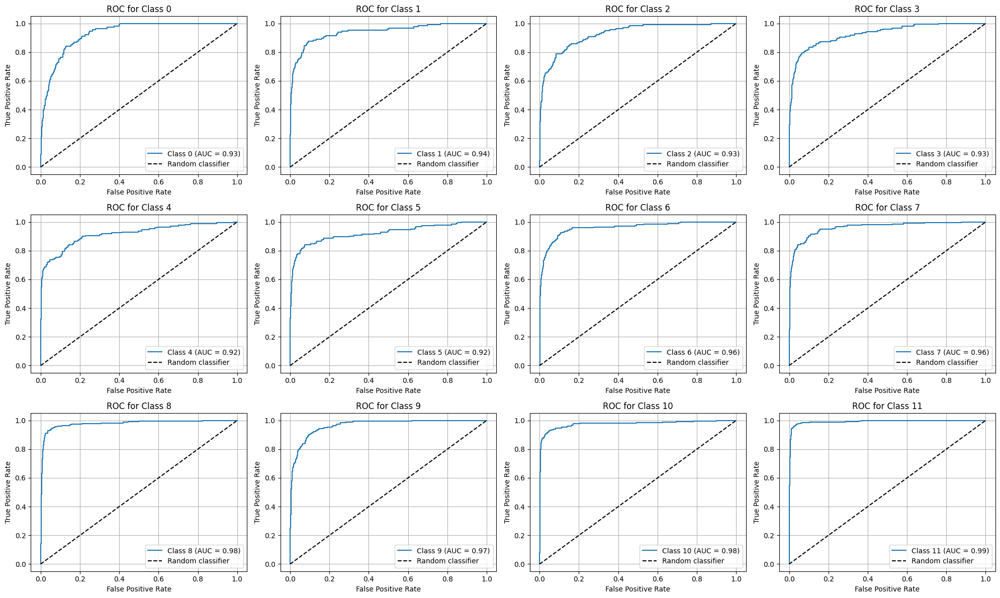

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

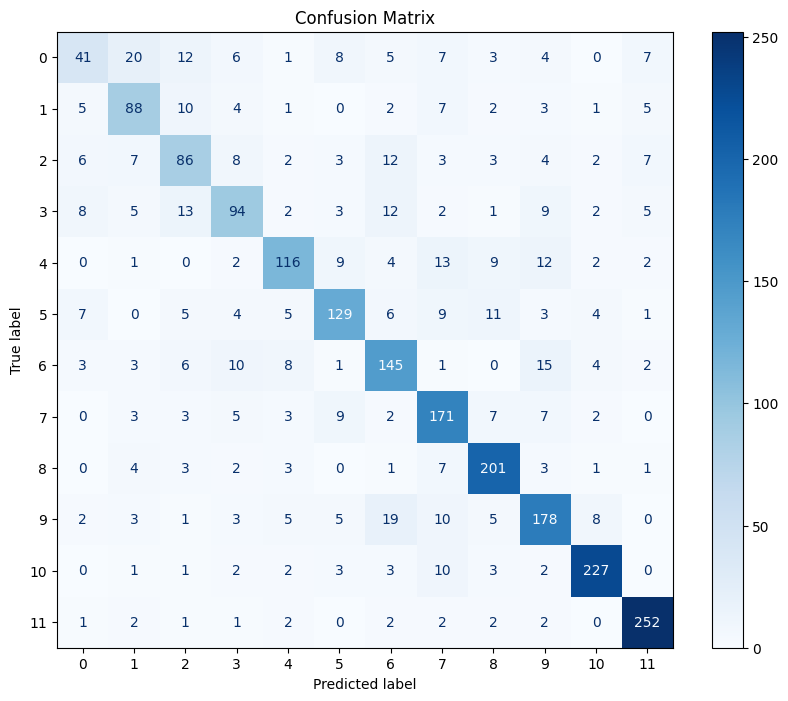

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.7542557835006547


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.56      0.36      0.44       114
           1       0.64      0.69      0.66       128
           2       0.61      0.60      0.61       143
           3       0.67      0.60      0.63       156
           4       0.77      0.68      0.72       170
           5       0.76      0.70      0.73       184
           6       0.68      0.73      0.71       198
           7       0.71      0.81      0.75       212
           8       0.81      0.89      0.85       226
           9       0.74      0.74      0.74       239
          10       0.90      0.89      0.90       254
          11       0.89      0.94      0.92       267

    accuracy                           0.75      2291
   macro avg       0.73      0.72      0.72      2291
weighted avg       0.75      0.75      0.75      2291



## Model l2 = 0.01

In [ ]:
inputs = Input(shape=input_shape)
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l2(0.01))(inputs)
x = MaxPool2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l2(0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l2(0.01))(x)
x = MaxPool2D((2, 2))(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l2(0.01))(x)
outputs = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_15 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_34 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_34 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_35 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_35 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_36 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_36 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_15 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_30 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_31 (Dense)                     │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,170,508 (42.61 MB)

 Trainable params: 11,170,508 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

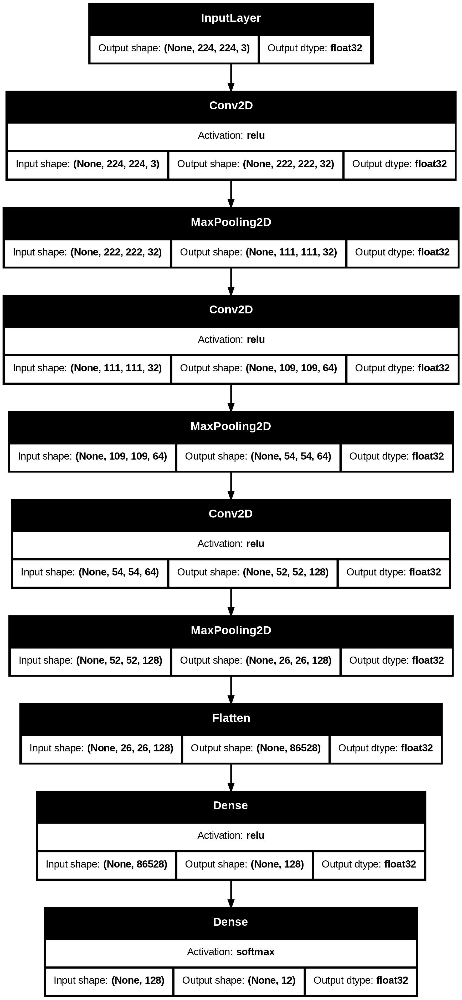

In [ ]:
try:
    plot_model(model, 'model2_l2_001.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_l2_001.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - accuracy: 0.1328 - loss: 3.5444 - val_accuracy: 0.2156 - val_loss: 2.4670
Epoch 2/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.2791 - loss: 2.3836 - val_accuracy: 0.3453 - val_loss: 2.2002
Epoch 3/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.3620 - loss: 2.1468 - val_accuracy: 0.3902 - val_loss: 2.1151
Epoch 4/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.4500 - loss: 1.9672 - val_accuracy: 0.4732 - val_loss: 2.0056
Epoch 5/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.5417 - loss: 1.8152 - val_accuracy: 0.5714 - val_loss: 1.7833
Epoch 6/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.6319 - loss: 1.6443 - val_accuracy: 0.5709 - val_loss: 1.8417
Epoch 7/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.6933 - loss: 1.5563 - val_accuracy: 0.6251 - val_loss: 1.8276
Epoch 8/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.7443 - loss: 1.4170 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_l2_001 - loss: {loss}, accuracy: {acc}')

model2_l2_001 - loss: 1.1939457654953003, accuracy: 0.8834570050239563


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[2.8992130756378174,
 2.3205652236938477,
 2.1124818325042725,
 1.9230226278305054,
 1.7894564867019653,
 1.6507173776626587,
 1.5544257164001465,
 1.4372315406799316,
 1.3581761121749878,
 1.2470134496688843,
 1.2433459758758545,
 1.1558704376220703,
 1.134640097618103,
 1.0735896825790405,
 1.0669289827346802,
 1.0367677211761475,
 1.005683183670044,
 1.021388053894043,
 1.0019692182540894,
 0.9603889584541321,
 0.9339010119438171,
 0.9728862047195435,
 0.946211040019989,
 0.8940686583518982,
 0.9138458967208862,
 0.9500479698181152,
 0.8787246346473694,
 0.893423318862915,
 0.9461777210235596,
 0.8490251898765564,
 0.8858879804611206,
 0.9017517566680908,
 0.855919361114502,
 0.8478253483772278,
 0.876787006855011,
 0.8606418371200562,
 0.8445578217506409,
 0.846696674823761,
 0.9484913349151611,
 0.8039209842681885,
 0.8642622232437134,
 0.834894597530365,
 0.8153592348098755,
 0.8375138640403748,
 0.8113946914672852,
 0.7876786589622498,
 0.8353695869445801,
 0.7948386669158936,
 

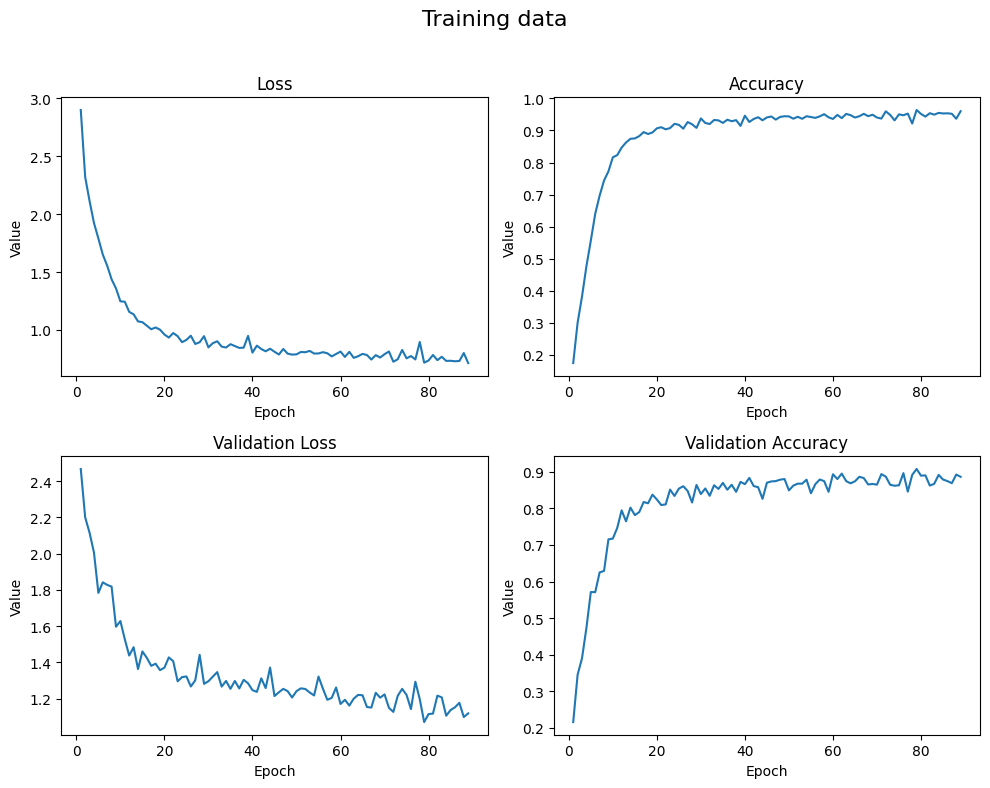

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

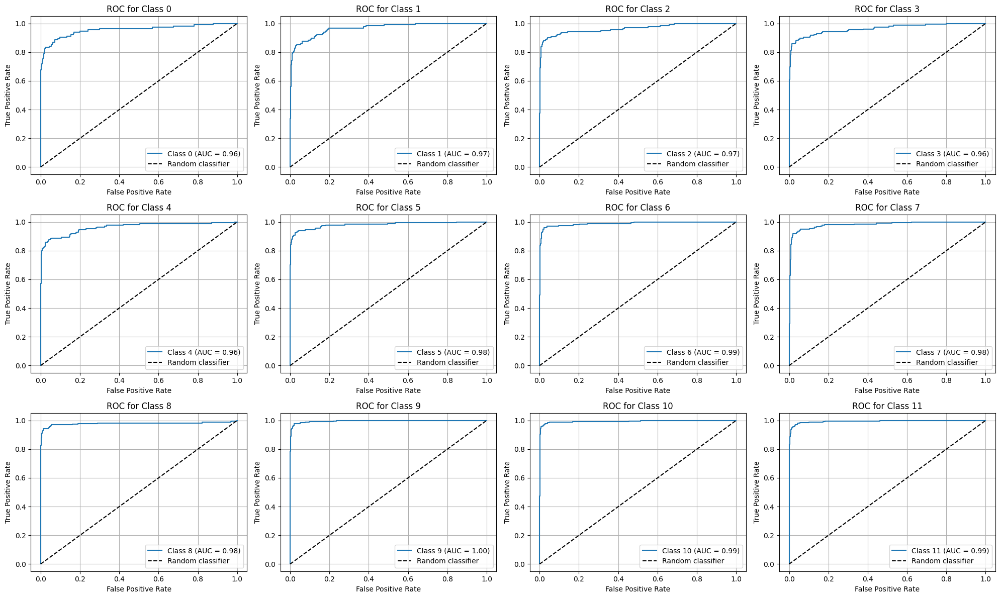

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

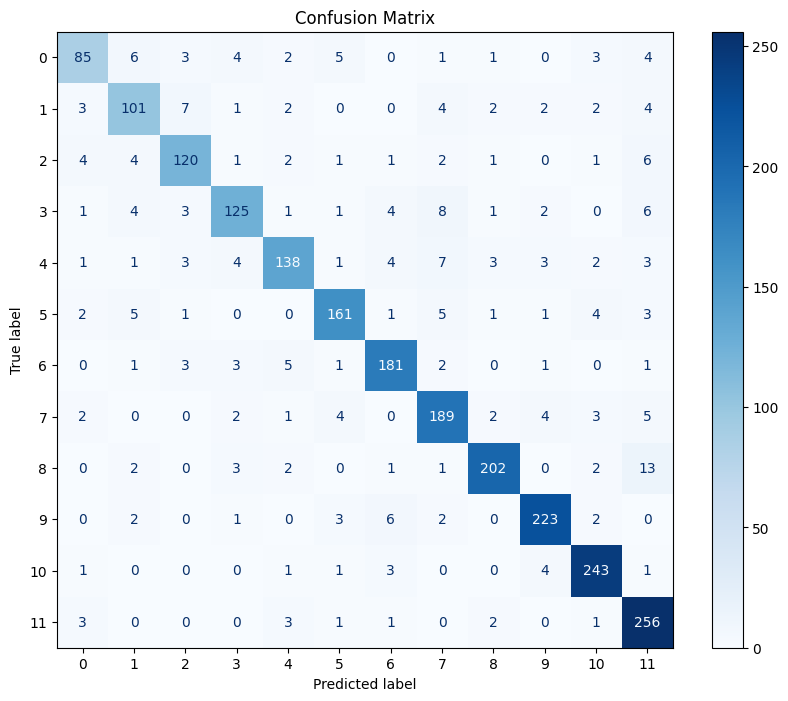

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.883457005674378


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.83      0.75      0.79       114
           1       0.80      0.79      0.80       128
           2       0.86      0.84      0.85       143
           3       0.87      0.80      0.83       156
           4       0.88      0.81      0.84       170
           5       0.90      0.88      0.89       184
           6       0.90      0.91      0.91       198
           7       0.86      0.89      0.87       212
           8       0.94      0.89      0.92       226
           9       0.93      0.93      0.93       239
          10       0.92      0.96      0.94       254
          11       0.85      0.96      0.90       267

    accuracy                           0.88      2291
   macro avg       0.88      0.87      0.87      2291
weighted avg       0.88      0.88      0.88      2291



## Model l2 = 0.001

In [ ]:
inputs = Input(shape=input_shape)
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l2(0.001))(inputs)
x = MaxPool2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l2(0.001))(x)
x = MaxPool2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l2(0.001))(x)
x = MaxPool2D((2, 2))(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(x)
outputs = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_16 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_37 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_37 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_38 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_38 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_39 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_39 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_16 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_32 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_33 (Dense)                     │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,170,508 (42.61 MB)

 Trainable params: 11,170,508 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

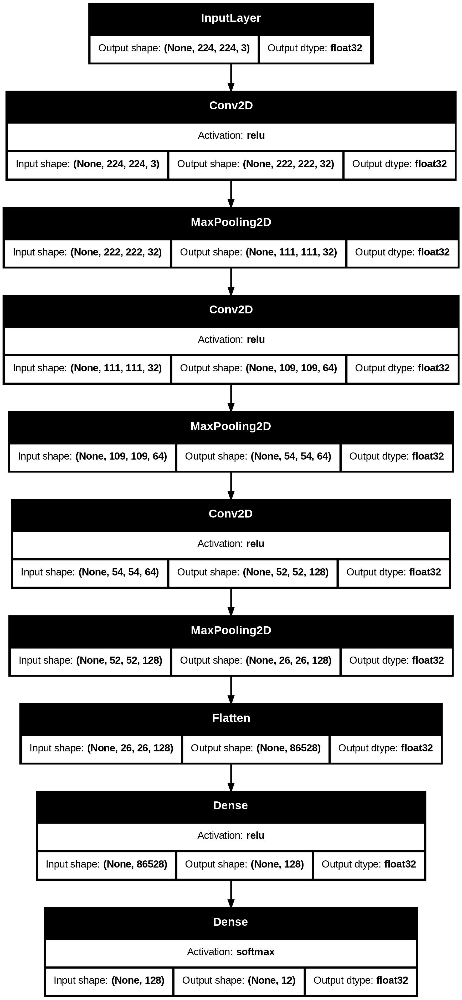

In [ ]:
try:
    plot_model(model, 'model2_l2_0001.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_l2_0001.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - accuracy: 0.2117 - loss: 2.5705 - val_accuracy: 0.5015 - val_loss: 1.7776
Epoch 2/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.5948 - loss: 1.5977 - val_accuracy: 0.7665 - val_loss: 1.2384
Epoch 3/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.8457 - loss: 1.0059 - val_accuracy: 0.8590 - val_loss: 1.0525
Epoch 4/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9389 - loss: 0.7252 - val_accuracy: 0.8835 - val_loss: 1.0014
Epoch 5/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.9632 - loss: 0.6295 - val_accuracy: 0.9053 - val_loss: 0.9132
Epoch 6/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9620 - loss: 0.6181 - val_accuracy: 0.9110 - val_loss: 0.8843
Epoch 7/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.9793 - loss: 0.5423 - val_accuracy: 0.8865 - val_loss: 0.9694
Epoch 8/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9611 - loss: 0.6065 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_l2_0001 - loss: {loss}, accuracy: {acc}')

model2_l2_0001 - loss: 0.7762418389320374, accuracy: 0.9170668125152588


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[2.2325143814086914,
 1.456581473350525,
 0.9886857867240906,
 0.7574597597122192,
 0.6442720293998718,
 0.6278905868530273,
 0.560336709022522,
 0.6010880470275879,
 0.5261355638504028,
 0.5023408532142639,
 0.5674551129341125,
 0.567894458770752,
 0.4259510934352875,
 0.4119623303413391,
 0.5420246720314026,
 0.4969159960746765,
 0.38794252276420593,
 0.37010565400123596,
 0.4966009557247162,
 0.44948479533195496,
 0.39214786887168884,
 0.35696864128112793,
 0.4169843792915344,
 0.4241412580013275,
 0.3782753348350525,
 0.38414666056632996,
 0.3991157114505768,
 0.4108888804912567,
 0.384911447763443,
 0.34853267669677734,
 0.3562275469303131,
 0.43569308519363403]

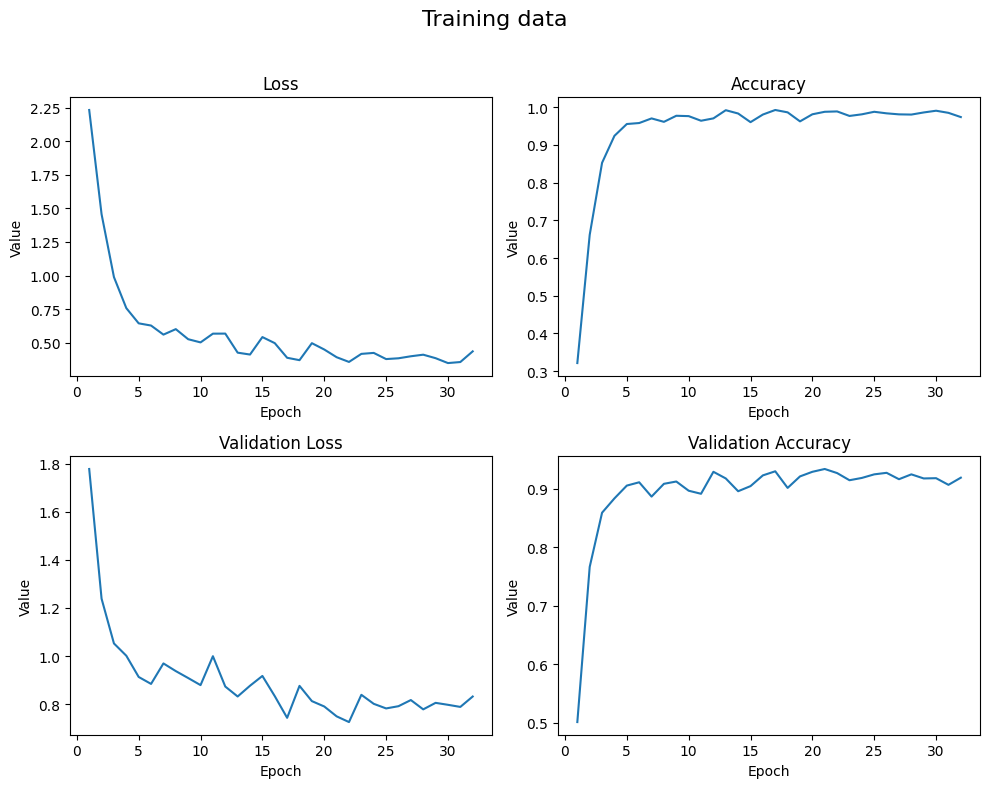

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

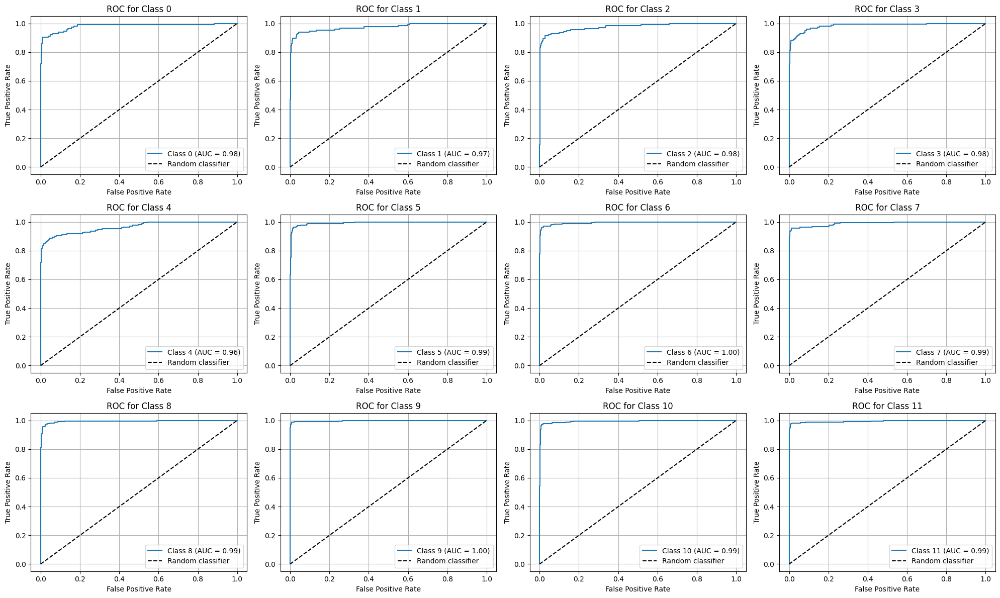

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

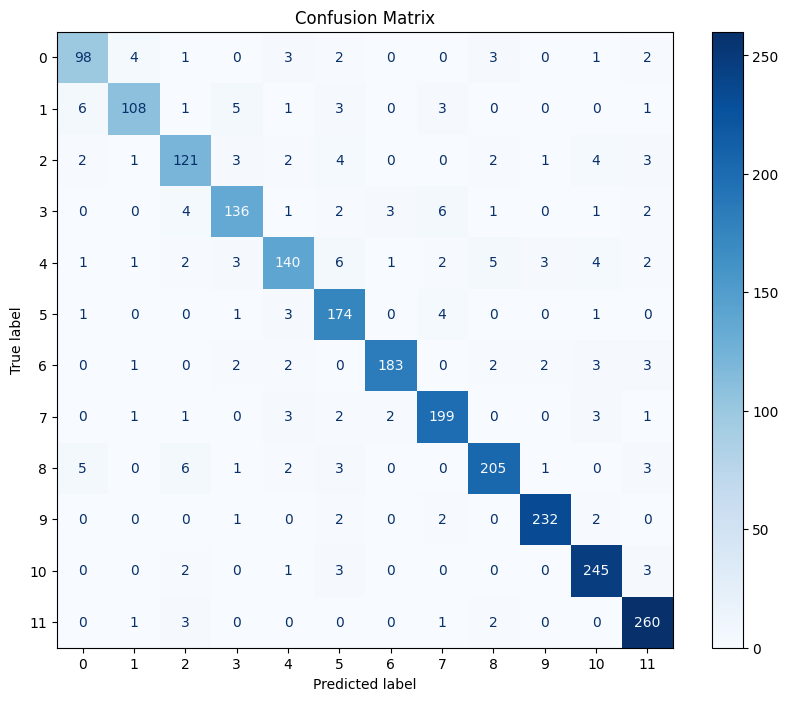

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.9170667830641641


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.86      0.86       114
           1       0.92      0.84      0.88       128
           2       0.86      0.85      0.85       143
           3       0.89      0.87      0.88       156
           4       0.89      0.82      0.85       170
           5       0.87      0.95      0.90       184
           6       0.97      0.92      0.95       198
           7       0.92      0.94      0.93       212
           8       0.93      0.91      0.92       226
           9       0.97      0.97      0.97       239
          10       0.93      0.96      0.95       254
          11       0.93      0.97      0.95       267

    accuracy                           0.92      2291
   macro avg       0.91      0.91      0.91      2291
weighted avg       0.92      0.92      0.92      2291



## Model dropout = 0.2

In [ ]:
inputs = Input(shape=input_shape)
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(inputs)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.2)(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.2)(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.2)(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l1(0.01))(x)
x = Dropout(0.2)(x)
outputs = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_17 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_40 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_40 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_12 (Dropout)                 │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_41 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_41 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_13 (Dropout)                 │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_42 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_42 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_14 (Dropout)                 │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_17 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_34 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_15 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_35 (Dense)                     │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,170,508 (42.61 MB)

 Trainable params: 11,170,508 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

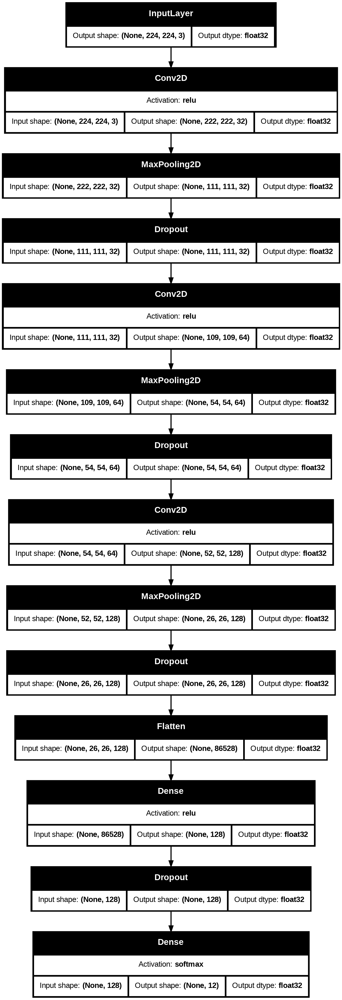

In [ ]:
try:
    plot_model(model, 'model2_dropout_02.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_dropout_02.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - accuracy: 0.1090 - loss: 58.8946 - val_accuracy: 0.1170 - val_loss: 16.3899
Epoch 2/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1080 - loss: 16.2481 - val_accuracy: 0.1170 - val_loss: 16.2071
Epoch 3/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1165 - loss: 16.2099 - val_accuracy: 0.1170 - val_loss: 15.9410
Epoch 4/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1171 - loss: 16.2105 - val_accuracy: 0.1170 - val_loss: 16.1085
Epoch 5/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1176 - loss: 16.1737 - val_accuracy: 0.1170 - val_loss: 16.2907
Epoch 6/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1202 - loss: 16.1387 - val_accuracy: 0.1170 - val_loss: 16.3440
Epoch 7/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1171 - loss: 16.1318 - val_accuracy: 0.1170 - val_loss: 16.0858
Epoch 8/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1125 - 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_dropout_02 - loss: {loss}, accuracy: {acc}')

model2_dropout_02 - loss: 15.940799713134766, accuracy: 0.1165429949760437


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[26.792333602905273,
 16.197452545166016,
 16.211793899536133,
 16.205081939697266,
 16.161680221557617,
 16.132009506225586,
 16.128551483154297,
 16.126962661743164,
 16.123037338256836,
 16.12360191345215,
 16.122037887573242,
 16.121660232543945,
 16.12232208251953]

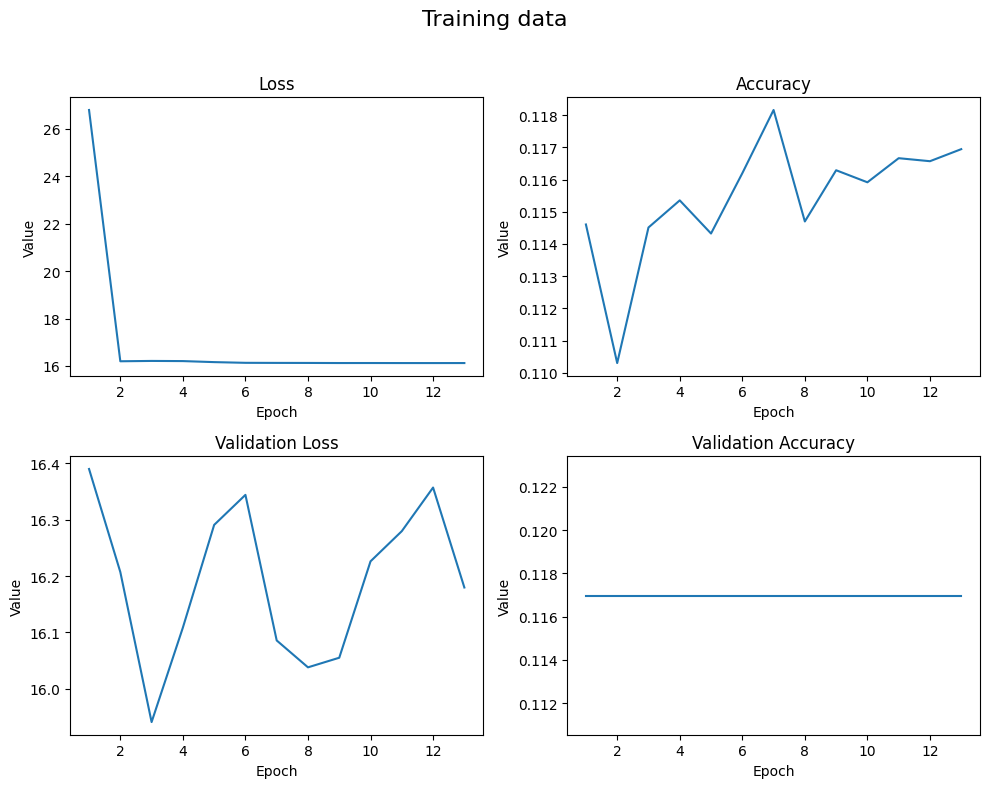

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

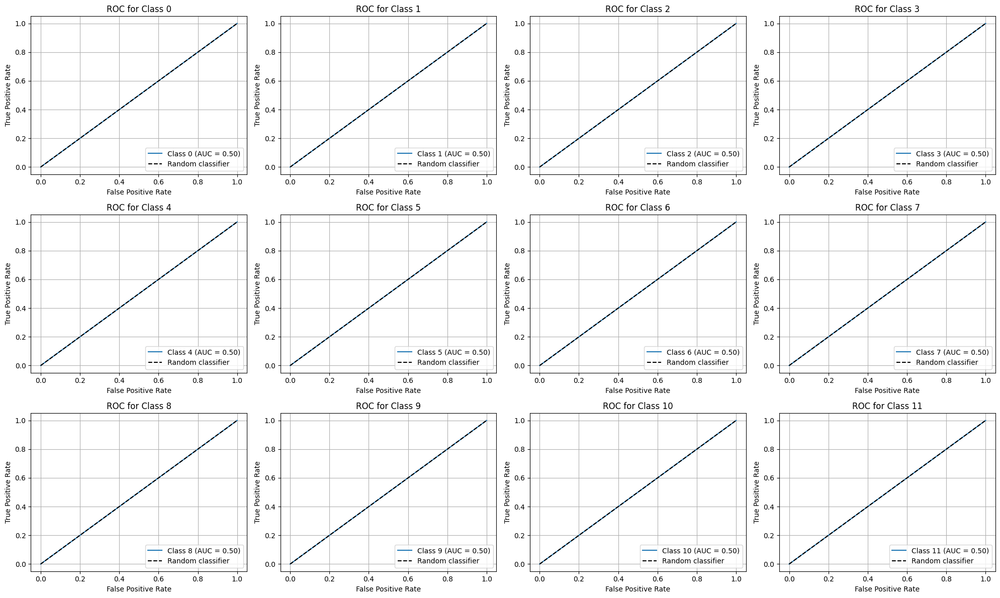

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

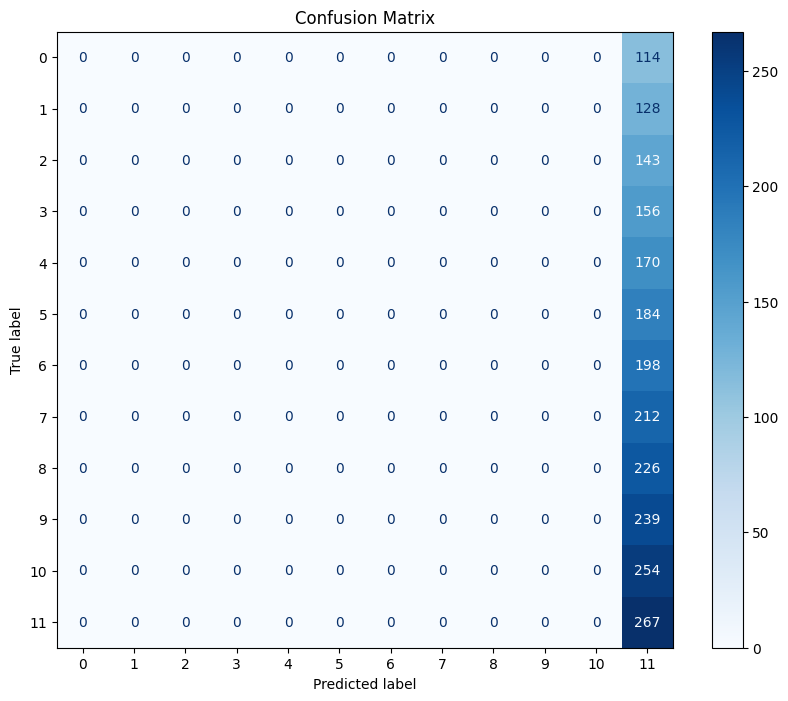

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.116542994325622


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       114
           1       0.00      0.00      0.00       128
           2       0.00      0.00      0.00       143
           3       0.00      0.00      0.00       156
           4       0.00      0.00      0.00       170
           5       0.00      0.00      0.00       184
           6       0.00      0.00      0.00       198
           7       0.00      0.00      0.00       212
           8       0.00      0.00      0.00       226
           9       0.00      0.00      0.00       239
          10       0.00      0.00      0.00       254
          11       0.12      1.00      0.21       267

    accuracy                           0.12      2291
   macro avg       0.01      0.08      0.02      2291
weighted avg       0.01      0.12      0.02      2291



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Model dropout = 0.3

In [ ]:
inputs = Input(shape=input_shape)
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(inputs)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.3)(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.3)(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.3)(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l1(0.01))(x)
x = Dropout(0.3)(x)
outputs = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_18 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_43 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_43 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_16 (Dropout)                 │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_44 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_44 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_17 (Dropout)                 │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_45 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_45 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_18 (Dropout)                 │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_18 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_36 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_19 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_37 (Dense)                     │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,170,508 (42.61 MB)

 Trainable params: 11,170,508 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

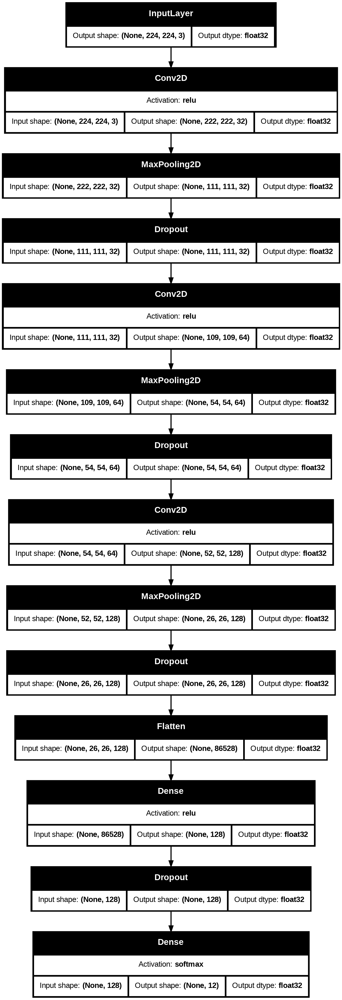

In [ ]:
try:
    plot_model(model, 'model2_dropout_03.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_dropout_03.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - accuracy: 0.1079 - loss: 59.9279 - val_accuracy: 0.1170 - val_loss: 16.0959
Epoch 2/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1107 - loss: 16.0806 - val_accuracy: 0.1170 - val_loss: 16.0647
Epoch 3/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1129 - loss: 16.0466 - val_accuracy: 0.1170 - val_loss: 15.7685
Epoch 4/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1114 - loss: 16.0149 - val_accuracy: 0.1170 - val_loss: 15.9464
Epoch 5/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1133 - loss: 16.0172 - val_accuracy: 0.1170 - val_loss: 16.1213
Epoch 6/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1151 - loss: 16.0143 - val_accuracy: 0.1170 - val_loss: 16.1896
Epoch 7/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - accuracy: 0.1159 - loss: 16.0224 - val_accuracy: 0.1170 - val_loss: 16.0032
Epoch 8/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1151 - 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_dropout_03 - loss: {loss}, accuracy: {acc}')

model2_dropout_03 - loss: 15.768226623535156, accuracy: 0.1165429949760437


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[27.041608810424805,
 16.063993453979492,
 16.03605842590332,
 16.0189266204834,
 16.01856231689453,
 16.017004013061523,
 16.018699645996094,
 16.019107818603516,
 16.018630981445312,
 16.017194747924805,
 16.017044067382812,
 16.017250061035156,
 16.01835823059082]

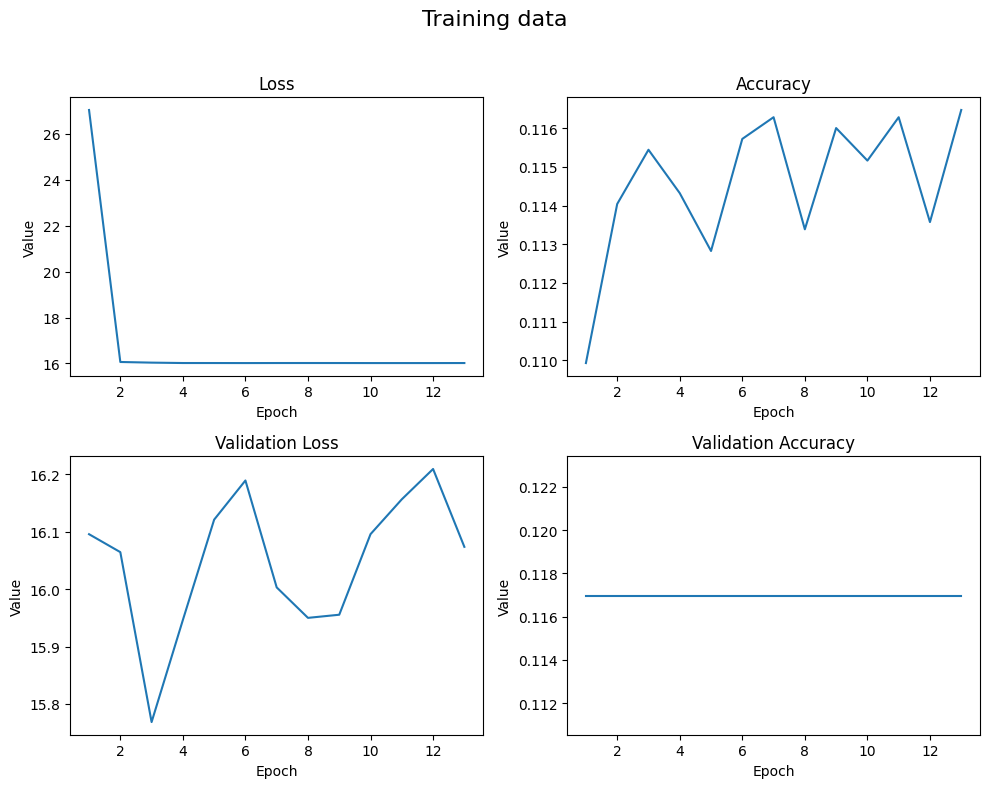

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

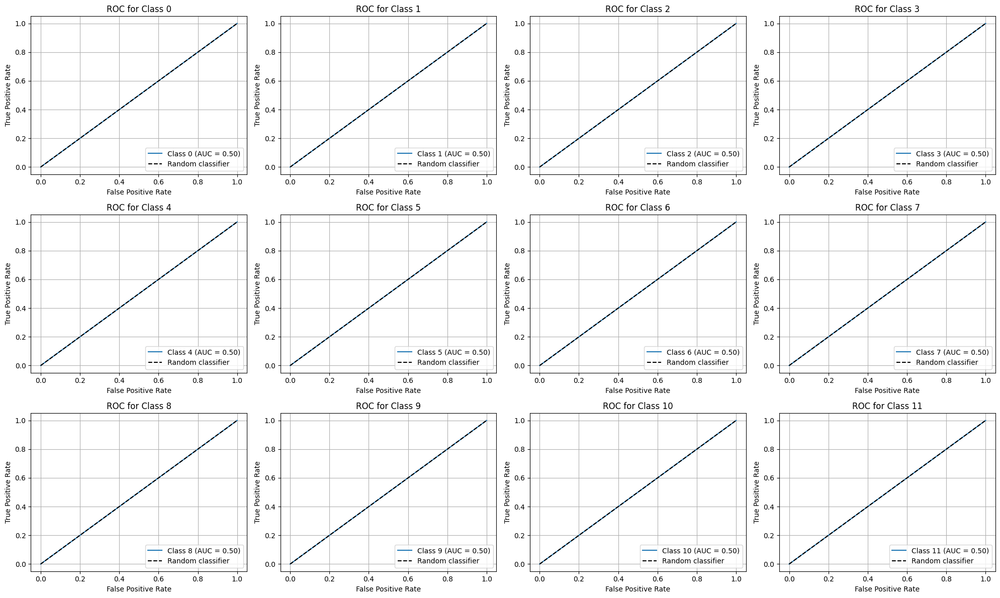

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

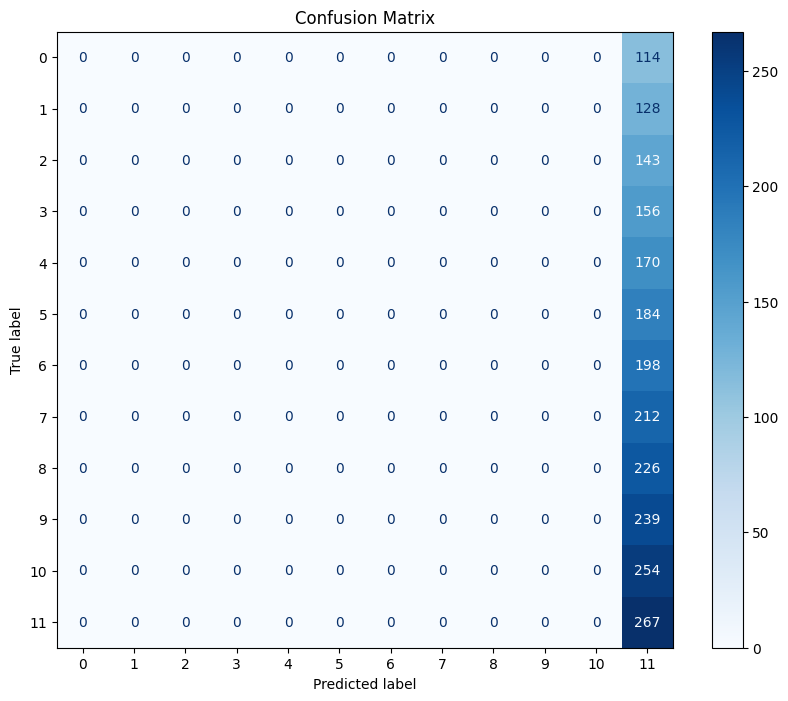

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.116542994325622


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       114
           1       0.00      0.00      0.00       128
           2       0.00      0.00      0.00       143
           3       0.00      0.00      0.00       156
           4       0.00      0.00      0.00       170
           5       0.00      0.00      0.00       184
           6       0.00      0.00      0.00       198
           7       0.00      0.00      0.00       212
           8       0.00      0.00      0.00       226
           9       0.00      0.00      0.00       239
          10       0.00      0.00      0.00       254
          11       0.12      1.00      0.21       267

    accuracy                           0.12      2291
   macro avg       0.01      0.08      0.02      2291
weighted avg       0.01      0.12      0.02      2291



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Model dropout = 0.4

In [ ]:
inputs = Input(shape=input_shape)
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(inputs)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.4)(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.4)(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.4)(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l1(0.01))(x)
x = Dropout(0.4)(x)
outputs = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_19 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_46 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_46 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_20 (Dropout)                 │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_47 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_47 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_21 (Dropout)                 │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_48 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_48 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_22 (Dropout)                 │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_19 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_38 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_23 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_39 (Dense)                     │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,170,508 (42.61 MB)

 Trainable params: 11,170,508 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

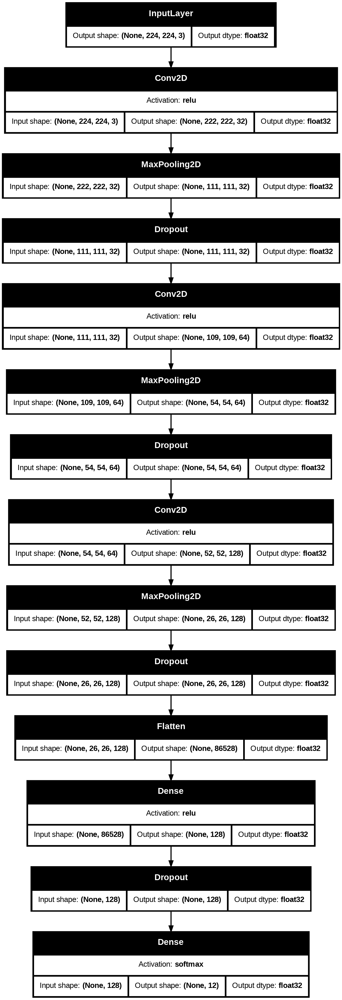

In [ ]:
try:
    plot_model(model, 'model2_dropout_04.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_dropout_04.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - accuracy: 0.1103 - loss: 61.0386 - val_accuracy: 0.1170 - val_loss: 16.2327
Epoch 2/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1131 - loss: 16.2074 - val_accuracy: 0.1170 - val_loss: 16.1306
Epoch 3/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1102 - loss: 16.1762 - val_accuracy: 0.1170 - val_loss: 15.9368
Epoch 4/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1170 - loss: 16.1629 - val_accuracy: 0.1170 - val_loss: 16.1052
Epoch 5/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1144 - loss: 16.1702 - val_accuracy: 0.1170 - val_loss: 16.2464
Epoch 6/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1139 - loss: 16.1697 - val_accuracy: 0.1104 - val_loss: 16.3263
Epoch 7/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1148 - loss: 16.1721 - val_accuracy: 0.1170 - val_loss: 16.1852
Epoch 8/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1132 - 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_dropout_04 - loss: {loss}, accuracy: {acc}')

model2_dropout_04 - loss: 15.93659496307373, accuracy: 0.1165429949760437


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[27.477920532226562,
 16.187204360961914,
 16.17433738708496,
 16.16899299621582,
 16.171350479125977,
 16.169164657592773,
 16.17236328125,
 16.17170524597168,
 16.172151565551758,
 16.170408248901367,
 16.170244216918945,
 16.170246124267578,
 16.17190170288086]

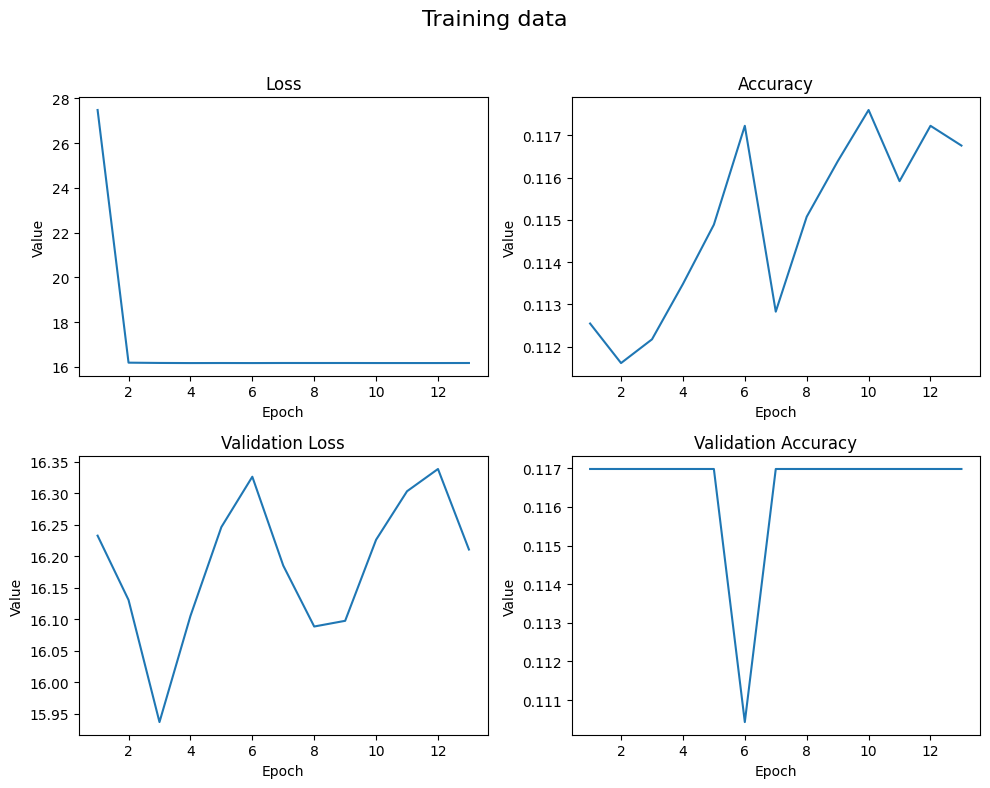

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

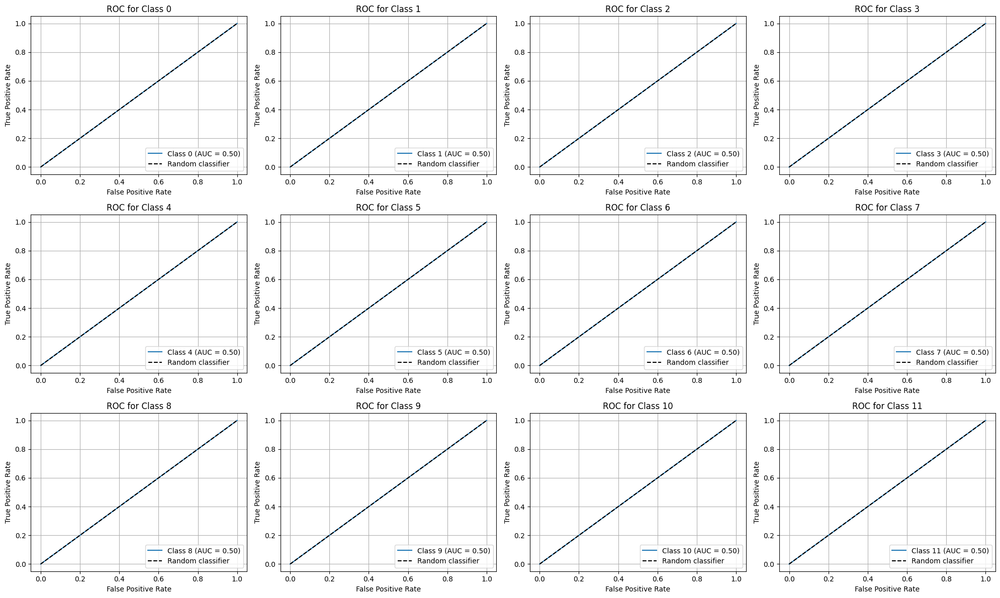

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

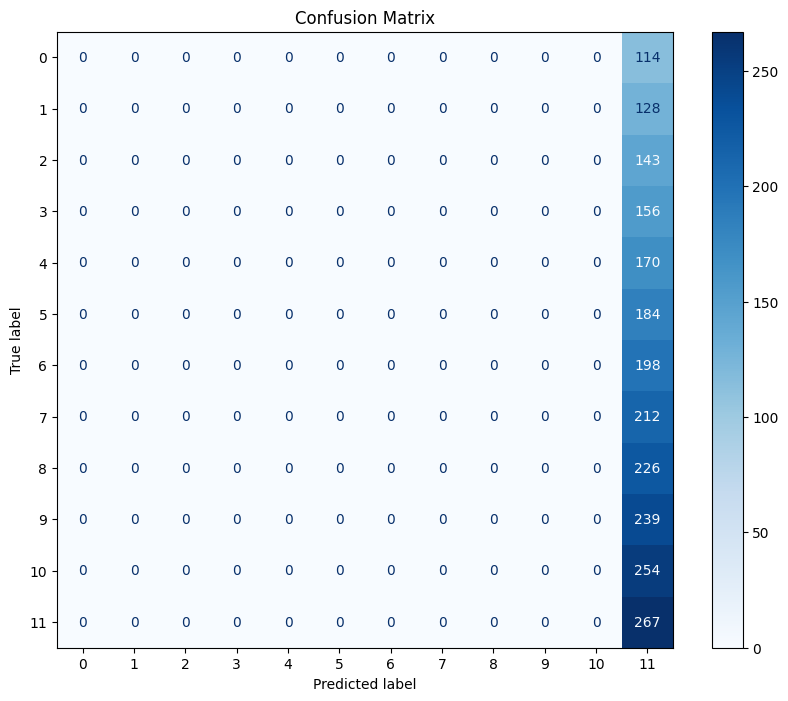

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.116542994325622


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       114
           1       0.00      0.00      0.00       128
           2       0.00      0.00      0.00       143
           3       0.00      0.00      0.00       156
           4       0.00      0.00      0.00       170
           5       0.00      0.00      0.00       184
           6       0.00      0.00      0.00       198
           7       0.00      0.00      0.00       212
           8       0.00      0.00      0.00       226
           9       0.00      0.00      0.00       239
          10       0.00      0.00      0.00       254
          11       0.12      1.00      0.21       267

    accuracy                           0.12      2291
   macro avg       0.01      0.08      0.02      2291
weighted avg       0.01      0.12      0.02      2291



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Model batch normalization

In [ ]:
inputs = Input(shape=input_shape)
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(inputs)
x = BatchNormalization()(x)
x = MaxPool2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = BatchNormalization()(x)
x = MaxPool2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = BatchNormalization()(x)
x = MaxPool2D((2, 2))(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l1(0.01))(x)
x = BatchNormalization()(x)
outputs = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_20 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_49 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 222, 222, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_49 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_50 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 109, 109, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_50 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_51 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 52, 52, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_51 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_20 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_40 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_41 (Dense)                     │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,171,916 (42.62 MB)

 Trainable params: 11,171,212 (42.61 MB)

 Non-trainable params: 704 (2.75 KB)

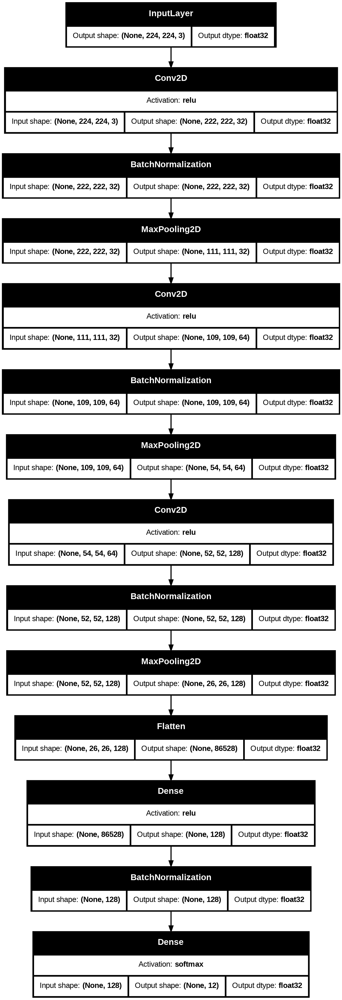

In [ ]:
try:
    plot_model(model, 'model2_batchnorm.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_batchnorm.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - accuracy: 0.1829 - loss: 92.7924 - val_accuracy: 0.1200 - val_loss: 33.0520
Epoch 2/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - accuracy: 0.2113 - loss: 32.2575 - val_accuracy: 0.1323 - val_loss: 28.6409
Epoch 3/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - accuracy: 0.2828 - loss: 28.1071 - val_accuracy: 0.2811 - val_loss: 24.0017
Epoch 4/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - accuracy: 0.3477 - loss: 21.9718 - val_accuracy: 0.2431 - val_loss: 19.1551
Epoch 5/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - accuracy: 0.3747 - loss: 18.2407 - val_accuracy: 0.3370 - val_loss: 17.8725
Epoch 6/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - accuracy: 0.3994 - loss: 17.7645 - val_accuracy: 0.3156 - val_loss: 18.4088
Epoch 7/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - accuracy: 0.4189 - loss: 18.0006 - val_accuracy: 0.4068 - val_loss: 18.0205
Epoch 8/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - accuracy: 0.4414 - 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_batchnorm - loss: {loss}, accuracy: {acc}')

model2_batchnorm - loss: 14.361571311950684, accuracy: 0.6787428855895996


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[51.16996383666992,
 31.09314727783203,
 27.046039581298828,
 20.580703735351562,
 18.084850311279297,
 17.86598014831543,
 17.9615478515625,
 17.69768714904785,
 17.741376876831055,
 17.006662368774414,
 16.774250030517578,
 16.483016967773438,
 16.483308792114258,
 15.800419807434082,
 15.661948204040527,
 15.51771068572998,
 15.53021240234375,
 15.23019027709961,
 15.161600112915039,
 15.156577110290527,
 15.06808853149414,
 14.93189525604248,
 14.901268005371094,
 14.839760780334473,
 14.98349380493164,
 14.818634986877441,
 14.757558822631836,
 14.87070369720459,
 14.846222877502441,
 14.894143104553223,
 14.82966423034668,
 14.778706550598145,
 14.736934661865234,
 14.602743148803711,
 14.604392051696777,
 14.561284065246582,
 14.520210266113281,
 14.617768287658691,
 14.534311294555664,
 14.529211044311523,
 14.631817817687988,
 14.365630149841309,
 14.408035278320312,
 14.432408332824707,
 14.393608093261719,
 14.358628273010254,
 14.423095703125,
 14.405434608459473,
 14.37484

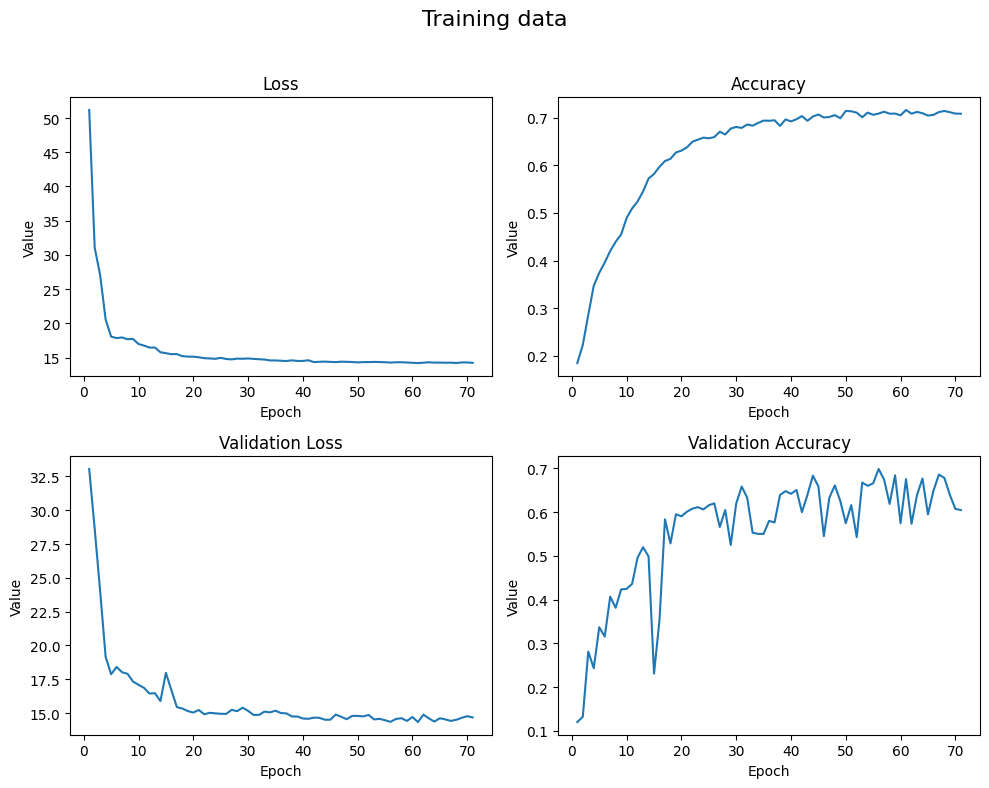

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

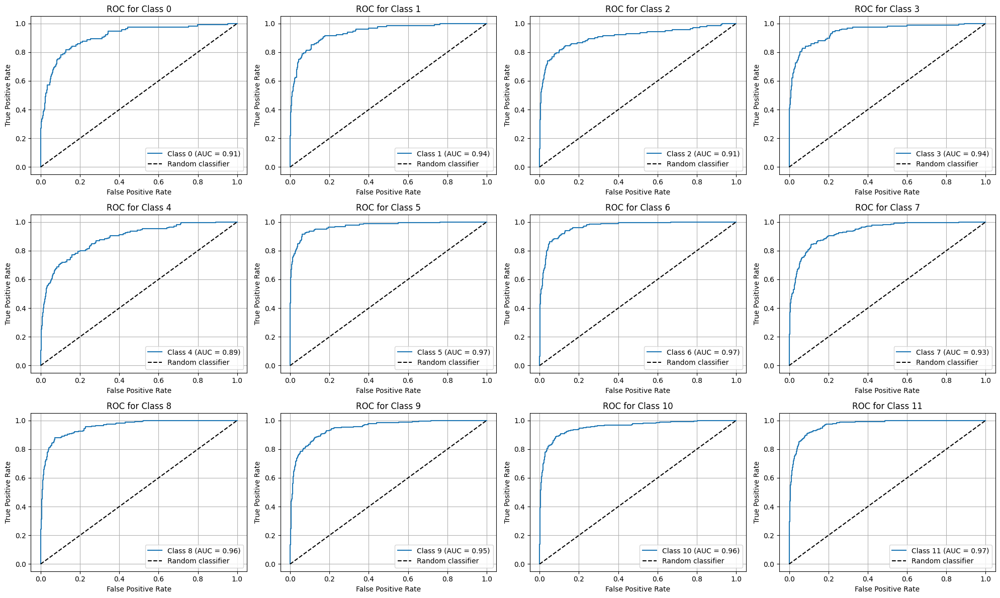

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

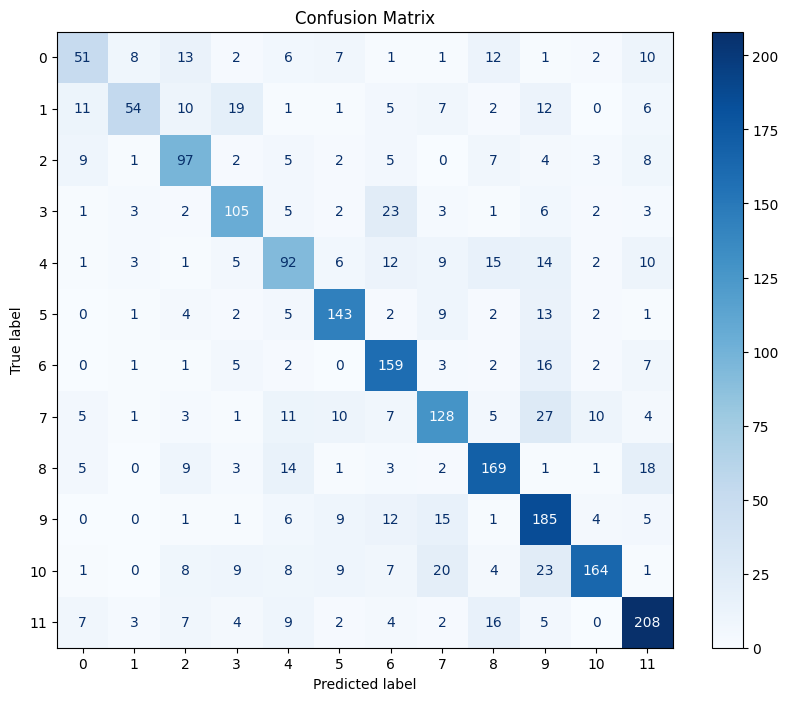

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.678742907027499


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.56      0.45      0.50       114
           1       0.72      0.42      0.53       128
           2       0.62      0.68      0.65       143
           3       0.66      0.67      0.67       156
           4       0.56      0.54      0.55       170
           5       0.74      0.78      0.76       184
           6       0.66      0.80      0.73       198
           7       0.64      0.60      0.62       212
           8       0.72      0.75      0.73       226
           9       0.60      0.77      0.68       239
          10       0.85      0.65      0.74       254
          11       0.74      0.78      0.76       267

    accuracy                           0.68      2291
   macro avg       0.67      0.66      0.66      2291
weighted avg       0.68      0.68      0.68      2291



## Model elasticnet (l1 = 0.01; l2 = 0.01)

In [ ]:
inputs = Input(shape=X_train.shape[1:])
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l1_l2(l1=0.01, l2=0.01))(inputs)
x = MaxPool2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l1_l2(l1=0.01, l2=0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l1_l2(l1=0.01, l2=0.01))(x)
x = MaxPool2D((2, 2))(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l1_l2(l1=0.01, l2=0.01))(x)
outputs = Dense(len(np.unique(y_train)), activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_21 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_52 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_52 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_53 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_53 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_54 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_54 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_21 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_42 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_43 (Dense)                     │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,170,508 (42.61 MB)

 Trainable params: 11,170,508 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

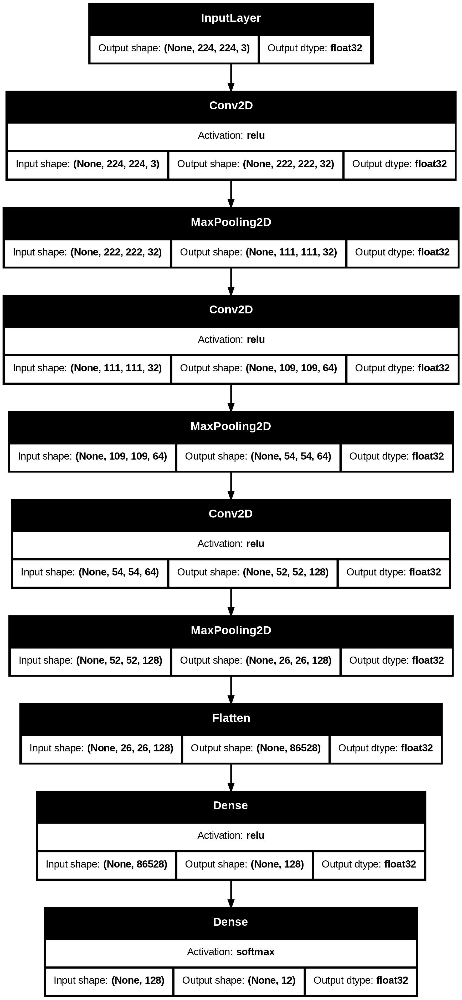

In [ ]:
try:
    plot_model(model, 'model2_l1_l2.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_l1_l2.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10,
                                                  restore_best_weights=True, verbose=1)

epochs = 100
batch_size = 32

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - accuracy: 0.1099 - loss: 59.4085 - val_accuracy: 0.1170 - val_loss: 16.6145
Epoch 2/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1161 - loss: 16.4359 - val_accuracy: 0.1170 - val_loss: 16.4487
Epoch 3/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1143 - loss: 16.1676 - val_accuracy: 0.1170 - val_loss: 16.0172
Epoch 4/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1187 - loss: 16.1401 - val_accuracy: 0.1170 - val_loss: 16.1164
Epoch 5/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1188 - loss: 16.2114 - val_accuracy: 0.1170 - val_loss: 16.3765
Epoch 6/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1076 - loss: 16.2526 - val_accuracy: 0.1170 - val_loss: 16.7245
Epoch 7/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1182 - loss: 16.4693 - val_accuracy: 0.1170 - val_loss: 16.6509
Epoch 8/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1175 - 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_l1_l2 - loss: {loss}, accuracy: {acc}')

model2_l1_l2 - loss: 16.016948699951172, accuracy: 0.1165429949760437


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[27.19370460510254,
 16.352699279785156,
 16.118022918701172,
 16.17030143737793,
 16.21002197265625,
 16.285429000854492,
 16.535259246826172,
 16.66001319885254,
 16.669343948364258,
 16.670255661010742,
 16.67693328857422,
 16.682559967041016,
 16.683305740356445]

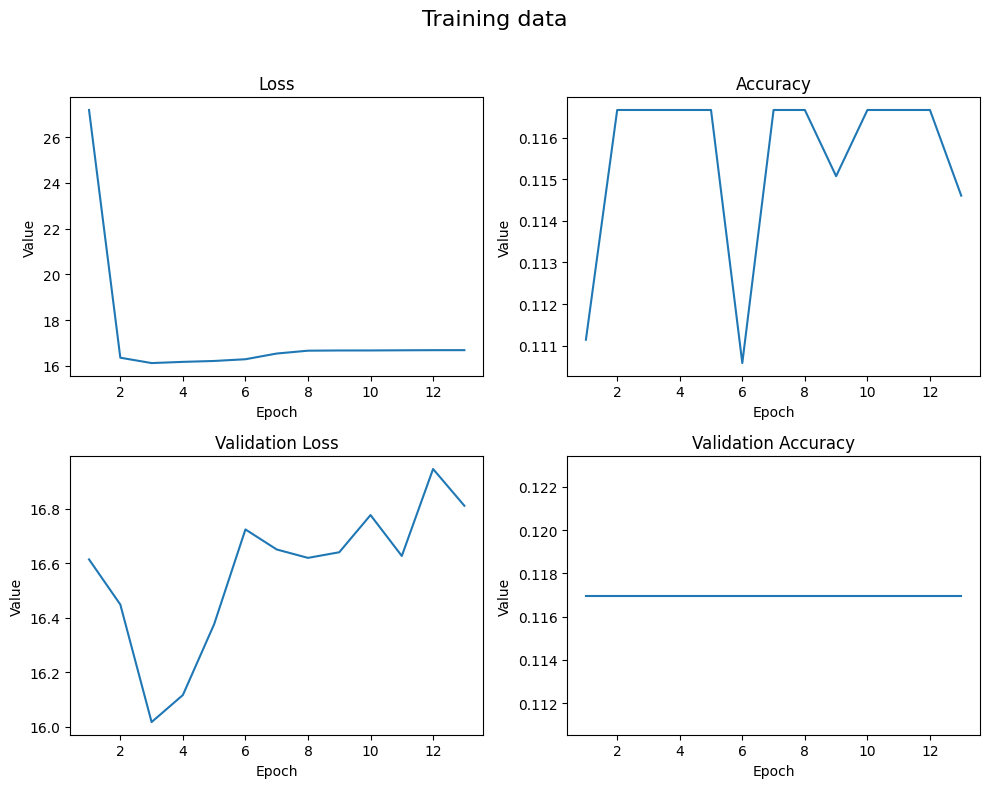

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

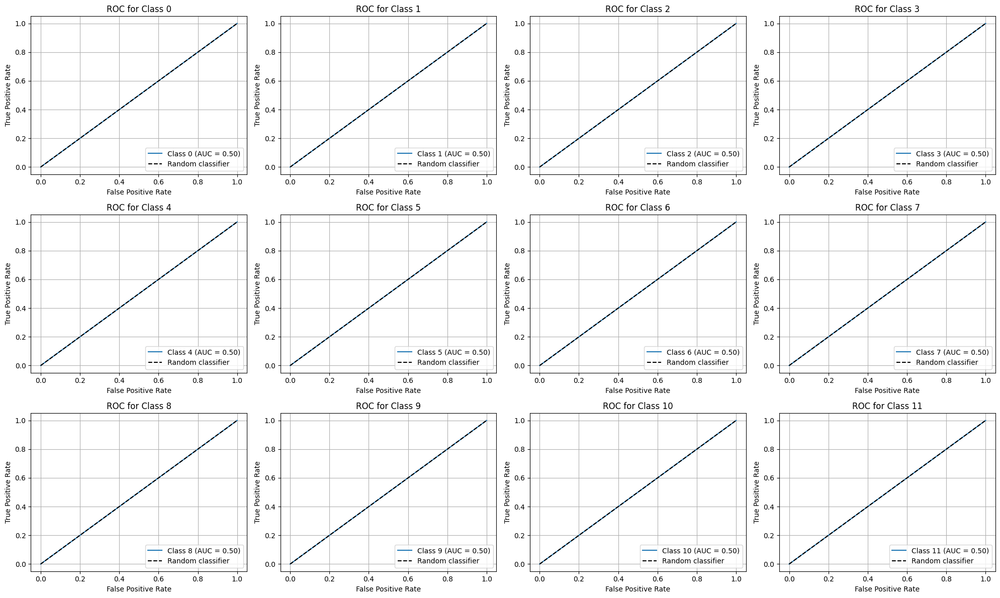

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

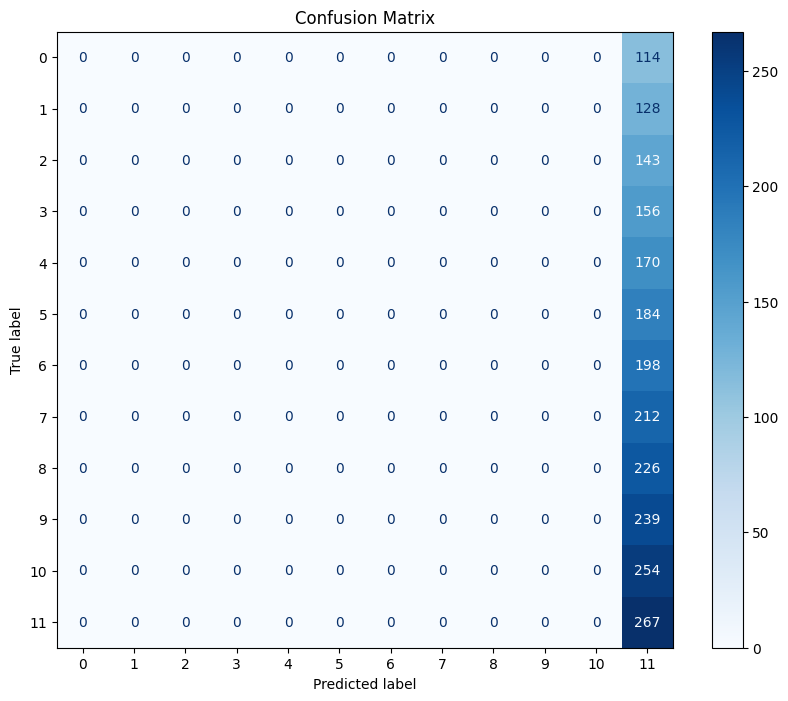

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.116542994325622


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       114
           1       0.00      0.00      0.00       128
           2       0.00      0.00      0.00       143
           3       0.00      0.00      0.00       156
           4       0.00      0.00      0.00       170
           5       0.00      0.00      0.00       184
           6       0.00      0.00      0.00       198
           7       0.00      0.00      0.00       212
           8       0.00      0.00      0.00       226
           9       0.00      0.00      0.00       239
          10       0.00      0.00      0.00       254
          11       0.12      1.00      0.21       267

    accuracy                           0.12      2291
   macro avg       0.01      0.08      0.02      2291
weighted avg       0.01      0.12      0.02      2291



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Model batchnormalization and dropout = 0.03

In [ ]:
inputs = Input(shape=X_train.shape[1:])
x = Conv2D(32, (3, 3), activation='relu')(inputs)
x = BatchNormalization()(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.3)(x)
x = Conv2D(64, (3, 3), activation='relu')(x)
x = BatchNormalization()(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.3)(x)
x = Conv2D(128, (3, 3), activation='relu')(x)
x = BatchNormalization()(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.3)(x)

x = Flatten()(x)
x = Dense(128, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)
outputs = Dense(len(np.unique(y_train)), activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_22 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_55 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_10               │ (None, 222, 222, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_55 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_24 (Dropout)                 │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_56 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_11               │ (None, 109, 109, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_56 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_25 (Dropout)                 │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_57 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_12               │ (None, 52, 52, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_57 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_26 (Dropout)                 │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_22 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_44 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_13               │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_27 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_45 (Dense)                     │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,171,916 (42.62 MB)

 Trainable params: 11,171,212 (42.61 MB)

 Non-trainable params: 704 (2.75 KB)

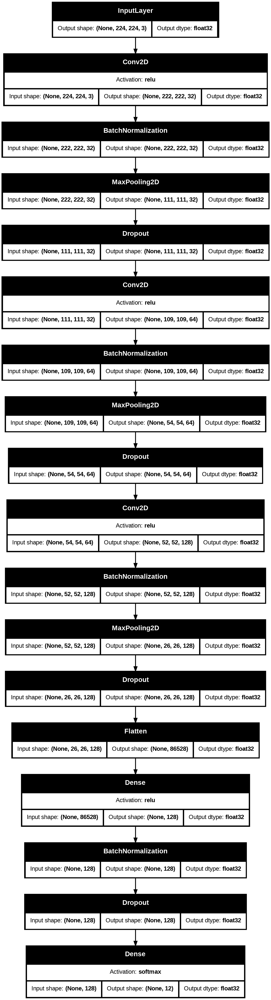

In [ ]:
try:
    plot_model(model, 'model2_dropout_batchnorm.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_dropout_batchnorm.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - accuracy: 0.2808 - loss: 2.3658 - val_accuracy: 0.1440 - val_loss: 8.5545
Epoch 2/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.6982 - loss: 0.9803 - val_accuracy: 0.5089 - val_loss: 2.0886
Epoch 3/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.8575 - loss: 0.4894 - val_accuracy: 0.8769 - val_loss: 0.6013
Epoch 4/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.9701 - loss: 0.1381 - val_accuracy: 0.9302 - val_loss: 0.2917
Epoch 5/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.9868 - loss: 0.0644 - val_accuracy: 0.9406 - val_loss: 0.2270
Epoch 6/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.9910 - loss: 0.0429 - val_accuracy: 0.9245 - val_loss: 0.3001
Epoch 7/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.9948 - loss: 0.0350 - val_accuracy: 0.9463 - val_loss: 0.2742
Epoch 8/100
335/335 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.9915 - loss: 0.0391 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_dropout_batchnorm - loss: {loss}, accuracy: {acc}')

model2_dropout_batchnorm - loss: 0.278570294380188, accuracy: 0.9432561993598938


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[1.9811885356903076,
 0.8569456934928894,
 0.3835521936416626,
 0.12768898904323578,
 0.059824828058481216,
 0.048794303089380264,
 0.03773045912384987,
 0.044097308069467545,
 0.05701702833175659,
 0.05248076096177101,
 0.05058373138308525,
 0.06003929302096367,
 0.04963332787156105,
 0.040174417197704315,
 0.04388537257909775,
 0.030255664139986038,
 0.0182602871209383,
 0.013261361047625542,
 0.011060335673391819,
 0.011904904618859291,
 0.020059973001480103,
 0.02670467644929886,
 0.035702869296073914,
 0.034819163382053375,
 0.019313432276248932,
 0.014861329458653927,
 0.019009113311767578,
 0.01436370424926281]

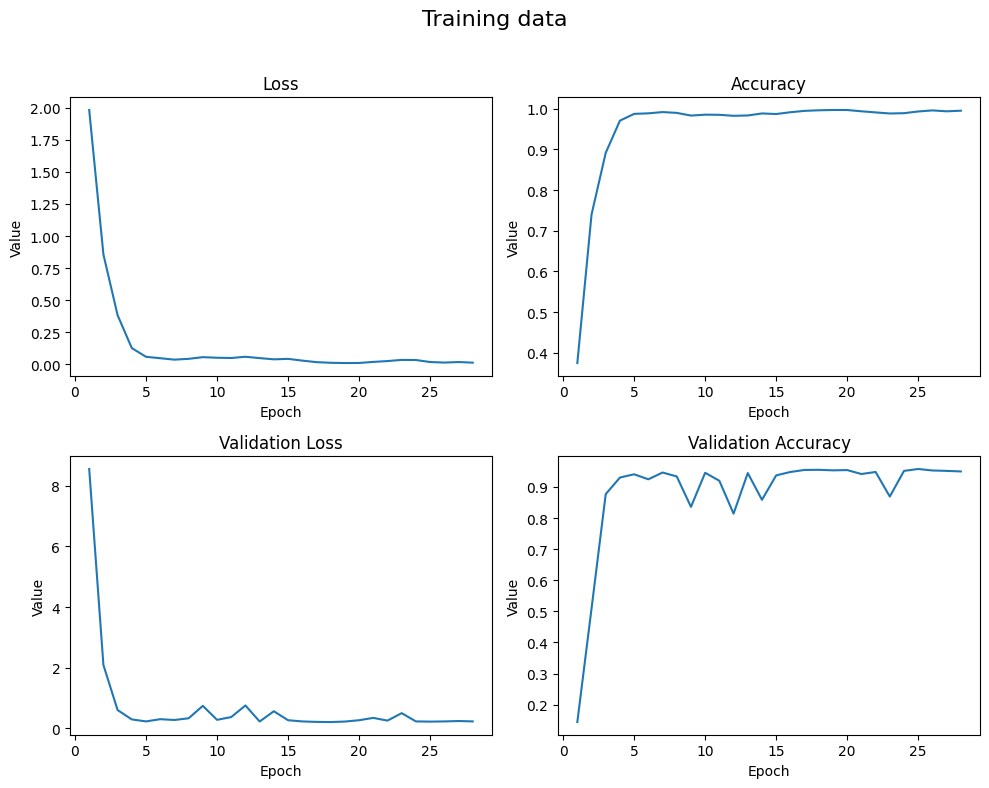

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

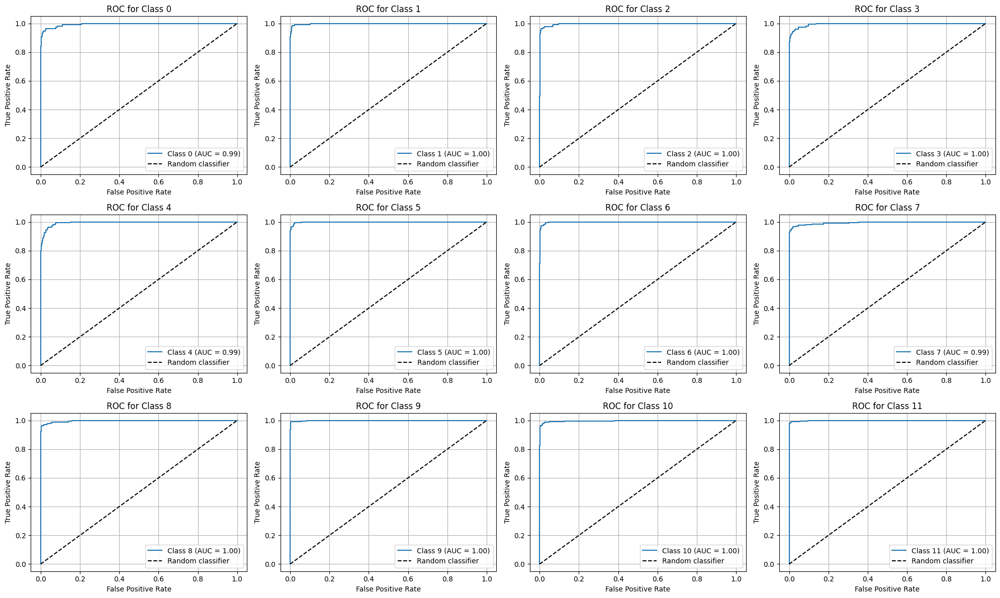

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

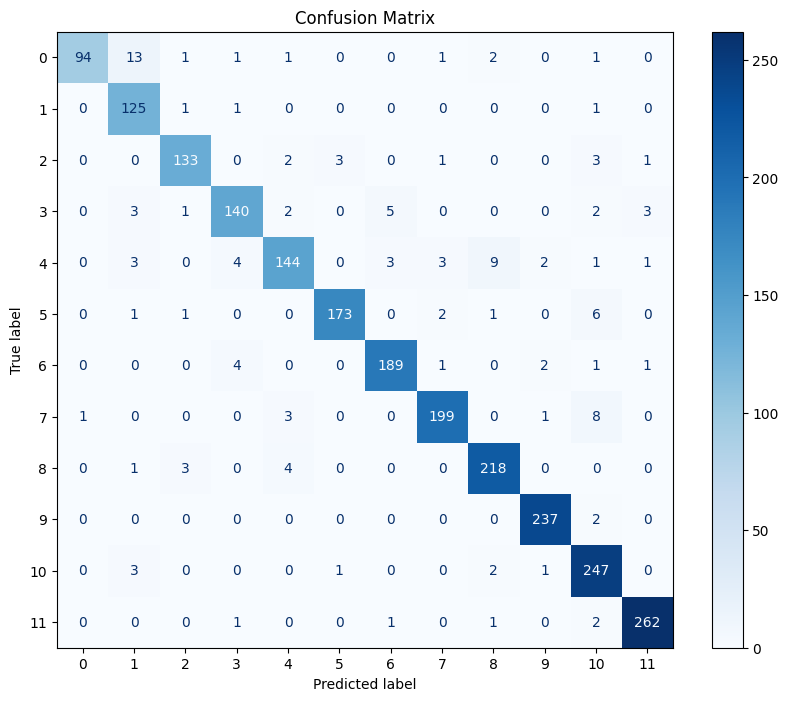

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.9432562199912702


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.82      0.90       114
           1       0.84      0.98      0.90       128
           2       0.95      0.93      0.94       143
           3       0.93      0.90      0.91       156
           4       0.92      0.85      0.88       170
           5       0.98      0.94      0.96       184
           6       0.95      0.95      0.95       198
           7       0.96      0.94      0.95       212
           8       0.94      0.96      0.95       226
           9       0.98      0.99      0.98       239
          10       0.90      0.97      0.94       254
          11       0.98      0.98      0.98       267

    accuracy                           0.94      2291
   macro avg       0.94      0.93      0.94      2291
weighted avg       0.94      0.94      0.94      2291

